In [137]:
from datetime import datetime
import gc
from itertools import product
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import scipy
import warnings


import lightgbm as lgb
import optuna
from optuna.integration import LightGBMPruningCallback
from optuna.visualization.matplotlib import plot_optimization_history, plot_param_importances
import pandas as pd
from pandas.api.types import is_datetime64_any_dtype as is_datetime
from pandas.api.types import is_categorical_dtype
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler, LabelEncoder, StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
import tensorflow as tf

matplotlib.rcParams['figure.dpi'] = 100
sns.set()
sns.set_style("whitegrid")
%matplotlib inline
warnings.simplefilter('ignore')

**Usefull functions**

In [184]:
## Memory optimization

# Original code from https://www.kaggle.com/code/rohanrao/ashrae-half-and-half/notebook
def reduce_mem_usage(df, use_float16=False):
    """
    Iterate through all the columns of a dataframe and modify the data type to reduce memory usage.        
    """
    
    start_mem = df.memory_usage().sum() / 1024**2
    print("Memory usage of dataframe is {:.2f} MB".format(start_mem))
    
    for col in df.columns:
        if is_datetime(df[col]) or is_categorical_dtype(df[col]):
            continue
        col_type = df[col].dtype
        
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == "int":
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if use_float16 and c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
#        else:
#            df[col] = df[col].astype("category")

    end_mem = df.memory_usage().sum() / 1024**2
    print("Memory usage after optimization is: {:.2f} MB".format(end_mem))
    print("Decreased by {:.1f}%".format(100 * (start_mem - end_mem) / start_mem))
    
    return df

In [139]:
# Perform a one hot encoding
def one_hot(train, feature, test=None):
    train2 = train.copy()
    train2[f'{feature}s'] = train2[feature]
    train2 = pd.get_dummies(train2, columns=[feature], prefix=[f'{feature}_'])
    if test is None:
        return(train2)
    else:
        test2 = test.copy()
        test2[f'{feature}s'] = test2[feature]
        test2 = pd.get_dummies(test2, columns=[feature], prefix=[f'{feature}_'])
        return(train2, test2)

# Perform a label encoding
def label_encode(train, feature, test=None):
    le = LabelEncoder()
    train2 = train.copy()
    train2[feature] = le.fit_transform(train2[feature])
    if test is None:
        return(train2)
    else:
        test2 = test.copy()
        test2[feature] = le.transform(test2[feature])
        return(train2, test2)

# Extract time features
def extract_time_features(train, time_feature, test=None):
    train['month'] = train[time_feature].dt.month
    train['weekday'] = train[time_feature].dt.weekday
    train['hour'] = train[time_feature].dt.hour
    train['day'] = train[time_feature].dt.day
    train.sort_values(time_feature, inplace=True)
    train.reset_index(drop=True, inplace=True)
    
    if test is None:
        return(train)
    
    else:
        test['month'] = test[time_feature].dt.month
        test['weekday'] = test[time_feature].dt.weekday
        test['hour'] = test[time_feature].dt.hour
        test['day'] = test[time_feature].dt.day
        test.sort_values(time_feature, inplace=True)
        test.reset_index(drop=True, inplace=True)
        return(train, test)
        
# Add holidays based on a list of public holidays dates
def add_holidays(train, holidays, test=None):
    train["is_holiday"] = (train['timestamp'].dt.date.astype("str").isin(holidays)).astype(int)
    if test is None:
        return(train)
    else:
        test["is_holiday"] = (test['timestamp'].dt.date.astype("str").isin(holidays)).astype(int)
        return(train, test)

# Scale data using minmax scaler
def scale_numerical_feature(train, num_features, test=None):
    scaler = MinMaxScaler()
    train2 = train.copy()
    train2[num_features] = scaler.fit_transform(train2[num_features])
    if test is None:
        return(train2)
    else:
        test2 = test.copy()
        test2[num_features] = scaler.transform(test2[num_features])
    return(train2, test2)

# Data Loading & Exploration

In [186]:
# Load all the data from csv
train_raw = pd.read_csv("train.csv", sep = ',')
test_raw = pd.read_csv("test.csv", sep = ',')
b_meta = pd.read_csv("building_metadata.csv",sep = ',')
w_train = pd.read_csv("weather_train.csv",sep = ',')
w_test = pd.read_csv("weather_test.csv",sep = ',')
sample = pd.read_csv("sample_submission.csv",sep = ',')

In [187]:
# Reduce memory usage to preserve RAM
train_raw = reduce_mem_usage(train_raw, use_float16=True)
test_raw = reduce_mem_usage(test_raw, use_float16=True)
b_meta = reduce_mem_usage(b_meta, use_float16=True)
w_train = reduce_mem_usage(w_train, use_float16=True)
w_test = reduce_mem_usage(w_test, use_float16=True)
sample = reduce_mem_usage(sample, use_float16=True)

Memory usage of dataframe is 616.95 MB
Memory usage after optimization is: 289.19 MB
Decreased by 53.1%
Memory usage of dataframe is 1272.51 MB
Memory usage after optimization is: 596.49 MB
Decreased by 53.1%
Memory usage of dataframe is 0.07 MB
Memory usage after optimization is: 0.03 MB
Decreased by 60.3%
Memory usage of dataframe is 9.60 MB
Memory usage after optimization is: 3.07 MB
Decreased by 68.1%
Memory usage of dataframe is 19.04 MB
Memory usage after optimization is: 6.08 MB
Decreased by 68.1%
Memory usage of dataframe is 636.26 MB
Memory usage after optimization is: 198.83 MB
Decreased by 68.7%


Explore the number of rows and columns per dataframe

In [142]:
tables = [train_raw, test_raw, b_meta, w_train, w_test, sample]
table_names = ['train_raw', 'test_raw', 'b_meta', 'w_train', 'w_test', 'sample']
for name, i in zip(table_names,tables):
    print(f"table en cours d'étude: {name}")
    print(i.columns)
    print(i.shape,'\n')

table en cours d'étude: train_raw
Index(['building_id', 'meter', 'timestamp', 'meter_reading'], dtype='object')
(20216100, 4) 

table en cours d'étude: test_raw
Index(['row_id', 'building_id', 'meter', 'timestamp'], dtype='object')
(41697600, 4) 

table en cours d'étude: b_meta
Index(['site_id', 'building_id', 'primary_use', 'square_feet', 'year_built',
       'floor_count'],
      dtype='object')
(1449, 6) 

table en cours d'étude: w_train
Index(['site_id', 'timestamp', 'air_temperature', 'cloud_coverage',
       'dew_temperature', 'precip_depth_1_hr', 'sea_level_pressure',
       'wind_direction', 'wind_speed'],
      dtype='object')
(139773, 9) 

table en cours d'étude: w_test
Index(['site_id', 'timestamp', 'air_temperature', 'cloud_coverage',
       'dew_temperature', 'precip_depth_1_hr', 'sea_level_pressure',
       'wind_direction', 'wind_speed'],
      dtype='object')
(277243, 9) 

table en cours d'étude: sample
Index(['row_id', 'meter_reading'], dtype='object')
(41697600, 2) 



## General Analysis

We will explore at high level the different dataframes by:
- giving the **meaning of each column**
- see if there are any **NaN values**
- see if there are any **duplicate values**

### Train_raw

- `building_id` - Foreign key for the building metadata.

- `meter` - The meter id code. Read as {0: electricity, 1: chilledwater, 2: steam, 3: hotwater}. Not every building has all meter types.

- `timestamp` - When the measurement was taken

- `meter_reading` - The target variable. Energy consumption in kWh (or equivalent). Note that this is real data with measurement error, which we expect will impose a baseline level of modeling error. UPDATE: as discussed here, the site 0 electric meter readings are in kBTU.


__NaN values__

In [200]:
train_raw.isna().any()

building_id      False
meter            False
timestamp        False
meter_reading    False
dtype: bool

__Duplicate__

In [144]:
train_raw.duplicated(subset=['building_id','meter','timestamp'], keep=False).any()

False

### Test_raw

- `row_id` - Row id for your submission file
- `building_id` - Building id code
- `meter` - The meter id code
- `timestamp` - Timestamps for the test data period


__NaN values__

In [199]:
test_raw.isna().any()

row_id         False
building_id    False
meter          False
timestamp      False
dtype: bool

__Duplicate__

In [146]:
test_raw.duplicated(subset=['building_id','meter','timestamp'], keep=False).any()

False

### sample

- `row_id` - Row id for your submission file

- `meter_reading` - The target variable. Energy consumption in kWh (or equivalent). Note that this is real data with measurement error, which we expect will impose a baseline level of modeling error. UPDATE: as discussed here, the site 0 electric meter readings are in kBTU.


__NaN values__

In [198]:
sample.isna().any()

row_id           False
meter_reading    False
dtype: bool

__Duplicate__

In [148]:
sample.duplicated(subset=['row_id'], keep=False).any()

False

### b_meta

- `site_id` - Foreign key for the weather files. 
- `building_id` - Foreign key for training.csv
- `primary_use` - Indicator of the primary category of activities for the building based on EnergyStar property type definitions
- `square_feet` - Gross floor area of the building
- `year_built` - Year building was opened
- `floor_count` - Number of floors of the building


__NaN values__

In [197]:
b_meta.isna().any()

site_id        False
building_id    False
primary_use    False
square_feet    False
year_built      True
floor_count     True
dtype: bool

__Duplicate__

In [150]:
b_meta.duplicated(subset=['building_id'], keep=False).any()

False

### w_train

- `site_id`
- `air_temperature` - Degrees Celsius
- `cloud_coverage` - Portion of the sky covered in clouds, in oktas
- `dew_temperature` - Degrees Celsius
- `precip_depth_1_hr` - Millimeters
- `sea_level_pressure` - Millibar/hectopascals
- `wind_direction` - Compass direction (0-360)
- `wind_speed` - Meters per second


__NaN values__

In [201]:
w_train.isna().any(axis=0)

site_id               False
timestamp             False
air_temperature        True
cloud_coverage         True
dew_temperature        True
precip_depth_1_hr      True
sea_level_pressure     True
wind_direction         True
wind_speed             True
dtype: bool

__Duplicate__

In [152]:
w_train.duplicated(subset=['site_id','timestamp'], keep=False).any()

False

### w_test

- `site_id`
- `air_temperature` - Degrees Celsius
- `cloud_coverage` - Portion of the sky covered in clouds, in oktas
- `dew_temperature` - Degrees Celsius
- `precip_depth_1_hr` - Millimeters
- `sea_level_pressure` - Millibar/hectopascals
- `wind_direction` - Compass direction (0-360)
- `wind_speed` - Meters per second

__NaN values__

In [202]:
w_test.isna().any(axis=0)

site_id               False
timestamp             False
air_temperature        True
cloud_coverage         True
dew_temperature        True
precip_depth_1_hr      True
sea_level_pressure     True
wind_direction         True
wind_speed             True
dtype: bool

__Duplicate__

In [154]:
w_test.duplicated(subset=['site_id','timestamp'], keep=False).any()

False

**CONCLUSION** 

With this high-level analysis, we have seen that 
- there are **some missing values for the weather data and building metadata.**
- we **do not have any duplicated values** so joining table will be safe.

## Joining

In order to analyse, in a more precise way, we will first **join all the data** in order to get the global picture of our dataset

In [188]:
train_full_raw = train_raw.merge(b_meta, how='left', on='building_id')
train_full_raw = train_full_raw.merge(w_train, how='left', on=['site_id','timestamp'])

In [189]:
test_full_raw = test_raw.merge(sample, how='inner', on='row_id')
test_full_raw = test_full_raw.merge(b_meta, how='left', on='building_id')
test_full_raw = test_full_raw.merge(w_test, how='left', on=['site_id','timestamp'])

In [157]:
test_full_raw.drop('row_id',axis=1,inplace=True)

We convert `timetamp` data into a a **datetime** one in order to perform proper analysis 

In [191]:
train_full_raw['timestamp'] = pd.to_datetime(train_full_raw['timestamp'])
test_full_raw['timestamp'] = pd.to_datetime(test_full_raw['timestamp'])

## Analysis train_full_raw & test_full_raw

### Global observations

In [158]:
train_full_raw.columns

Index(['building_id', 'meter', 'timestamp', 'meter_reading', 'site_id',
       'primary_use', 'square_feet', 'year_built', 'floor_count',
       'air_temperature', 'cloud_coverage', 'dew_temperature',
       'precip_depth_1_hr', 'sea_level_pressure', 'wind_direction',
       'wind_speed'],
      dtype='object')

In [159]:
train_full_raw.head()

,building_id,meter,timestamp,meter_reading,site_id,primary_use,square_feet,year_built,floor_count,air_temperature,cloud_coverage,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed
0,0,0,2016-01-01 00:00:00,0.0,0,Education,7432,2008.0,NaN,25.0,6.0,20.0,NaN,1019.5,0.0,0.0
1,1,0,2016-01-01 00:00:00,0.0,0,Education,2720,2004.0,NaN,25.0,6.0,20.0,NaN,1019.5,0.0,0.0
2,2,0,2016-01-01 00:00:00,0.0,0,Education,5376,1991.0,NaN,25.0,6.0,20.0,NaN,1019.5,0.0,0.0
3,3,0,2016-01-01 00:00:00,0.0,0,Education,23685,2002.0,NaN,25.0,6.0,20.0,NaN,1019.5,0.0,0.0
4,4,0,2016-01-01 00:00:00,0.0,0,Education,116607,1975.0,NaN,25.0,6.0,20.0,NaN,1019.5,0.0,0.0


### Missing Values

We will count for each column the **percentage of missing values** in both **train and test sets**

In [160]:
# Count missing values for train set
total_train = train_full_raw.isnull().sum().sort_values(ascending = False)
percent_train = (train_full_raw.isnull().sum()/train_full_raw.isnull().count()*100).sort_values(ascending = False)
missing_val_train = pd.concat([total_train, percent_train], axis=1, keys=['Total', 'Percent'])

In [161]:
# Count missing values for test set
total_test = test_full_raw.isnull().sum().sort_values(ascending = False)
percent_test = (test_full_raw.isnull().sum()/test_full_raw.isnull().count()*100).sort_values(ascending = False)
missing_val_test = pd.concat([total_test, percent_test], axis=1, keys=['Total', 'Percent'])

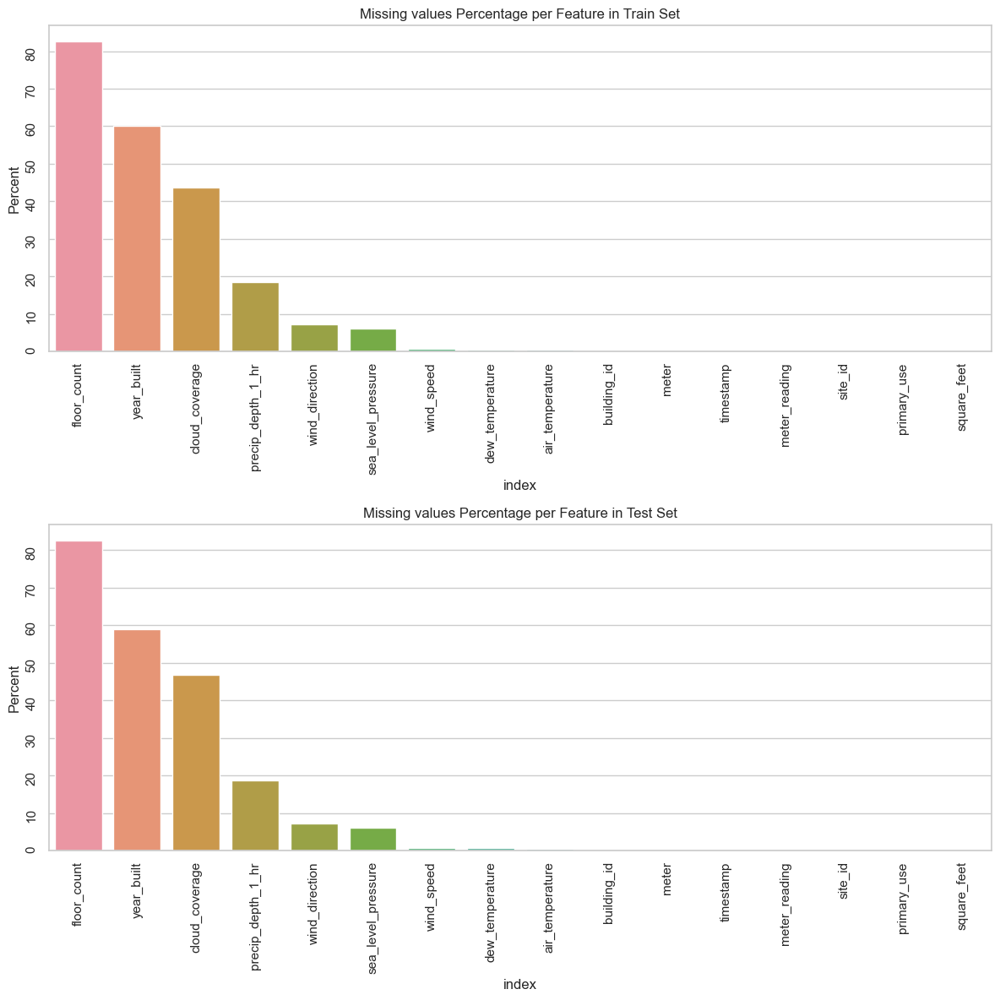

In [162]:
# Plot missing values
fig, axes = plt.subplots(2,figsize=(12,12))
sns.barplot(data=missing_val_train.reset_index(), y='Percent', x='index', ax=axes[0]).set(title='Missing values Percentage per Feature in Train Set');
axes[0].tick_params(labelrotation=90)
sns.barplot(data=missing_val_test.reset_index(), y='Percent', x='index', ax=axes[1]).set(title='Missing values Percentage per Feature in Test Set');
axes[1].tick_params(labelrotation=90)
plt.tight_layout()

**CONCLUSION**

We can see that we have the **same proportion of missing values for the train and test sets**.

`floor_count`, `year_built` and `cloud_coverage` are columns having the most NaN values with **more than 40% of NaN values**. 

This will be complicated to impute properly those missing data.

### Outliers

In [163]:
train_full_raw.describe()

,building_id,meter,meter_reading,site_id,square_feet,year_built,floor_count,air_temperature,cloud_coverage,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed
count,2.021610e+07,2.021610e+07,2.021610e+07,2.021610e+07,2.021610e+07,8088455.0,3506933.0,2.011944e+07,11390735.0,2.011596e+07,16467077.0,18984431.0,18767052.0,2.007242e+07
mean,7.992780e+02,6.624412e-01,2.117122e+03,7.992232e+00,1.077830e+05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,4.269133e+02,9.309921e-01,1.532159e+05,5.099060e+00,1.171424e+05,NaN,0.0,0.000000e+00,0.0,0.000000e+00,NaN,NaN,NaN,0.000000e+00
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.830000e+02,1900.0,1.0,-2.890625e+01,0.0,-3.500000e+01,-1.0,968.0,0.0,0.000000e+00
25%,3.930000e+02,0.000000e+00,1.830000e+01,3.000000e+00,3.252700e+04,1951.0,1.0,8.601562e+00,0.0,0.000000e+00,0.0,1011.5,70.0,2.099609e+00
50%,8.950000e+02,0.000000e+00,7.877500e+01,9.000000e+00,7.270900e+04,1969.0,3.0,1.670312e+01,0.0,8.898438e+00,0.0,1016.0,180.0,3.099609e+00
75%,1.179000e+03,1.000000e+00,2.679840e+02,1.300000e+01,1.391130e+05,1993.0,6.0,2.409375e+01,4.0,1.609375e+01,0.0,1020.5,280.0,4.601562e+00
max,1.448000e+03,3.000000e+00,2.190470e+07,1.500000e+01,8.750000e+05,2017.0,26.0,4.718750e+01,9.0,2.609375e+01,343.0,1046.0,360.0,1.900000e+01


In [164]:
test_full_raw.describe()

,building_id,meter,meter_reading,site_id,square_feet,year_built,floor_count,air_temperature,cloud_coverage,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed
count,4.169760e+07,4.169760e+07,41697600.0,4.169760e+07,4.169760e+07,17099520.0,7253280.0,4.147570e+07,22155420.0,4.143680e+07,33896037.0,39180774.0,38718937.0,4.139551e+07
mean,8.075824e+02,6.642857e-01,0.0,8.086134e+00,1.069469e+05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,4.297680e+02,9.278067e-01,0.0,5.134712e+00,1.160888e+05,NaN,0.0,0.000000e+00,0.0,0.000000e+00,NaN,NaN,NaN,0.000000e+00
min,0.000000e+00,0.000000e+00,0.0,0.000000e+00,2.830000e+02,1900.0,1.0,-2.809375e+01,0.0,-3.159375e+01,-1.0,972.0,0.0,0.000000e+00
25%,4.047500e+02,0.000000e+00,0.0,3.000000e+00,3.224350e+04,1951.0,1.0,7.800781e+00,0.0,0.000000e+00,0.0,1011.5,80.0,2.099609e+00
50%,9.000000e+02,0.000000e+00,0.0,9.000000e+00,7.226250e+04,1969.0,3.0,1.670312e+01,2.0,8.898438e+00,0.0,1016.0,180.0,3.099609e+00
75%,1.194250e+03,1.000000e+00,0.0,1.300000e+01,1.383875e+05,1993.0,6.0,2.390625e+01,4.0,1.670312e+01,0.0,1020.5,280.0,4.601562e+00
max,1.448000e+03,3.000000e+00,0.0,1.500000e+01,8.750000e+05,2017.0,26.0,4.831250e+01,9.0,2.670312e+01,597.0,1050.0,360.0,2.420312e+01


For the train set:
- There is a **10^4 difference between max and mean for `meter_reading`** suggesting some **strong outliers**

### Meter

[Text(0.5, 1.0, 'Occurences per meter type')]

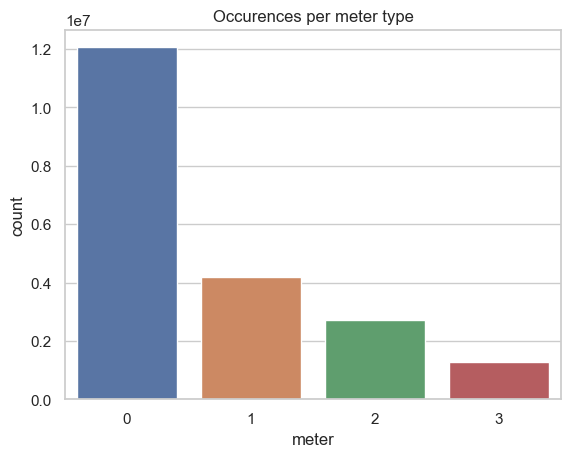

In [165]:
sns.countplot(data=train_full_raw, x='meter').set(title='Occurences per meter type')

**CONCLUSION**

We have a **majority of meter 0 data**

**Create variables**

In [204]:
# One hot encoding of meter
train_full_raw = one_hot(train_full_raw, 'meter')
test_full_raw = one_hot(test_full_raw, 'meter')

In [205]:
for i in range(0,4):
    train_full_raw[f'meter__{i}'] = train_full_raw[f'meter__{i}']*train_full_raw['meter_reading']
    test_full_raw[f'meter__{i}'] = test_full_raw[f'meter__{i}']*test_full_raw['meter_reading']

**Analysis**

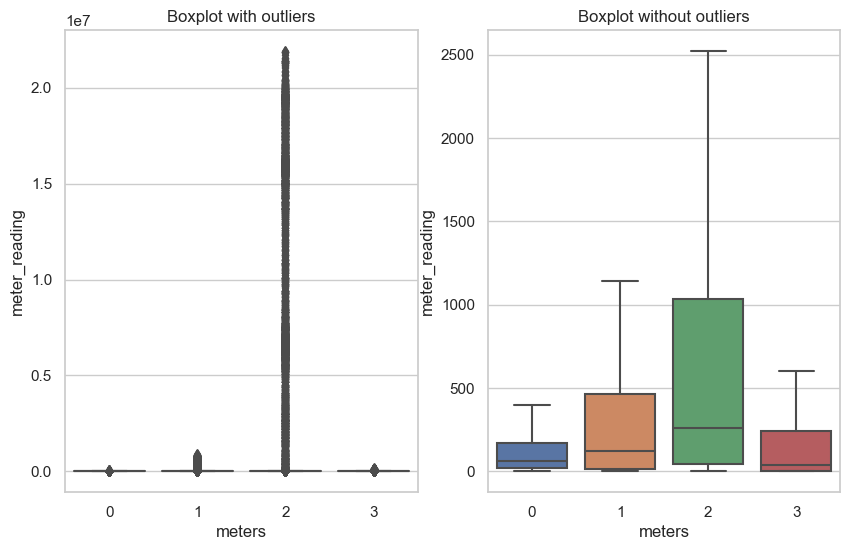

In [206]:
fig, axes = plt.subplots(1,2,figsize=(10,6))
sns.boxplot(x='meters', y='meter_reading', data=train_full_raw, ax=axes[0]).set(title='Boxplot with outliers');
sns.boxplot(x='meters', y='meter_reading', data=train_full_raw, ax=axes[1], showfliers=False).set(title='Boxplot without outliers');

In [207]:
train0 = train_full_raw[train_full_raw['meters']==0].groupby('timestamp').agg({'meter_reading':'mean'})
train1 = train_full_raw[train_full_raw['meters']==1].groupby('timestamp').agg({'meter_reading':'mean'})
train2 = train_full_raw[train_full_raw['meters']==2].groupby('timestamp').agg({'meter_reading':'mean'})
train3 = train_full_raw[train_full_raw['meters']==3].groupby('timestamp').agg({'meter_reading':'mean'})
train01 = train0.merge(train1, how='outer', left_index=True, right_index=True, suffixes=('_0', '_1'))
train012 = train01.merge(train2, how='outer', left_index=True, right_index=True, suffixes=('','_2'))
train0123 = train012.merge(train3, how='outer', left_index=True, right_index=True, suffixes=('_2','_3'))

Some **significant differences in terms of scale** between the different meter
- **meter 2 has peaks above 80000** meanwhile **the other meters are between 0 and 2500**
- **meter 2 has a huge difference in terms of min and max**, let see what is driving this

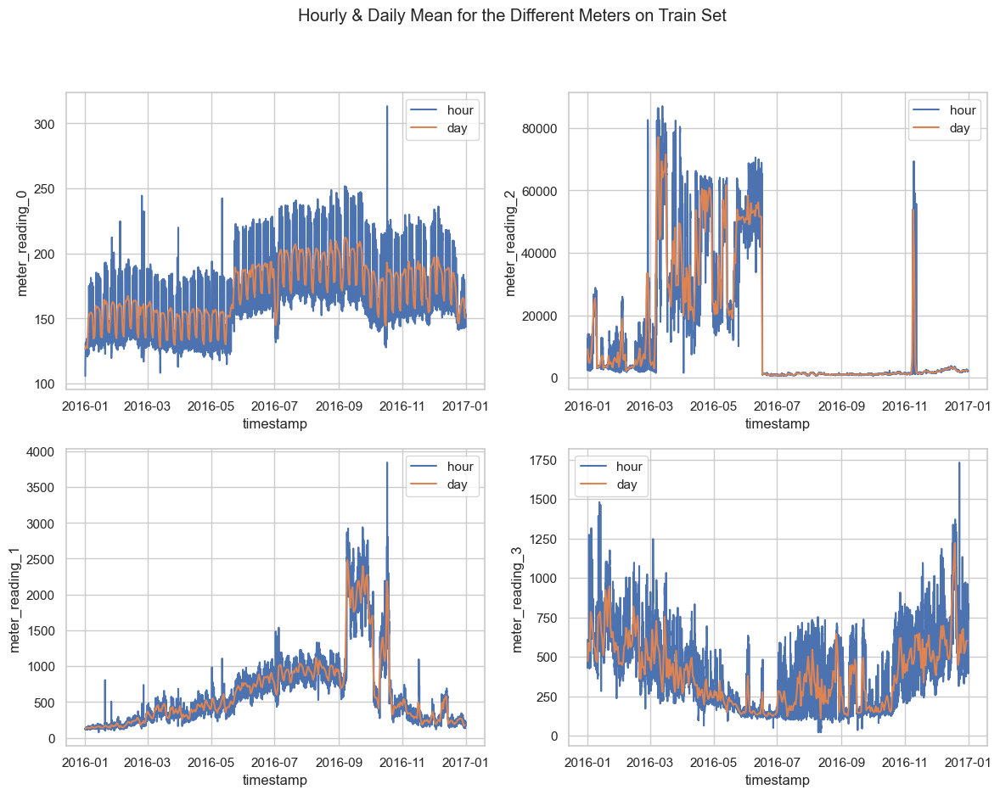

In [208]:
fig, axes = plt.subplots(2,2,figsize=(14, 10))
for i in range(0,4):
    sns.lineplot(data=train0123.reset_index(),y=f'meter_reading_{i}',x='timestamp',ax=axes[i%2][i//2], label='hour')
    sns.lineplot(data=train0123.resample('D').mean().reset_index(),y=f'meter_reading_{i}',x='timestamp',ax=axes[i%2][i//2], label='day')
fig.suptitle("Hourly & Daily Mean for the Different Meters on Train Set");

We can see that the **site 2 has the same shape as the global plot**, this is due to the fact that the scale (10^4) is way more important than the other site (10^2)

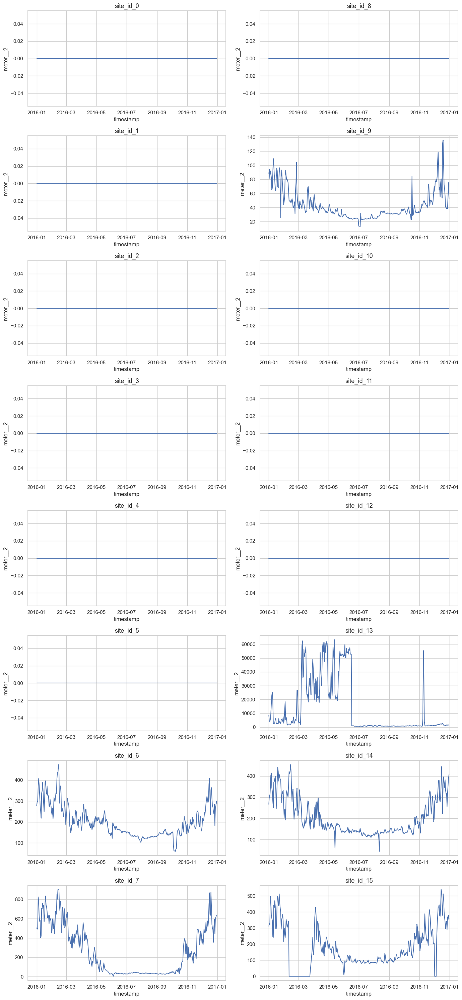

In [209]:
fig, axes = plt.subplots(8,2,figsize=(14, 30))
for i in range(0, 16):
    sns.lineplot(data=train_full_raw[train_full_raw['site_id']==i].set_index('timestamp').resample('D').mean().reset_index(),y=f'meter__2',x='timestamp',ax=axes[i%8][i//8]);
    axes[i%8][i//8].set_title(f'site_id_{i}', fontsize=13);
plt.tight_layout()    

Similarly, we can see that the **education buildings in site 13 has the same shape as the global plot**, this is due to the fact that the scale (10^4) is way more important than the other types of buildings (10^2)

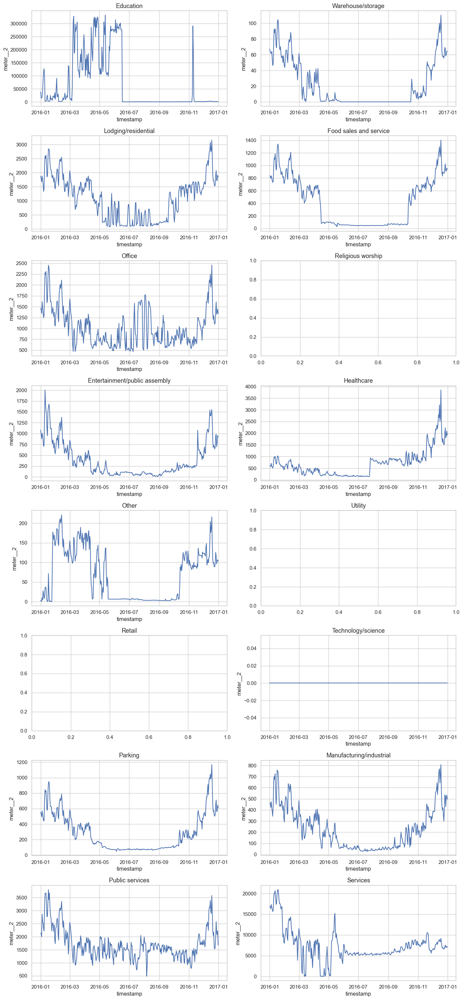

In [210]:
fig, axes = plt.subplots(8,2,figsize=(14, 30))
for idx, i in enumerate(train_full_raw['primary_use'].unique()):
    sns.lineplot(data=train_full_raw[(train_full_raw['primary_use']==i) & (train_full_raw['site_id']==13)].set_index('timestamp').resample('D').mean().reset_index(),y='meter__2',x='timestamp',ax=axes[idx%8][idx//8]);
    axes[idx%8][idx//8].set_title(f'{i}', fontsize=13);
plt.tight_layout()    

- We can see that the **building 1099 has the same trend as the global one**. On top of that, **its scale (10^7) is much greater than the other buildings (up to 10^4).**

- **This is probably an outlier**, hence we will delete the entries of meter 2 with building_id=1099 (at least for the analysis).

Let's see if building 1099 is still an outlier with the other meters

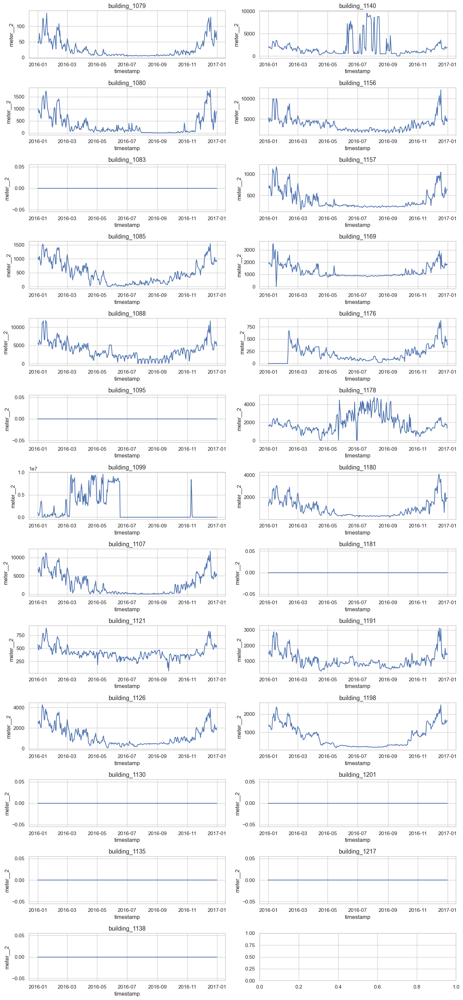

In [211]:
fig, axes = plt.subplots(13,2,figsize=(14, 30))
buildings = train_full_raw[(train_full_raw['site_id']==13) & (train_full_raw['primary_use']=='Education')]['building_id'].unique()
for idx, i in enumerate(buildings):
    sns.lineplot(data=train_full_raw[train_full_raw['building_id']==i].set_index('timestamp').resample('D').mean().reset_index(),y='meter__2',x='timestamp',ax=axes[idx%13][idx//13]);
    axes[idx%13][idx//13].set_title(f'building_{i}', fontsize=13);
plt.tight_layout()    

**No outlier for the other meters** so we will keep them in the data set

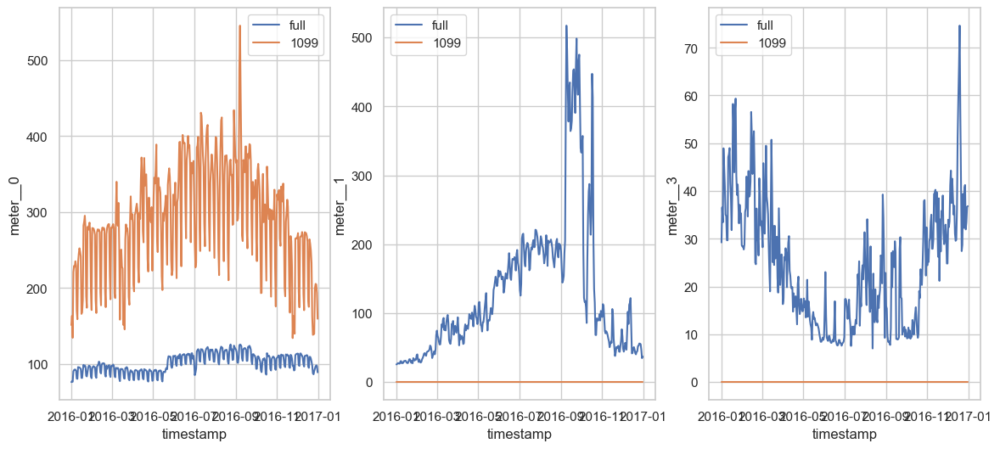

In [212]:
fig, axes = plt.subplots(1,3,figsize=(14, 6))
for idx,i in enumerate([0,1,3]):
    sns.lineplot(data=train_full_raw[train_full_raw['building_id']!=1099][['timestamp',f'meter__{i}']].set_index('timestamp').resample('D').mean(),y=f'meter__{i}',x='timestamp',ax=axes[idx], label='full')
    sns.lineplot(data=train_full_raw[train_full_raw['building_id']==1099][['timestamp',f'meter__{i}']].set_index('timestamp').resample('D').mean(),y=f'meter__{i}',x='timestamp',ax=axes[idx], label='1099')

**Taking off outliers**

In [213]:
train_full = train_full_raw[~((train_full_raw['building_id']==1099)&(train_full_raw['meters']==2))]
#train_full = train_full_raw.copy()
test_full = test_full_raw.copy()

### building_id

In [214]:
# Counting unique building ids
train_full['building_id'].nunique()

1449

__Historic for the buildings__

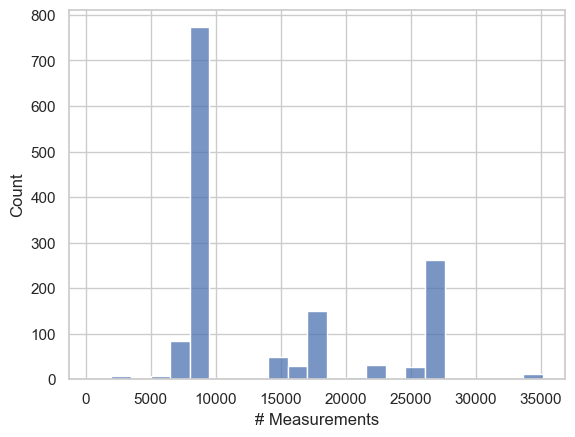

In [215]:
sns.histplot(train_full[['building_id']].value_counts()).set(xlabel='# Measurements', ylabel='Count');

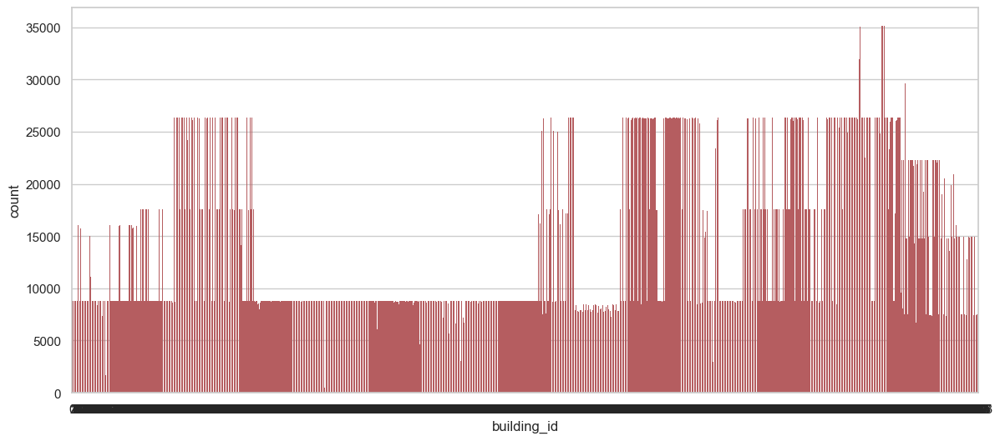

In [216]:
# Count measurements for each building ids
fig, axes = plt.subplots(1,1,figsize=(14, 6))
sns.countplot(data = train_full[['building_id']], x='building_id',color='r', label='train')
plt.setp(axes.patches, linewidth=0);

**Conclusion**

There is mainly the **same number of measurements for each building id**

### timestamp

In [217]:
train__timestamp = train_full.groupby('building_id').agg({'timestamp':['max', 'min']})
train__timestamp.columns = train__timestamp.columns.get_level_values(0)
train__timestamp.reset_index(inplace=True)
train__timestamp.columns = ['building_id','max_time','min_time']
train__timestamp['delta'] = train__timestamp['max_time'] - train__timestamp['min_time']

In [218]:
train__timestamp[['delta','max_time','min_time']].value_counts().head(3)

delta              max_time             min_time           
365 days 23:00:00  2016-12-31 23:00:00  2016-01-01 00:00:00    1420
313 days 13:00:00  2016-12-31 23:00:00  2016-02-22 10:00:00       3
96 days 23:00:00   2016-04-06 23:00:00  2016-01-01 00:00:00       1
dtype: int64

In [219]:
test__timestamp = test_full.groupby('building_id').agg({'timestamp':['max', 'min']})
test__timestamp.columns = test__timestamp.columns.get_level_values(0)
test__timestamp.reset_index(inplace=True)
test__timestamp.columns = ['building_id','max_time','min_time']
test__timestamp['delta'] = test__timestamp['max_time'] - test__timestamp['min_time']

In [220]:
test__timestamp[['delta','max_time','min_time']].value_counts().head(3)

delta              max_time             min_time  
729 days 23:00:00  2018-12-31 23:00:00  2017-01-01    1449
dtype: int64

**CONCLUSION**

We have mainly: 
- **the 2016 historic for the train set**
- **the 2017 & 2018 historic for the test set** (two years following the train set)

### Site id

[Text(0.5, 1.0, 'test set')]

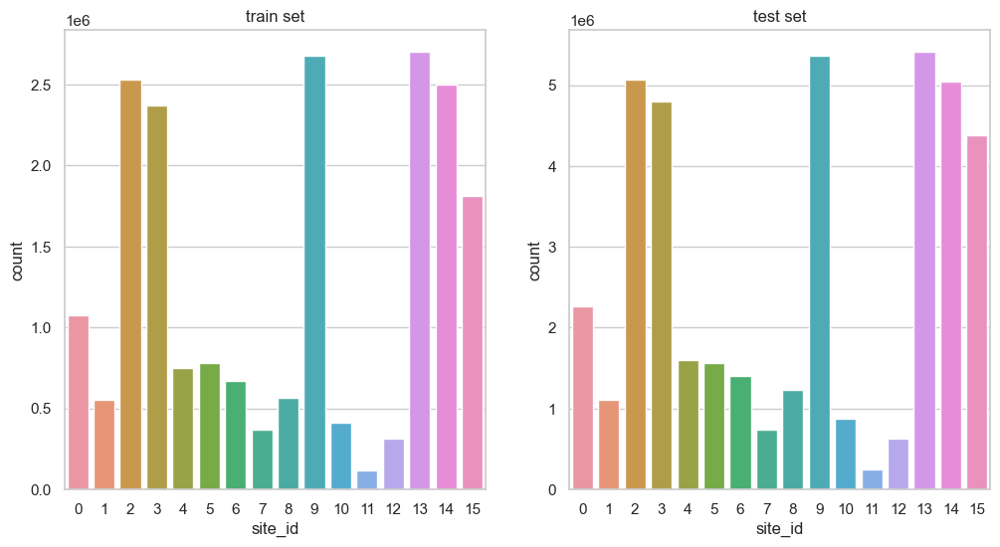

In [221]:
# Plotting the number of building ids per site id
fig, axes = plt.subplots(1,2,figsize=(12,6))
sns.countplot(data=train_full, x='site_id', ax=axes[0]).set(title='train set')
sns.countplot(data=test_full, x='site_id', ax=axes[1]).set(title='test set')

**CONCLUSION**

We have the **same distribution of buildings per site id** which is logical as the test set corresponds to the two following years of the train set

### primary_use

In [264]:
print('In train set:','\n','Null values:',round(train_full['primary_use'].isnull().sum()*100/len(train_full),2),'%', 'Nan values:',round(train_full['primary_use'].isna().sum()*100/len(train_full),2),'%')
print('In test set:','\n','Null values:',round(test_full['primary_use'].isnull().sum()*100/len(test_full),2),'%', 'Nan values:',round(test_full['primary_use'].isna().sum()*100/len(test_full),2),'%')


In train set: 
 Null values: 0.0 % Nan values: 0.0 %
In test set: 
 Null values: 0.0 % Nan values: 0.0 %


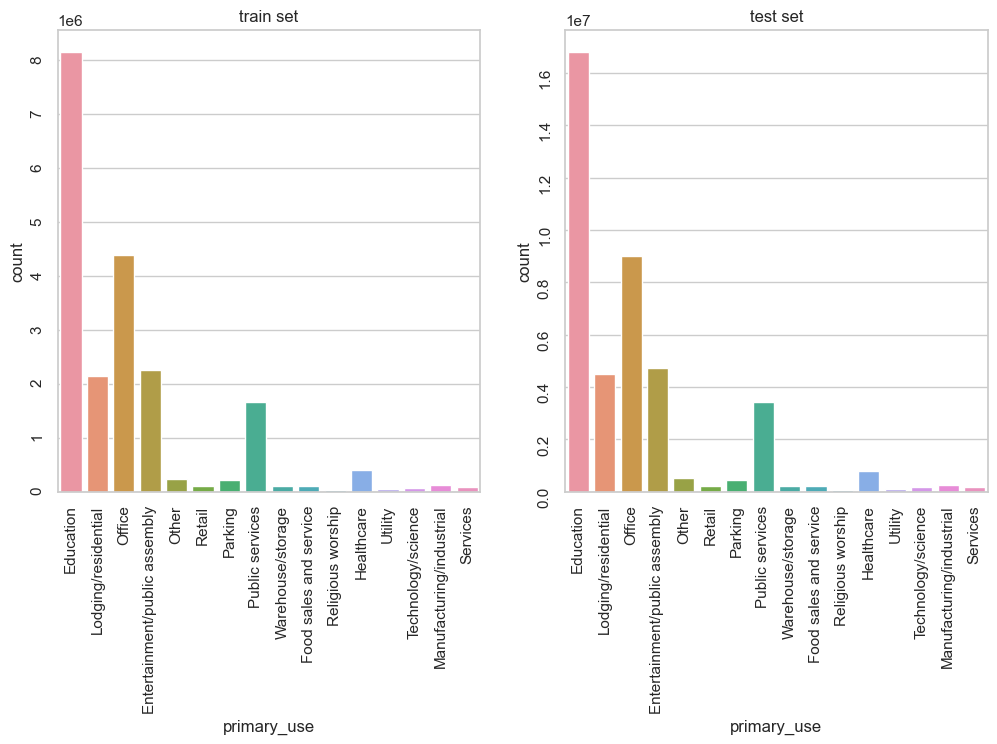

In [223]:
fig, axes = plt.subplots(1,2,figsize=(12,6))
sns.countplot(data=train_full, x='primary_use', ax=axes[0]).set(title='train set')
axes[0].tick_params(labelrotation=90);
sns.countplot(data=test_full, x='primary_use', ax=axes[1]).set(title='test set')
axes[1].tick_params(labelrotation=90);

**CONCLUSION**

We have a **majority of Education buildings**

### Square feet

In [263]:
print('In train set:','\n','Null values:',round(train_full['square_feet'].isnull().sum()*100/len(train_full),2),'%', 'Nan values:',round(train_full['square_feet'].isna().sum()*100/len(train_full),2),'%')
print('In test set:','\n','Null values:',round(test_full['square_feet'].isnull().sum()*100/len(test_full),2),'%', 'Nan values:',round(test_full['square_feet'].isna().sum()*100/len(test_full),2),'%')


In train set: 
 Null values: 0.0 % Nan values: 0.0 %
In test set: 
 Null values: 0.0 % Nan values: 0.0 %


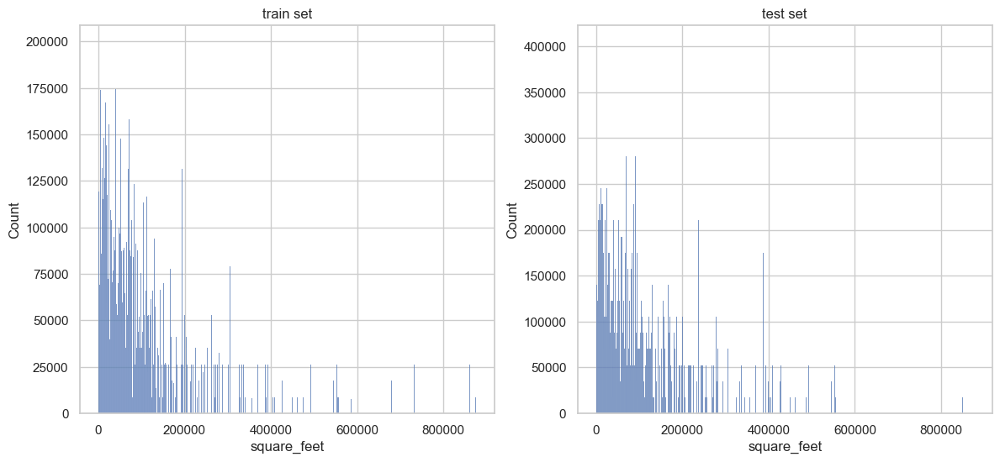

In [225]:
fig, axes = plt.subplots(1,2,figsize=(14, 6))
sns.histplot(data=train_full, x='square_feet',ax=axes[0]).set(title='train set');
sns.histplot(data=test_full, x='square_feet',ax=axes[1]).set(title='test set');

**CONCLUSION**

We have most of the **buildings having a surface lower than 200000 square feet**

### year_built

In [262]:
print('In train set:','\n','Null values:',round(train_full['year_built'].isnull().sum()*100/len(train_full),2),'%', 'Nan values:',round(train_full['year_built'].isna().sum()*100/len(train_full),2),'%')
print('In test set:','\n','Null values:',round(test_full['year_built'].isnull().sum()*100/len(test_full),2),'%', 'Nan values:',round(test_full['year_built'].isna().sum()*100/len(test_full),2),'%')


In train set: 
 Null values: 59.97 % Nan values: 59.97 %
In test set: 
 Null values: 58.99 % Nan values: 58.99 %


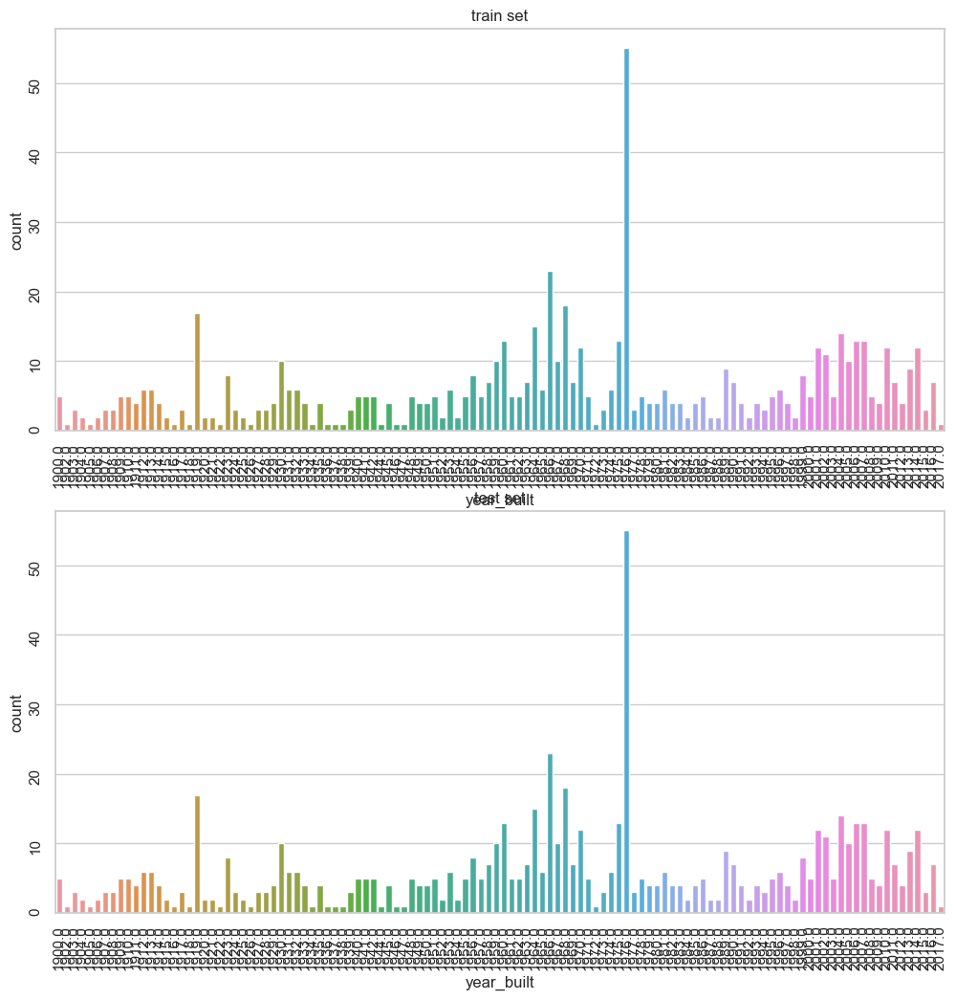

In [227]:
fig, axes = plt.subplots(2,1,figsize=(12,12))
sns.countplot(data=train_full.groupby(['year_built','building_id']).size().reset_index(), x='year_built', ax=axes[0]).set(title='train set');
axes[0].tick_params(labelrotation=90)
sns.countplot(data=test_full.groupby(['year_built','building_id']).size().reset_index(), x='year_built', ax=axes[1]).set(title='test set');
axes[1].tick_params(labelrotation=90)

**CONCLUSION**

We have:
- Approx **60% of missing values** for that feature
- There is no **year built significantly more frequent unless 1976**

### floor_count

In [265]:
print('In train set:','\n','Null values:',round(train_full['floor_count'].isnull().sum()*100/len(train_full),2),'%', 'Nan values:',round(train_full['floor_count'].isna().sum()*100/len(train_full),2),'%')
print('In test set:','\n','Null values:',round(test_full['floor_count'].isnull().sum()*100/len(test_full),2),'%', 'Nan values:',round(test_full['floor_count'].isna().sum()*100/len(test_full),2),'%')


In train set: 
 Null values: 82.65 % Nan values: 82.65 %
In test set: 
 Null values: 82.61 % Nan values: 82.61 %


**CONCLUSION**

We have:
- Approx. **82% of missing values** for that feature
- This feature won't be used as there are too many missing values

### air_temperature

In [266]:
print('In train set:','\n','Null values:',round(train_full['air_temperature'].isnull().sum()*100/len(train_full),2),'%', 'Nan values:',round(train_full['air_temperature'].isna().sum()*100/len(train_full),2),'%')
print('In test set:','\n','Null values:',round(test_full['air_temperature'].isnull().sum()*100/len(test_full),2),'%', 'Nan values:',round(test_full['air_temperature'].isna().sum()*100/len(test_full),2),'%')


In train set: 
 Null values: 0.48 % Nan values: 0.48 %
In test set: 
 Null values: 0.53 % Nan values: 0.53 %


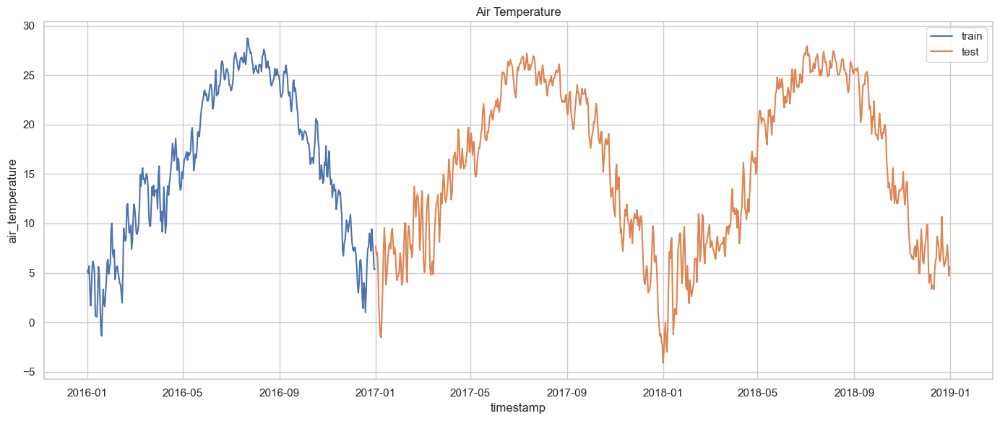

In [230]:
fig, axes = plt.subplots(1,1,figsize=(14, 6))
sns.lineplot(data=train_full.set_index('timestamp').resample('D').mean().reset_index(),y='air_temperature',x='timestamp', label='train').set(title='Air Temperature');
sns.lineplot(data=test_full_raw.set_index('timestamp').resample('D').mean().reset_index(),y='air_temperature',x='timestamp', label='test');
plt.tight_layout()

**CONCLUSION**

We have:
- **less than 1% of missing values for that feature**
- the **same seasonality for both train and test sets**

### cloud_coverage

In [267]:
print('In train set:','\n','Null values:',round(train_full['cloud_coverage'].isnull().sum()*100/len(train_full),2),'%', 'Nan values:',round(train_full['cloud_coverage'].isna().sum()*100/len(train_full),2),'%')
print('In test set:','\n','Null values:',round(test_full['cloud_coverage'].isnull().sum()*100/len(test_full),2),'%', 'Nan values:',round(test_full['cloud_coverage'].isna().sum()*100/len(test_full),2),'%')


In train set: 
 Null values: 43.65 % Nan values: 43.65 %
In test set: 
 Null values: 46.87 % Nan values: 46.87 %


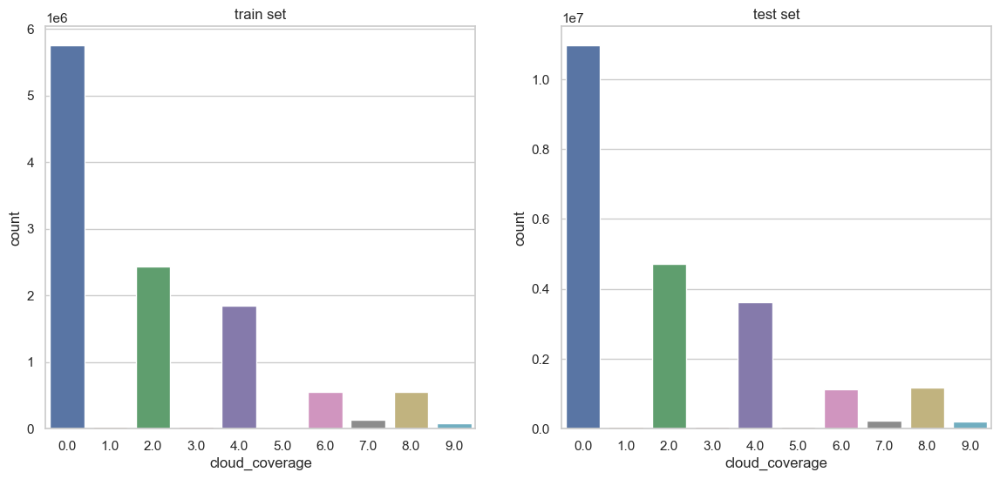

In [232]:
fig, axes = plt.subplots(1,2,figsize=(14, 6))
sns.countplot(data=train_full, x='cloud_coverage',ax=axes[0]).set(title='train set');
sns.countplot(data=test_full, x='cloud_coverage',ax=axes[1]).set(title='test set');

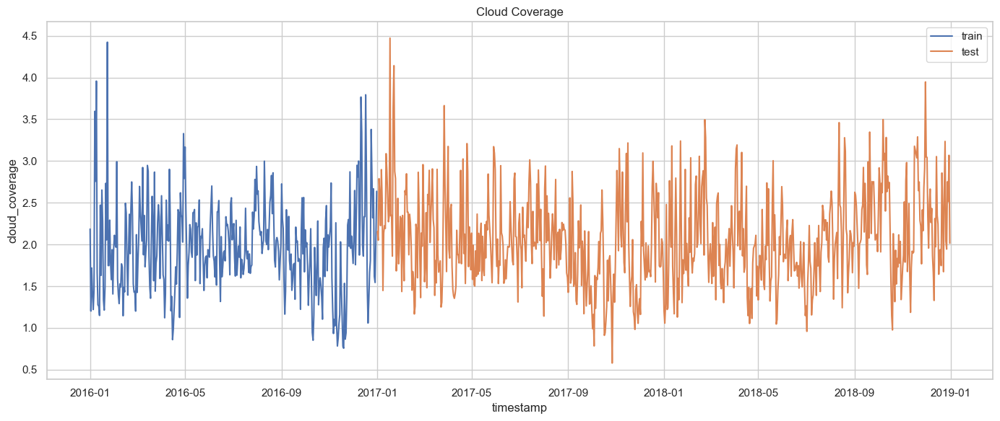

In [233]:
fig, axes = plt.subplots(1,1,figsize=(14, 6))
sns.lineplot(data=train_full.set_index('timestamp').resample('D').mean().reset_index(),y='cloud_coverage',x='timestamp', label='train').set(title='Cloud Coverage');
sns.lineplot(data=test_full_raw.set_index('timestamp').resample('D').mean().reset_index(),y='cloud_coverage',x='timestamp', label='test');
plt.tight_layout()

**CONCLUSION**

We have:
- appox. **46% of missing values**
- the **same distribution and trend between train and test set**

### dew_temperature

In [268]:
print('In train set:','\n','Null values:',round(train_full['dew_temperature'].isnull().sum()*100/len(train_full),2),'%', 'Nan values:',round(train_full['dew_temperature'].isna().sum()*100/len(train_full),2),'%')
print('In test set:','\n','Null values:',round(test_full['dew_temperature'].isnull().sum()*100/len(test_full),2),'%', 'Nan values:',round(test_full['dew_temperature'].isna().sum()*100/len(test_full),2),'%')


In train set: 
 Null values: 0.5 % Nan values: 0.5 %
In test set: 
 Null values: 0.63 % Nan values: 0.63 %


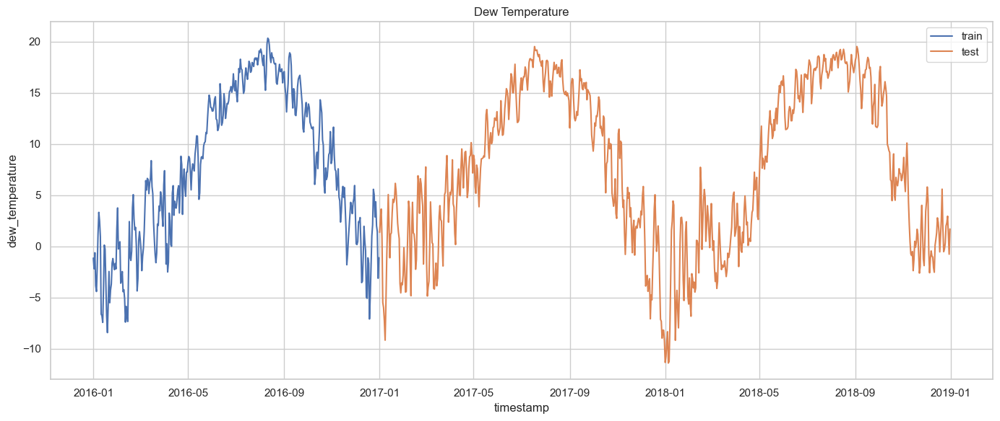

In [235]:
fig, axes = plt.subplots(1,1,figsize=(14, 6))
sns.lineplot(data=train_full.set_index('timestamp').resample('D').mean().reset_index(),y='dew_temperature',x='timestamp', label='train').set(title='Dew Temperature');
sns.lineplot(data=test_full_raw.set_index('timestamp').resample('D').mean().reset_index(),y='dew_temperature',x='timestamp', label='test');
plt.tight_layout()

**CONCLUSION**

We have:
- **less than 1% of missing values for that feature**
- the **same seasonality for both train and test sets**

### precip_depth_1_hr

In [269]:
print('In train set:','\n','Null values:',round(train_full['precip_depth_1_hr'].isnull().sum()*100/len(train_full),2),'%', 'Nan values:',round(train_full['precip_depth_1_hr'].isna().sum()*100/len(train_full),2),'%')
print('In test set:','\n','Null values:',round(test_full['precip_depth_1_hr'].isnull().sum()*100/len(test_full),2),'%', 'Nan values:',round(test_full['precip_depth_1_hr'].isna().sum()*100/len(test_full),2),'%')


In train set: 
 Null values: 18.55 % Nan values: 18.55 %
In test set: 
 Null values: 18.71 % Nan values: 18.71 %


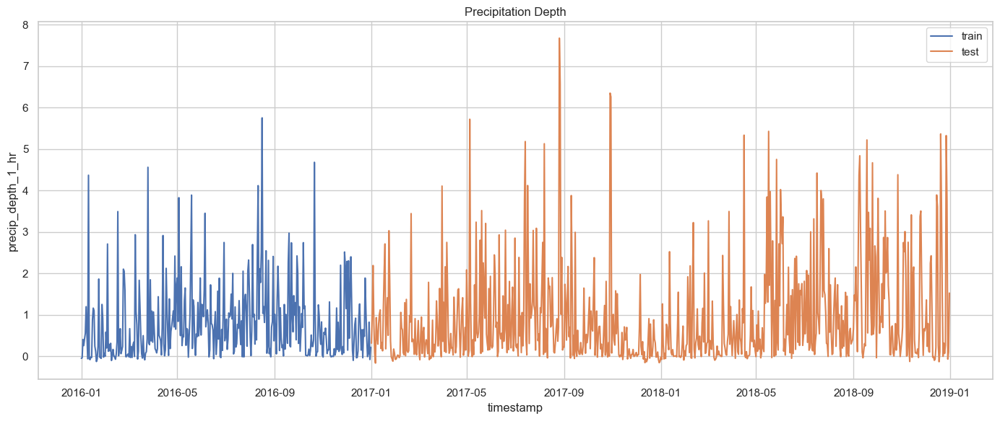

In [237]:
fig,axes = plt.subplots(1,1,figsize=(14, 6))
sns.lineplot(data=train_full.set_index('timestamp').resample('D').mean().reset_index(),y='precip_depth_1_hr',x='timestamp', label='train').set(title='Precipitation Depth');
sns.lineplot(data=test_full_raw.set_index('timestamp').resample('D').mean().reset_index(),y='precip_depth_1_hr',x='timestamp', label='test');
plt.tight_layout()

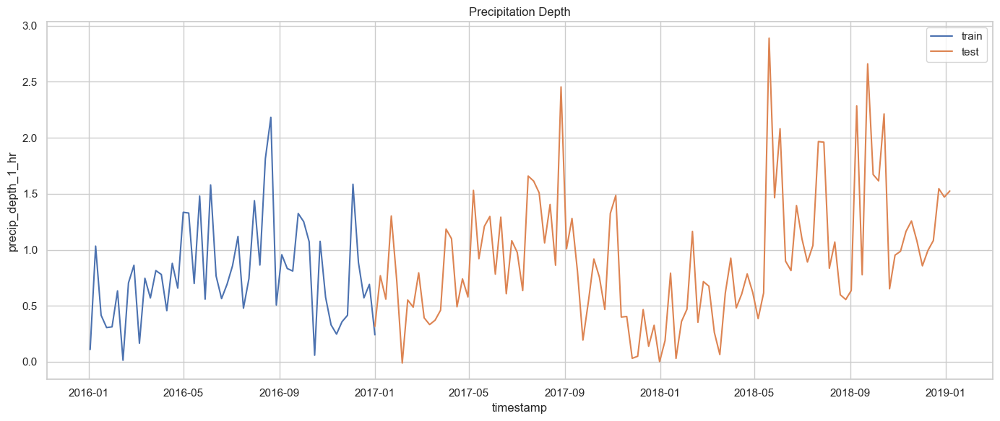

In [238]:
fig,axes = plt.subplots(1,1,figsize=(14, 6))
sns.lineplot(data=train_full.set_index('timestamp').resample('W').mean().reset_index(),y='precip_depth_1_hr',x='timestamp', label='train').set(title='Precipitation Depth');
sns.lineplot(data=test_full_raw.set_index('timestamp').resample('W').mean().reset_index(),y='precip_depth_1_hr',x='timestamp', label='test');
plt.tight_layout()

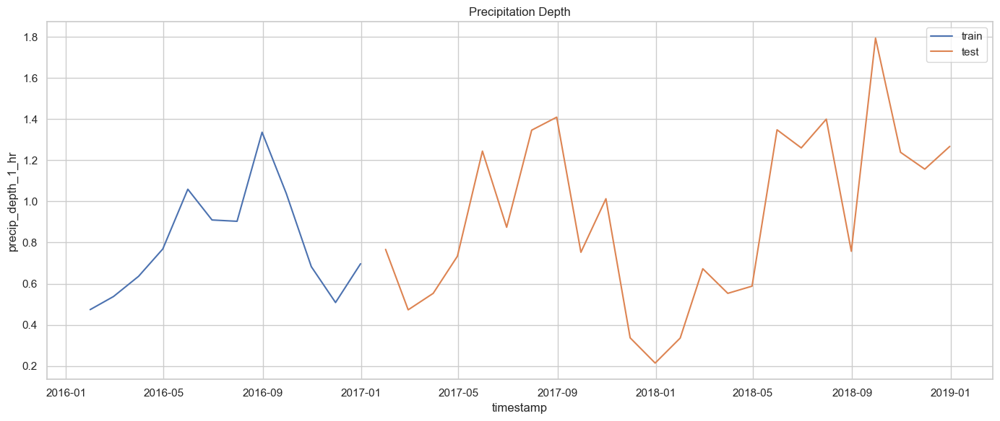

In [239]:
fig,axes = plt.subplots(1,1,figsize=(14, 6))
sns.lineplot(data=train_full.set_index('timestamp').resample('M').mean().reset_index(),y='precip_depth_1_hr',x='timestamp', label='train').set(title='Precipitation Depth');
sns.lineplot(data=test_full_raw.set_index('timestamp').resample('M').mean().reset_index(),y='precip_depth_1_hr',x='timestamp', label='test');
plt.tight_layout()

**CONCLUSION**

We have:
- Appox. **20% of missing values for that feature**
- the **same seasonality between 2016 and 2017 but a greater precipitation depth for late 2018**

### Sea_level_pressure

In [270]:
print('In train set:','\n','Null values:',round(train_full['sea_level_pressure'].isnull().sum()*100/len(train_full),2),'%', 'Nan values:',round(train_full['sea_level_pressure'].isna().sum()*100/len(train_full),2),'%')
print('In test set:','\n','Null values:',round(test_full['sea_level_pressure'].isnull().sum()*100/len(test_full),2),'%', 'Nan values:',round(test_full['sea_level_pressure'].isna().sum()*100/len(test_full),2),'%')


In train set: 
 Null values: 6.09 % Nan values: 6.09 %
In test set: 
 Null values: 6.04 % Nan values: 6.04 %


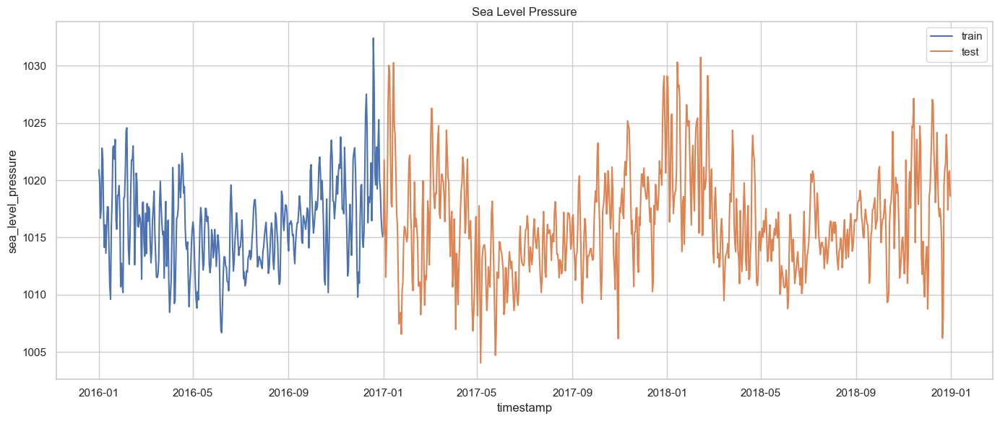

In [241]:
fig,axes = plt.subplots(1,1,figsize=(14, 6))
sns.lineplot(data=train_full.set_index('timestamp').resample('D').mean().reset_index(),y='sea_level_pressure',x='timestamp', label='train').set(title='Sea Level Pressure');
sns.lineplot(data=test_full.set_index('timestamp').resample('D').mean().reset_index(),y='sea_level_pressure',x='timestamp', label='test');
plt.tight_layout()

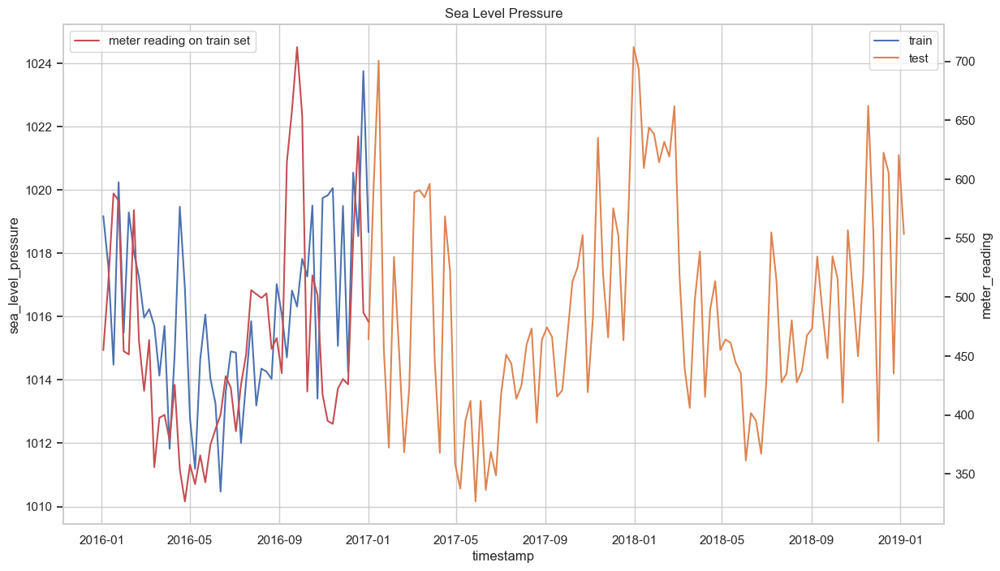

In [242]:
fig,axes = plt.subplots(1,1,figsize=(14, 8))
tr = sns.lineplot(data=train_full.set_index('timestamp').resample('W').mean().reset_index(),y='sea_level_pressure',x='timestamp', label='train').set(title='Sea Level Pressure');
tt = sns.lineplot(data=test_full.set_index('timestamp').resample('W').mean().reset_index(),y='sea_level_pressure',x='timestamp', label='test');
ax2 = axes.twinx()
ax2.grid(False);
mr = sns.lineplot(data=train_full.set_index('timestamp').resample('W').mean().reset_index(),y='meter_reading',x='timestamp', color='r', label='meter reading on train set');
axes.legend(loc=0);
ax2.legend(loc=2);

**CONCLUSION**

We have:
- Approx. **5% of missing values for that feature**
- the **same seasonality for both train and test sets**
- There is **positive correlation between sea level pressure and meter reading**

### wind_direction

In [271]:
print('In train set:','\n','Null values:',round(train_full['wind_direction'].isnull().sum()*100/len(train_full),2),'%', 'Nan values:',round(train_full['wind_direction'].isna().sum()*100/len(train_full),2),'%')
print('In test set:','\n','Null values:',round(test_full['wind_direction'].isnull().sum()*100/len(test_full),2),'%', 'Nan values:',round(test_full['wind_direction'].isna().sum()*100/len(test_full),2),'%')


In train set: 
 Null values: 7.17 % Nan values: 7.17 %
In test set: 
 Null values: 7.14 % Nan values: 7.14 %


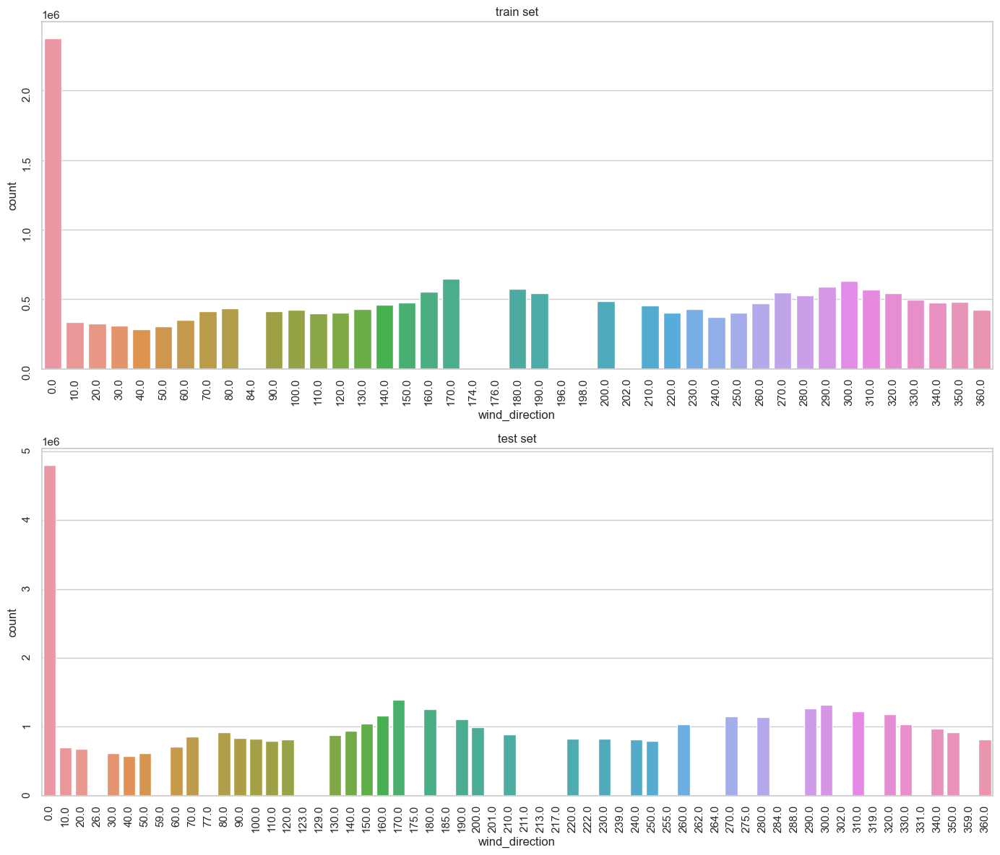

In [244]:
fig, axes = plt.subplots(2,1,figsize=(14, 12))
sns.countplot(data=train_full.sort_values(by='wind_direction'), x='wind_direction',ax=axes[0]).set(title='train set');
axes[0].tick_params(labelrotation=90)
sns.countplot(data=test_full.sort_values(by='wind_direction'), x='wind_direction',ax=axes[1]).set(title='test set');
axes[1].tick_params(labelrotation=90)
plt.tight_layout()

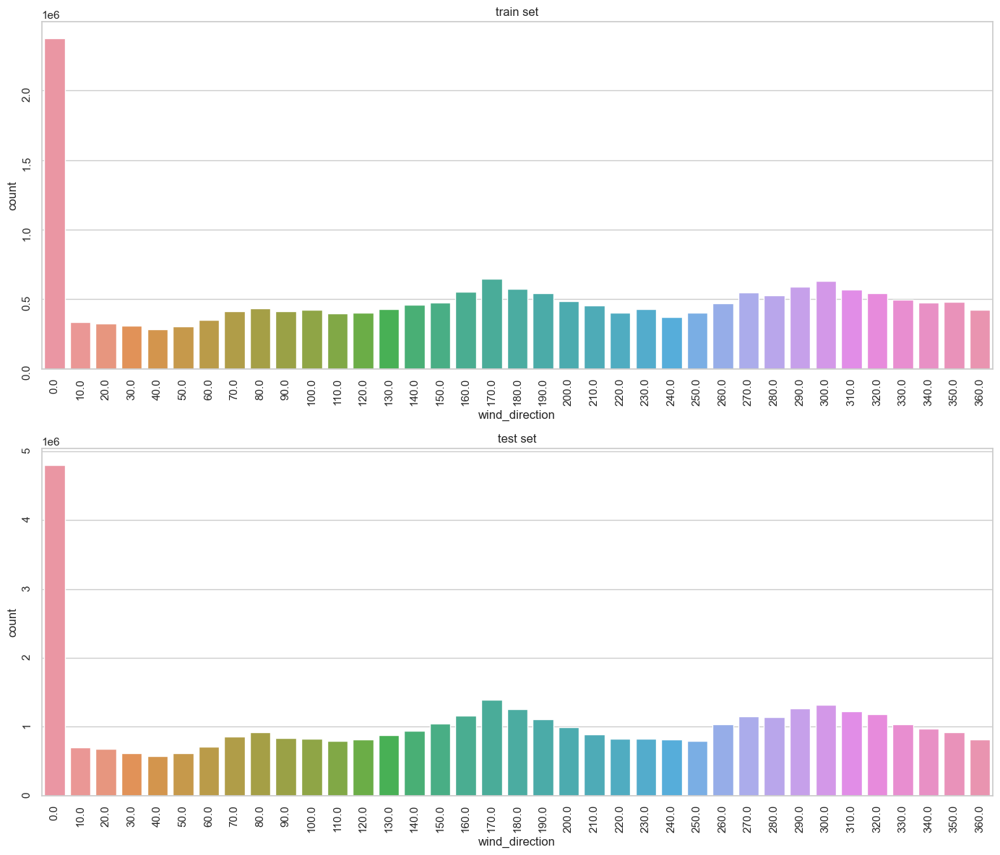

In [245]:
fig, axes = plt.subplots(2,1,figsize=(14, 12))
sns.countplot(data=train_full[train_full['wind_direction']%10==0], x='wind_direction',ax=axes[0]).set(title='train set');
axes[0].tick_params(labelrotation=90)
sns.countplot(data=test_full[test_full['wind_direction']%10==0], x='wind_direction',ax=axes[1]).set(title='test set');
axes[1].tick_params(labelrotation=90)
plt.tight_layout()

**CONCLUSION**

We have:
- approx. **7% of missing values for that feature**
- the **same distribution for both train and test set**
- wind direction = 0 is significantly more frequent, this is most probably due to lack of values than actual value = 0

### wind_speed

In [272]:
print('In train set:','\n','Null values:',round(train_full['wind_speed'].isnull().sum()*100/len(train_full),2),'%', 'Nan values:',round(train_full['wind_speed'].isna().sum()*100/len(train_full),2),'%')
print('In test set:','\n','Null values:',round(test_full['wind_speed'].isnull().sum()*100/len(test_full),2),'%', 'Nan values:',round(test_full['wind_speed'].isna().sum()*100/len(test_full),2),'%')


In train set: 
 Null values: 0.71 % Nan values: 0.71 %
In test set: 
 Null values: 0.72 % Nan values: 0.72 %


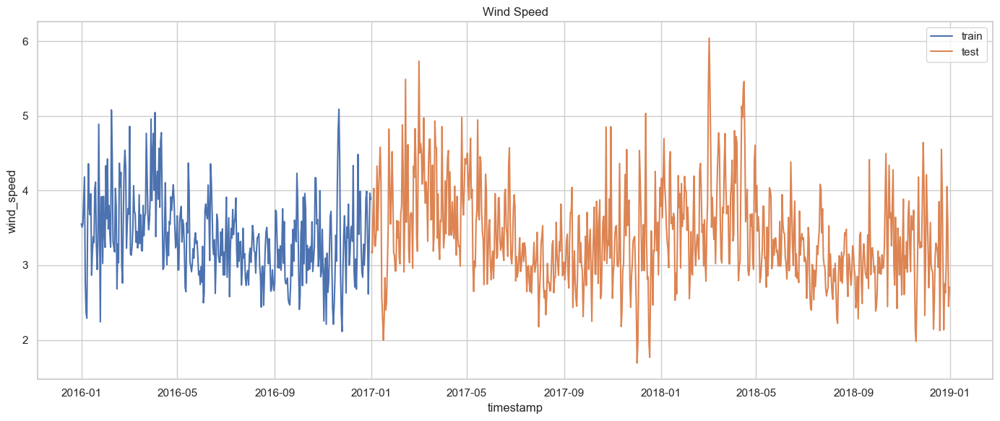

In [247]:
fig,axes = plt.subplots(1,1,figsize=(14, 6))
sns.lineplot(data=train_full_raw.set_index('timestamp').resample('D').mean().reset_index(),y='wind_speed',x='timestamp', label='train').set(title='Wind Speed');
sns.lineplot(data=test_full_raw.set_index('timestamp').resample('D').mean().reset_index(),y='wind_speed',x='timestamp', label='test');
plt.tight_layout()

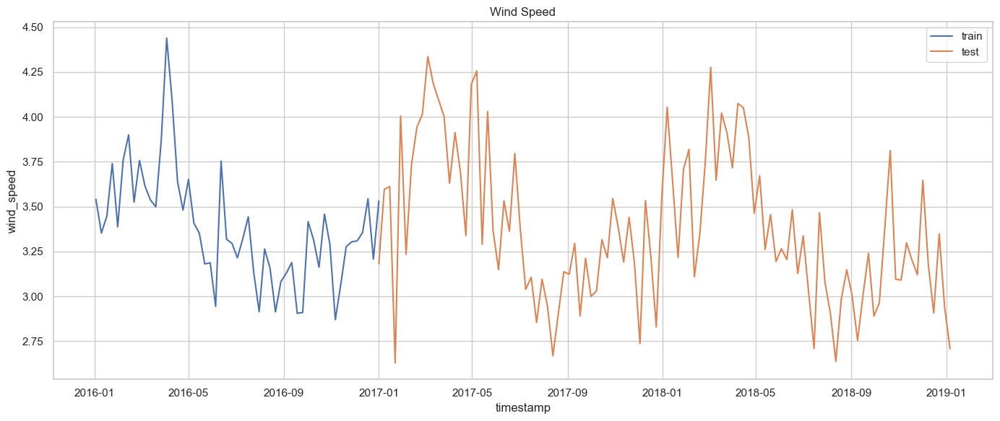

In [248]:
fig,axes = plt.subplots(1,1,figsize=(14, 6))
sns.lineplot(data=train_full_raw.set_index('timestamp').resample('W').mean().reset_index(),y='wind_speed',x='timestamp', label='train').set(title='Wind Speed');
sns.lineplot(data=test_full_raw.set_index('timestamp').resample('W').mean().reset_index(),y='wind_speed',x='timestamp', label='test');
plt.tight_layout()

**CONCLUSION**

We have:
- **Less than 1% of missing values for that feature**
- the **same seasonality for both train and test sets**

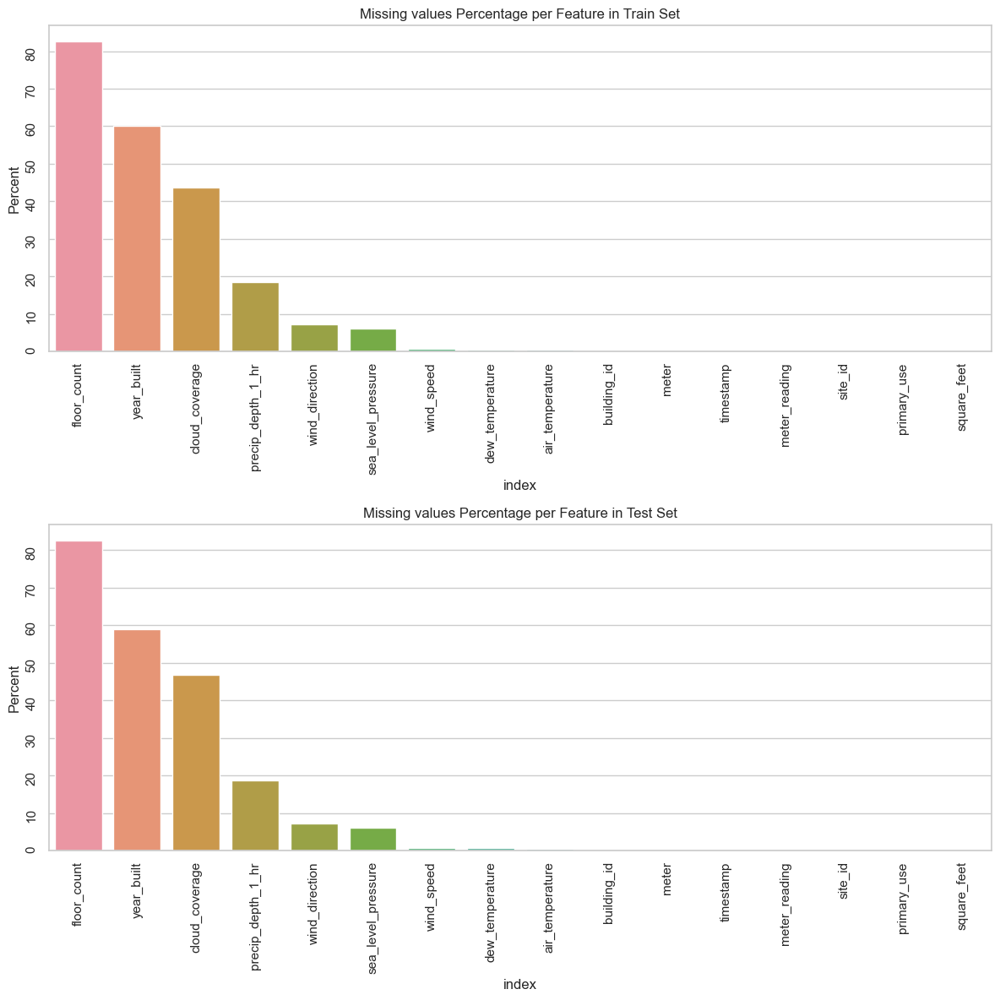

In [249]:
# Plot missing values
fig, axes = plt.subplots(2,figsize=(12,12))
sns.barplot(data=missing_val_train.reset_index(), y='Percent', x='index', ax=axes[0]).set(title='Missing values Percentage per Feature in Train Set');
axes[0].tick_params(labelrotation=90)
sns.barplot(data=missing_val_test.reset_index(), y='Percent', x='index', ax=axes[1]).set(title='Missing values Percentage per Feature in Test Set');
axes[1].tick_params(labelrotation=90)
plt.tight_layout()

## Save modified train and test sets

In [37]:
train_full.to_csv('train_full_wo_outliers.csv',index=False)
#train_full.to_csv('train_full_w_outliers.csv',index=False) # if we want to keep outliers
test_full.to_csv('test_full.csv',index=False)

## General Conclusion about EDA

This EDA brought us some insights:
- train set is the **2016 historic of approx. 1400 buildings** and **test set is the 2017 & 2018 historic of those same buildings**

Consequently, we have for both train and test sets: 
- **the same trends, seasonality and distribution**
- the **same proportion of missing values** with, as **features with most missing values**:
    - `floor count` (approx. 80% of missing values)
    - `year built` (approx. 60% of missing values)
    - `cloud coverage` (approx. 50% of missing values)
    - `precip depth 1hr` (approx. 20% of missing values)
    - `wind direction` (approx. 8% of missing values)
    - `see level pressure` (approx. 5% of missing values)

 
On top of that, we saw that there are **some outliers linked to building id 1099 for meter 2**. This might be due to measurement errors in terms of sensors or unit of measure. 
On a regular basis, we should delete these outliers but as test set is the measurements for the 2 following years, it might be difficult to delete those. 
We will do the two cases, **train with those outliers** and **train without those outliers**. If training with those outliers, **it is mandatory to scale** `meter reading`.


**Improvements for EDA**
- For meteorolical data, make a split by site id
- Add meter reading to plot to visualize potential correlation
- Compute correlation

# Feature Engineering

We will try **several feature engineering approaches** to see what is the best one and then apply this approach with the different regressors

In [4]:
# Download data
train_full = pd.read_csv('train_full_wo_outliers.csv')
#train_full = pd.read_csv('train_full_w_outliers.csv') # if we want outliers
test_full = pd.read_csv('test_full.csv')
train_full['timestamp'] = pd.to_datetime(train_full['timestamp'])
test_full['timestamp'] = pd.to_datetime(test_full['timestamp'])

In [32]:
# Take a sample of the training set to experiment feature engineering 
# (not the best way to split data as these are time series but this is an easy way to sample)
train_sample = train_full.sample(frac=0.05, random_state=25)

## Encoding of Primary Use

### One-Hot Encode "Primary Use"

In [59]:
train_full2 = one_hot(train_sample, 'primary_use')

### Label Encode Primary Use

In [61]:
train_full3 = label_encode(train_sample, 'primary_use')

## Extract information from timestamp

### Extract month, weekday, hour, day

In [62]:
train_full2 = extract_time_features(train_full2, 'timestamp')

train_full3 = extract_time_features(train_full3, 'timestamp')

### Add holidays

In [64]:
holidays = ["2016-01-01", "2016-01-18", "2016-02-15", "2016-05-30", "2016-07-04",
            "2016-09-05", "2016-10-10", "2016-11-11", "2016-11-24", "2016-12-26",
            "2017-01-01", "2017-01-16", "2017-02-20", "2017-05-29", "2017-07-04",
            "2017-09-04", "2017-10-09", "2017-11-10", "2017-11-23", "2017-12-25",
            "2018-01-01", "2018-01-15", "2018-02-19", "2018-05-28", "2018-07-04",
            "2018-09-03", "2018-10-08", "2018-11-12", "2018-11-22", "2018-12-25",
            "2019-01-01"]
train_full2 = add_holidays(train_full2, holidays)
train_full3 = add_holidays(train_full3, holidays)

## Scale Data

In [65]:
# log scaling of square feet and meter reading
train_full21 = train_full2.copy()
train_full21['square_feet'] = np.log1p(train_full21['square_feet'])
train_full21['meter_reading'] = np.log1p(train_full21['meter_reading'])

train_full31 = train_full3.copy()
train_full31['square_feet'] = np.log1p(train_full31['square_feet'])
train_full31['meter_reading'] = np.log1p(train_full31['meter_reading'])

In [66]:
numerical_features = ['square_feet',
       'year_built', 'floor_count', 'air_temperature',
       'dew_temperature', 'precip_depth_1_hr', 'sea_level_pressure',
       'wind_direction', 'wind_speed']

y_feature = ['meter_reading']

# scale numerical features using MinMaxScaler
train_full20 = scale_numerical_feature(train_full2, numerical_features)
train_full30 = scale_numerical_feature(train_full3, numerical_features)

# scale numerical features and meter reading using MinMaxScaler 
train_full22 = scale_numerical_feature(train_full2, numerical_features)
y_scaler22 = MinMaxScaler()
y_train22 = y_scaler22.fit_transform(train_full2[['meter_reading']])

train_full32 = scale_numerical_feature(train_full3, numerical_features)
y_scaler32 = MinMaxScaler()
y_train32 = y_scaler32.fit_transform(train_full3[['meter_reading']])

# scale only meter reading using log
train_full23 = train_full22.copy()
y_train23 = np.log1p(train_full2['meter_reading'])

train_full33 = train_full32.copy()
y_train33 = np.log1p(train_full3['meter_reading'])

# scale numerical features using MinMaxScaler and meter reading using StandardScaler
train_full24 = train_full23.copy()
y_scaler24 = StandardScaler()
y_train24 = y_scaler24.fit_transform(train_full2[['meter_reading']])

train_full34 = train_full33.copy()
y_scaler34 = StandardScaler()
y_train34 = y_scaler34.fit_transform(train_full3[['meter_reading']])

**List of the different feature engineerings done:**

- train_full20: one-hot encoding for Primary_use, min max scale without meter_reading
- train_full21: one-hot encoding for Primary_use, simple scale on meter_reading & square_feet
- train_full22: one-hot encoding for Primary_use, min max scale with meter_reading
- train_full23: one-hot encoding for Primary_use, min max scale and log on meter_reading
- train_full24: one-hot encoding for Primary_use, min max scale and Standard scaler meter_reading
- train_full30: label encoding for Primary_use, min max scale without meter_reading
- train_full31: label encoding for Primary_use, simple scale on meter_reading & square_feet
- train_full32: label encoding for Primary_use, min max scale with meter_reading
- train_full33: label encoding for Primary_use, min max scale and log on meter_reading
- train_full34: label encoding for Primary_use, min max scale and Standard scaler meter_reading

In [67]:
# We prepare the features and target sets
features_one_hot = ['building_id', 'site_id', 'square_feet',
       'year_built', 'floor_count', 'air_temperature', 'cloud_coverage',
       'dew_temperature', 'precip_depth_1_hr', 'sea_level_pressure',
       'wind_direction', 'wind_speed', 'meters', 'primary_use__Education',
       'primary_use__Entertainment/public assembly',
       'primary_use__Food sales and service', 'primary_use__Healthcare',
       'primary_use__Lodging/residential',
       'primary_use__Manufacturing/industrial', 'primary_use__Office',
       'primary_use__Other', 'primary_use__Parking',
       'primary_use__Public services', 'primary_use__Religious worship',
       'primary_use__Retail', 'primary_use__Services',
       'primary_use__Technology/science', 'primary_use__Utility',
       'primary_use__Warehouse/storage', 'month', 'weekday', 'hour', 'day',
       'is_holiday']

features_label = ['building_id', 'site_id', 'primary_use',
       'square_feet', 'year_built', 'floor_count', 'air_temperature',
       'cloud_coverage', 'dew_temperature', 'precip_depth_1_hr',
       'sea_level_pressure', 'wind_direction', 'wind_speed', 'meters', 'month', 'weekday',
       'hour', 'day', 'is_holiday']

X_train20 = train_full20[features_one_hot]
X_train21 = train_full21[features_one_hot]
X_train22 = train_full22[features_one_hot]
X_train23 = train_full23[features_one_hot]
X_train24 = train_full24[features_one_hot]
y_train20 = train_full20['meter_reading']
y_train21 = train_full21['meter_reading']

del train_full20, train_full21, train_full22, train_full23
gc.collect()

X_train30 = train_full30[features_label]
X_train31 = train_full31[features_label]
X_train32 = train_full32[features_label]
X_train33 = train_full33[features_label]
X_train34 = train_full34[features_label]
y_train30 = train_full30['meter_reading']
y_train31 = train_full31['meter_reading']

del train_full30, train_full31, train_full32, train_full33
gc.collect()

0

## First Test on the Different Feature Engineerings

Based on the different feature engineerings, **we will test their performances on the same LightGBM model** (this method is not perfect due to the fact that we use a sample and the hyperparameters are arbitrarly fixed but this provides an acceptable approximation.)

In [69]:
# Use some fixed parameters for LightGBM model based on https://www.kaggle.com/code/rohanrao/ashrae-half-and-half parameters
params = {
    "objective": "regression",
    "boosting": "gbdt",
    "num_leaves": 40,
    "learning_rate": 0.05,
    "feature_fraction": 0.85,
    "reg_lambda": 2,
    "metric": "rmse"
}

# Categorical features for the LightGBM model and label encoding feature engineering
categorical_features = ["building_id", "site_id", "meters", "primary_use", "hour", "weekday", "month", "cloud_coverage", "is_holiday"]

# Categorical features for the LightGBM model and one hot encoding feature engineering
categorical_features_onehot = ["building_id", "site_id", "meters", "hour", "weekday", "month", "cloud_coverage", "is_holiday",
        'primary_use__Education',
       'primary_use__Entertainment/public assembly',
       'primary_use__Food sales and service', 'primary_use__Healthcare',
       'primary_use__Lodging/residential',
       'primary_use__Manufacturing/industrial', 'primary_use__Office',
       'primary_use__Other', 'primary_use__Parking',
       'primary_use__Public services', 'primary_use__Religious worship',
       'primary_use__Retail', 'primary_use__Services',
       'primary_use__Technology/science', 'primary_use__Utility',
       'primary_use__Warehouse/storage']

res={}
models={}

# For all the different feature engineerings
for i in ['20','21','22','23','24','30','31', '32', '33','34']:
    
    # we split data into two halves
    X_half_1 = eval('X_train'+i)[:int(eval('X_train'+i).shape[0] / 2)]
    X_half_2 = eval('X_train'+i)[int(eval('X_train'+i).shape[0] / 2):]

    y_half_1 = eval('y_train'+i)[:int(eval('y_train'+i).shape[0] / 2)]
    y_half_2 = eval('y_train'+i)[int(eval('y_train'+i).shape[0] / 2):]
    
    # If feature engineering contains label encoding
    if i.startswith('3'):
        train_lgb = lgb.Dataset(X_half_1, label=y_half_1, categorical_feature=categorical_features, free_raw_data=False)
        validation_lgb = lgb.Dataset(X_half_2, label=y_half_2, categorical_feature=categorical_features, free_raw_data=False)

    # If feature engineering contains one hot encoding
    else:
        train_lgb = lgb.Dataset(X_half_1, label=y_half_1, categorical_feature=categorical_features_onehot, free_raw_data=False)
        validation_lgb = lgb.Dataset(X_half_2, label=y_half_2, categorical_feature=categorical_features_onehot, free_raw_data=False)

    # We define the train and validation sets
    watchlist = [train_lgb, validation_lgb]
    print(i)
    lgb_model = lgb.train(params, train_set=train_lgb, num_boost_round=1000, valid_sets=watchlist, verbose_eval=200, early_stopping_rounds=200)
    
    # We stock the maon results in a dictionnary
    lgb_model.best_score['training']['training_rmse'+i] = lgb_model.best_score['training'].pop('rmse')
    lgb_model.best_score['valid_1']['validation_rmse'+i] = lgb_model.best_score['valid_1'].pop('rmse')
    res.update(lgb_model.best_score['training'])
    res.update(lgb_model.best_score['valid_1'])
    models[i] = lgb_model

20
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018547 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2812
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 34
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 422.942701
Training until validation scores don't improve for 200 rounds
[200]	training's rmse: 506.87	valid_1's rmse: 4875.06
[400]	training's rmse: 418.78	valid_1's rmse: 4873.64
Early stopping, best iteration is:
[376]	training's rmse: 424.714	valid_1's rmse: 4873.35
21
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testi

In [70]:
# We scale our results to have a similar scale to explore results in a better way
res_f = {}
for i in ['20','21','22','23','24','30','31', '32', '33','34']:
    X_half_2 = eval('X_train'+i)[int(eval('X_train'+i).shape[0] / 2):]
    y_half_2 = eval('y_train'+i)[int(eval('y_train'+i).shape[0] / 2):]
    if i.endswith(('2','4')):
        y_val = eval('y_scaler'+i).inverse_transform(y_half_2)
        y_pred =  models[i].predict(X_half_2)
        y_pred = y_pred.reshape(len(y_pred),1)
        y_pred = eval('y_scaler'+i).inverse_transform(y_pred)
    elif i.endswith(('1','3')):
        y_val = np.expm1(y_half_2)
        y_pred = models[i].predict(X_half_2)
        y_pred = y_pred.reshape(len(y_pred),1)
        y_pred = np.expm1(y_pred)
    else:
        y_val = y_half_2.copy()
        y_pred = models[i].predict(X_half_2)
        y_pred = y_pred.reshape(len(y_pred),1)
        
    res_f[i] = np.sqrt(mean_squared_error(y_val,y_pred))
    res_f['y_pred'+i] = y_pred[0:5]

In [71]:
# We print the RMSE of the different feature engineerings
for i in res_f.keys():
    if i[0].isdigit():
        print(i, '\n', res_f[i], '\n')

20 
 4873.350101843785 

21 
 5007.9907347205235 

22 
 4873.27474906066 

23 
 5031.009169523736 

24 
 4873.2818364520335 

30 
 4871.40280572145 

31 
 4999.661185341245 

32 
 4871.624767350889 

33 
 5012.571508752964 

34 
 4871.428642395715 



**CONCLUSION**

We can see that scaling the target value does not have much impact on the score. This is mainly due to the fact that the outlier has been taken off from the train set. This should be different with those outliers.

The **most promising feature engineering based on the sample** is **label encoding with scaling the numerical data using min-max scaler**.

For the rest of the analysis, we **will keep 2 feature engineerings**: 
- label encoding for Primary_use, min max scale with meter_reading (32)
- label encoding for Primary_use, simple scale on meter_reading & square_feet (31)

# Predictions

We will now test **LightGBM** model:
- **with and without outliers** 
- **optimization using Optuna**.

## LightGBM without Outliers

### LightGBM: Feature Engineering with Label Encoding and MixMax Scaler

#### Quick test with sample and fixed hyperparameters

##### Feature Engineering

In [91]:
train_sample = train_full.sample(frac=0.05, random_state=25)

# Some variables to variate feature engineering
test = None # Apply feature engineering to test set
logscale = False # Apply log scale

# Some variables for features engineering
holidays = ["2016-01-01", "2016-01-18", "2016-02-15", "2016-05-30", "2016-07-04",
            "2016-09-05", "2016-10-10", "2016-11-11", "2016-11-24", "2016-12-26",
            "2017-01-01", "2017-01-16", "2017-02-20", "2017-05-29", "2017-07-04",
            "2017-09-04", "2017-10-09", "2017-11-10", "2017-11-23", "2017-12-25",
            "2018-01-01", "2018-01-15", "2018-02-19", "2018-05-28", "2018-07-04",
            "2018-09-03", "2018-10-08", "2018-11-12", "2018-11-22", "2018-12-25",
            "2019-01-01"]

features_label = ['building_id', 'site_id', 'primary_use',
       'square_feet', 'year_built', 'floor_count', 'air_temperature',
       'cloud_coverage', 'dew_temperature', 'precip_depth_1_hr',
       'sea_level_pressure', 'wind_direction', 'wind_speed', 'meters', 'month', 'weekday',
       'hour', 'day', 'is_holiday']

numerical_features = ['square_feet',
       'year_built', 'floor_count', 'air_temperature',
       'dew_temperature', 'precip_depth_1_hr', 'sea_level_pressure',
       'wind_direction', 'wind_speed']

categorical_features = ["building_id", "site_id", "meters", "primary_use", "hour", "weekday", "month", "cloud_coverage", "is_holiday"]

# Sort Data by Timestamp
train_sample.sort_values('timestamp', inplace=True)
train_sample.reset_index(drop=True, inplace=True)


# Label Encode Primary Use
le = LabelEncoder()
train_sample['primary_use'] = le.fit_transform(train_sample['primary_use'])

if test is not None:
    test_full['primary_use'] = le.transform(test_full['primary_use'])


# Extract information from timestamp
train_sample['month'] = train_sample['timestamp'].dt.month
train_sample['weekday'] = train_sample['timestamp'].dt.weekday
train_sample['hour'] = train_sample['timestamp'].dt.hour
train_sample['day'] = train_sample['timestamp'].dt.day

if test is not None:
    test_full['month'] = test_full['timestamp'].dt.month
    test_full['weekday'] = test_full['timestamp'].dt.weekday
    test_full['hour'] = test_full['timestamp'].dt.hour
    test_full['day'] = test_full['timestamp'].dt.day

    
# Add holidays feature
train_sample["is_holiday"] = (train_sample['timestamp'].dt.date.astype("str").isin(holidays)).astype(int)

if test is not None:
    test_full["is_holiday"] = (test_full['timestamp'].dt.date.astype("str").isin(holidays)).astype(int) 
    

# Split train data for the scaling (in particular for minmaxscale)
if logscale:
    train_sample['square_feet'] = np.log1p(train_sample['square_feet'])
    train_sample['meter_reading'] = np.log1p(train_sample['meter_reading'])
    data_half_1 = train_sample[:int(train_sample.shape[0]/2)]
    data_half_2 = train_sample[int(train_sample.shape[0]/2):]
    if test is not None:
        test_full['square_feet'] = np.log1p(test_full['square_feet'])
        test_full['meter_reading'] = np.log1p(test_full['meter_reading'])

else:
    data_half_1 = train_sample[:int(train_sample.shape[0]/2)]
    data_half_2 = train_sample[int(train_sample.shape[0]/2):]
    scaler = MinMaxScaler()
    data_half_1[numerical_features] = scaler.fit_transform(data_half_1[numerical_features])
    data_half_2[numerical_features] = scaler.transform(data_half_2[numerical_features])
    y_scaler = MinMaxScaler()
    data_half_1['meter_reading'] = y_scaler.fit_transform(data_half_1[['meter_reading']])
    data_half_2['meter_reading'] = y_scaler.transform(data_half_2[['meter_reading']])
    if test is not None:
        test_full[numerical_features] = scaler.transform(test_full[numerical_features])


# Split into two halves for validation
X_half_1 = data_half_1[features_label]
X_half_2 = data_half_2[features_label]
y_half_1 = data_half_1[['meter_reading']]
y_half_2 = data_half_2[['meter_reading']]
if test is not None:
    X_test = test_full[features_label]

##### Predictions Without Optuna

In [107]:
# Use some fixed parameters for LightGBM model based on https://www.kaggle.com/code/rohanrao/ashrae-half-and-half parameters
params = {
    "objective": "regression",
    "boosting": "gbdt",
    "num_leaves": 40,
    "learning_rate": 0.05,
    "feature_fraction": 0.85,
    "reg_lambda": 2,
    "metric": "rmse"
}

categorical_features = ["building_id", "site_id", "meters", "primary_use", "hour", "weekday", "month", "cloud_coverage", "is_holiday"]

train_lgb = lgb.Dataset(X_half_1, label=y_half_1, categorical_feature=categorical_features, free_raw_data=False)
validation_lgb = lgb.Dataset(X_half_2, label=y_half_2, categorical_feature=categorical_features, free_raw_data=False)

watchlist = [train_lgb, validation_lgb]

lgb_model = lgb.train(params, train_set=train_lgb, num_boost_round=1000, valid_sets=watchlist, verbose_eval=200, early_stopping_rounds=200)

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015213 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
Training until validation scores don't improve for 200 rounds
[200]	training's rmse: 0.00396916	valid_1's rmse: 0.0388293
[400]	training's rmse: 0.0032951	valid_1's rmse: 0.0388233
Early stopping, best iteration is:
[342]	training's rmse: 0.00343243	valid_1's rmse: 0.0388229


In [110]:
# Make prediction on second half
y_val = y_scaler.inverse_transform(y_half_2)
y_pred = lgb_model.predict(X_half_2)
y_pred = y_pred.reshape(len(y_pred),1)
y_pred = y_scaler.inverse_transform(y_pred)
np.sqrt(mean_squared_error(y_val,y_pred))

4874.685974957867

##### Optimization With Optuna

In [18]:
# function providing the experimental setup
def objective(trial, X_half_1, X_half_2, y_half_1, y_half_2, scale=True):
    # Parameters grid for Optuna's search
    params_grid = {
        "objective": "regression",
        "boosting": "gbdt",
        "metric": "rmse",
        "n_estimators": trial.suggest_categorical("n_estimators", [10000]),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),
        "num_leaves": trial.suggest_int("num_leaves", 20, 3000, step=20),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 200, 10000, step=100),
        "lambda_l1": trial.suggest_int("lambda_l1", 0, 100, step=5),
        "lambda_l2": trial.suggest_int("lambda_l2", 0, 100, step=5),
        "min_gain_to_split": trial.suggest_float("min_gain_to_split", 0, 15),
        "bagging_fraction": trial.suggest_float(
            "bagging_fraction", 0.5, 0.95, step=0.1
        ),
        "bagging_freq": trial.suggest_categorical("bagging_freq", [1]),
        "feature_fraction": trial.suggest_float(
            "feature_fraction", 0.5, 0.95, step=0.1
        )
    }
    
    train_lgb = lgb.Dataset(X_half_1, label=y_half_1, categorical_feature=categorical_features, free_raw_data=False)
    validation_lgb = lgb.Dataset(X_half_2, label=y_half_2, categorical_feature=categorical_features, free_raw_data=False)
    
    watchlist = [train_lgb, validation_lgb]
    
    # Defining a callback for pruning runs if parameters set up is not promising
    pruning_callback = optuna.integration.LightGBMPruningCallback(trial, 'rmse', valid_name='valid_1')   
    
    lgb_model = lgb.train(params_grid, 
                          train_set=train_lgb, 
                          num_boost_round=1000, 
                          valid_sets=watchlist, 
                          verbose_eval=200, 
                          callbacks=[pruning_callback],
                          early_stopping_rounds=200)
    
    if scale:
        y_pred = lgb_model.predict(X_half_2, num_iteration=lgb_model.best_iteration)
        y_pred = y_pred.reshape(len(y_pred),1)
        y_pred = y_scaler.inverse_transform(y_pred)
        y_val = y_scaler.inverse_transform(y_half_2)
    else:
        y_pred = lgb_model.predict(X_half_2)
        y_pred = y_pred.reshape(len(y_pred),1)
        y_pred = np.expm1(y_pred)
        y_val = np.expm1(y_half_2)
    
    # function to optimize for Optuna
    return(np.sqrt(mean_squared_error(y_val,y_pred)))

In [126]:
# Creation of an Optuna study
study = optuna.create_study(direction="minimize", study_name="LGBM Regressor")
func = lambda trial: objective(trial, X_half_1, X_half_2, y_half_1, y_half_2)
study.optimize(func, n_trials=40)

[I 2023-02-03 19:26:33,622] A new study created in memory with name: LGBM Regressor


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013830 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because the

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[120]	training's rmse: 0.0157179	valid_1's rmse: 0.0405118
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-03 19:26:35,866] Trial 0 finished with value: 5105.408621876141 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22143637765576146, 'num_leaves': 1980, 'max_depth': 6, 'min_data_in_leaf': 1700, 'lambda_l1': 80, 'lambda_l2': 75, 'min_gain_to_split': 3.185955085231318, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 0 with value: 5105.408621876141.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[220]	training's rmse: 0.0157179	valid_1's rmse: 0.0405118
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[60]	training's rmse: 0.0170885	valid_1's rmse: 0.0409662
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[220]	training's rmse: 0.0170885	valid_1's rmse: 0.0409662
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with po

[I 2023-02-03 19:26:39,174] Trial 1 finished with value: 5153.195599396367 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11015022429600375, 'num_leaves': 1180, 'max_depth': 11, 'min_data_in_leaf': 7400, 'lambda_l1': 20, 'lambda_l2': 15, 'min_gain_to_split': 4.154011215890897, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6}. Best is trial 0 with value: 5105.408621876141.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027229 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[60]	training's rmse: 0.0182671	valid_1's rmse: 0.0414573
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-03 19:26:41,497] Trial 2 finished with value: 5198.722319517741 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1345462862510303, 'num_leaves': 260, 'max_depth': 5, 'min_data_in_leaf': 4900, 'lambda_l1': 90, 'lambda_l2': 80, 'min_gain_to_split': 14.407365763947393, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 0 with value: 5105.408621876141.


[200]	training's rmse: 0.0182671	valid_1's rmse: 0.0414573
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Early stopping, best iteration is:
[2]	training's rmse: 0.0182671	valid_1's rmse: 0.0414573
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025659 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Traini

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[60]	training's rmse: 0.014276	valid_1's rmse: 0.0400878
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with posi

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[220]	training's rmse: 0.0142367	valid_1's rmse: 0.0400776
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-03 19:26:45,208] Trial 3 finished with value: 5032.220502041147 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06754948148768221, 'num_leaves': 2800, 'max_depth': 9, 'min_data_in_leaf': 900, 'lambda_l1': 30, 'lambda_l2': 90, 'min_gain_to_split': 2.298388160243396, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 3 with value: 5032.220502041147.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024017 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spl

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[200]	training's rmse: 0.0159098	valid_1's rmse: 0.0406076
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[360]	training's rmse: 0.0158964	valid_1's rmse: 0.0406021
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-03 19:26:54,919] Trial 4 finished with value: 5096.968550393496 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021674236275840975, 'num_leaves': 460, 'max_depth': 10, 'min_data_in_leaf': 900, 'lambda_l1': 90, 'lambda_l2': 25, 'min_gain_to_split': 0.7880646083337978, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 3 with value: 5032.220502041147.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016547 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning]

[I 2023-02-03 19:26:55,854] Trial 5 pruned. Trial was pruned at iteration 70.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-03 19:26:56,294] Trial 6 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024758 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements


[I 2023-02-03 19:26:56,763] Trial 7 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025406 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements


[I 2023-02-03 19:26:57,218] Trial 8 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022188 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And i

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-03 19:26:58,680] Trial 9 pruned. Trial was pruned at iteration 91.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[320]	training's rmse: 0.0133199	valid_1's rmse: 0.039853
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[380]	training's rmse: 0.0133199	valid_1's rmse: 0.039853
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[440]	training's rmse: 0.0133199	valid_1's rmse: 0.039853
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with pos

[I 2023-02-03 19:27:04,672] Trial 10 finished with value: 5004.026207729491 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0553391860501038, 'num_leaves': 2880, 'max_depth': 12, 'min_data_in_leaf': 2900, 'lambda_l1': 35, 'lambda_l2': 55, 'min_gain_to_split': 0.4131423877819429, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 10 with value: 5004.026207729491.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026678 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[100]	training's rmse: 0.013316	valid_1's rmse: 0.0398753
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[660]	training's rmse: 0.013003	valid_1's rmse: 0.0398028
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[1000]	training's rmse: 0.0129992	valid_1's rmse: 0.0398022
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-03 19:27:17,675] Trial 11 finished with value: 4997.6427715957125 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04964123794779149, 'num_leaves': 2620, 'max_depth': 12, 'min_data_in_leaf': 3000, 'lambda_l1': 40, 'lambda_l2': 55, 'min_gain_to_split': 0.06806963827257739, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 11 with value: 4997.6427715957125.
[I 2023-02-03 19:27:18,179] Trial 12 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024463 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028535 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Sta

[I 2023-02-03 19:27:19,051] Trial 13 pruned. Trial was pruned at iteration 23.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	training's rmse: 0.0158331	valid_1's rmse: 0.0405527
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements


[I 2023-02-03 19:27:19,578] Trial 14 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.030716 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024077 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[80]	training's rmse: 0.0132855	valid_1's rmse: 0.0398435
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-03 19:27:23,119] Trial 15 finished with value: 5001.555363643648 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16549911275904694, 'num_leaves': 2460, 'max_depth': 11, 'min_data_in_leaf': 2400, 'lambda_l1': 60, 'lambda_l2': 65, 'min_gain_to_split': 0.13869362847579025, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 11 with value: 4997.6427715957125.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024507 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[80]	training's rmse: 0.0136761	valid_1's rmse: 0.0399254
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no 

[I 2023-02-03 19:27:26,147] Trial 16 pruned. Trial was pruned at iteration 232.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-03 19:27:26,668] Trial 17 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024537 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements


[I 2023-02-03 19:27:27,163] Trial 18 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024658 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:27:27,669] Trial 19 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016988 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements


[I 2023-02-03 19:27:28,190] Trial 20 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028984 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024049 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[

[I 2023-02-03 19:27:28,761] Trial 21 pruned. Trial was pruned at iteration 2.
[I 2023-02-03 19:27:29,285] Trial 22 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029115 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.032938 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No furthe

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-03 19:27:32,578] Trial 23 pruned. Trial was pruned at iteration 232.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements


[I 2023-02-03 19:27:33,136] Trial 24 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025076 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029158 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No furthe

[I 2023-02-03 19:27:36,242] Trial 25 pruned. Trial was pruned at iteration 202.
[I 2023-02-03 19:27:36,759] Trial 26 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023392 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024567 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-03 19:27:37,470] Trial 27 pruned. Trial was pruned at iteration 16.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhe

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[60]	training's rmse: 0.0149275	valid_1's rmse: 0.0402877
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[120]	training's rmse: 0.0149275	valid_1's rmse: 0.0402877
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with po

[I 2023-02-03 19:27:40,116] Trial 28 pruned. Trial was pruned at iteration 202.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-03 19:27:40,602] Trial 29 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017837 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026535 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[

[I 2023-02-03 19:27:41,371] Trial 30 pruned. Trial was pruned at iteration 23.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[120]	training's rmse: 0.0128027	valid_1's rmse: 0.0396689
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[280]	training's rmse: 0.0127721	valid_1's rmse: 0.0396617
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with po

[I 2023-02-03 19:27:44,875] Trial 31 finished with value: 4979.998652482987 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06166358578867897, 'num_leaves': 2800, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 30, 'lambda_l2': 95, 'min_gain_to_split': 1.5954185737999609, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 31 with value: 4979.998652482987.
[I 2023-02-03 19:27:45,405] Trial 32 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.031242 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026785 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No furthe

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-03 19:27:52,008] Trial 33 finished with value: 4918.437467760523 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05967902744033057, 'num_leaves': 2520, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 30, 'lambda_l2': 85, 'min_gain_to_split': 0.034532826974113376, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 33 with value: 4918.437467760523.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028405 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[120]	training's rmse: 0.0132095	valid_1's rmse: 0.0397542
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-03 19:27:55,735] Trial 34 finished with value: 4990.703839743121 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12225341909348228, 'num_leaves': 2560, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 10, 'lambda_l2': 90, 'min_gain_to_split': 1.4709471890058148, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 33 with value: 4918.437467760523.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022275 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[80]	training's rmse: 0.0125839	valid_1's rmse: 0.0396081
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-03 19:27:59,720] Trial 35 finished with value: 4972.790646547672 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06555205813388937, 'num_leaves': 2280, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 5, 'lambda_l2': 90, 'min_gain_to_split': 1.626400602568453, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 33 with value: 4918.437467760523.
[I 2023-02-03 19:28:00,241] Trial 36 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025641 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:28:00,751] Trial 37 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026371 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:28:01,215] Trial 38 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026964 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029357 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-03 19:28:02,018] Trial 39 pruned. Trial was pruned at iteration 33.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements


In [147]:
# Increase the number of trials for that study
study.optimize(func, n_trials=200)

[I 2023-02-03 19:51:55,055] Trial 990 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:51:55,610] Trial 991 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014549 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:51:56,153] Trial 992 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025639 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:51:56,690] Trial 993 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020884 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:51:57,263] Trial 994 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020918 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:51:57,841] Trial 995 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020642 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:51:58,433] Trial 996 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016599 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:51:59,112] Trial 997 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017035 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018708 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-03 19:51:59,920] Trial 998 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026063 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19


[I 2023-02-03 19:52:00,774] Trial 999 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.117243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19


[I 2023-02-03 19:52:01,733] Trial 1000 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.031361 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19


[I 2023-02-03 19:52:02,678] Trial 1001 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028273 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19


[I 2023-02-03 19:52:03,446] Trial 1002 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027007 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19


[I 2023-02-03 19:52:04,219] Trial 1003 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028540 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19


[I 2023-02-03 19:52:04,990] Trial 1004 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:05,538] Trial 1005 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016897 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024196 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-03 19:52:06,255] Trial 1006 pruned. Trial was pruned at iteration 11.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements


[I 2023-02-03 19:52:06,805] Trial 1007 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018780 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019775 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-03 19:52:07,527] Trial 1008 pruned. Trial was pruned at iteration 13.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:08,080] Trial 1009 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022437 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:08,621] Trial 1010 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017470 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019218 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[100]	training's rmse: 0.00768078	valid_1's rmse: 0.0390104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[I 2023-02-03 19:52:11,999] Trial 1011 finished with value: 4897.129547710508 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13963559206182305, 'num_leaves': 2320, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0, 'lambda_l2': 5, 'min_gain_to_split': 0.011526692427800873, 'bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 190 with value: 4880.430872768102.
[I 2023-02-03 19:52:12,599] Trial 1012 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020387 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:13,130] Trial 1013 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016988 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:13,673] Trial 1014 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018117 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:14,192] Trial 1015 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018526 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019461 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-03 19:52:14,864] Trial 1016 pruned. Trial was pruned at iteration 11.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements


[I 2023-02-03 19:52:15,396] Trial 1017 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018087 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016827 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-03 19:52:16,050] Trial 1018 pruned. Trial was pruned at iteration 10.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements


[I 2023-02-03 19:52:16,588] Trial 1019 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021619 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:17,129] Trial 1020 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017710 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:17,693] Trial 1021 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018011 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:18,238] Trial 1022 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019035 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:18,793] Trial 1023 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018861 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:19,382] Trial 1024 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022646 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:19,970] Trial 1025 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020777 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:20,508] Trial 1026 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018160 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:21,058] Trial 1027 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020252 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:21,604] Trial 1028 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:22,148] Trial 1029 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019333 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:22,677] Trial 1030 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023103 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:23,213] Trial 1031 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020398 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:23,748] Trial 1032 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018364 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:24,287] Trial 1033 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017193 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:24,888] Trial 1034 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018957 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:25,453] Trial 1035 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019759 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:26,001] Trial 1036 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019613 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:26,535] Trial 1037 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018525 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:27,082] Trial 1038 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018333 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:27,613] Trial 1039 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019117 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements


[I 2023-02-03 19:52:28,159] Trial 1040 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020514 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019129 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-03 19:52:28,859] Trial 1041 pruned. Trial was pruned at iteration 15.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[I 2023-02-03 19:52:29,396] Trial 1042 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019313 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:29,943] Trial 1043 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020315 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:30,502] Trial 1044 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020749 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:31,046] Trial 1045 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020540 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:31,653] Trial 1046 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019992 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:32,205] Trial 1047 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019884 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:32,774] Trial 1048 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019388 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:33,321] Trial 1049 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019294 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019851 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[100]	training's rmse: 0.00829608	valid_1's rmse: 0.0389108
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[200]	training's rmse: 0.00817035	valid_1's rmse: 0.0389237
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2023-02-03 19:52:38,546] Trial 1050 finished with value: 4884.461407906129 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1911577914133815, 'num_leaves': 2260, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0, 'lambda_l2': 0, 'min_gain_to_split': 0.001612373687009383, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 190 with value: 4880.430872768102.
[I 2023-02-03 19:52:39,069] Trial 1051 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017327 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016422 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-03 19:52:39,725] Trial 1052 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018534 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:40,523] Trial 1053 pruned. Trial was pruned at iteration 15.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016297 se

[I 2023-02-03 19:52:41,226] Trial 1054 pruned. Trial was pruned at iteration 11.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:41,776] Trial 1055 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018049 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:42,683] Trial 1056 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014165 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:43,216] Trial 1057 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019679 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:43,749] Trial 1058 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018942 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:44,287] Trial 1059 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018062 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019366 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-03 19:52:44,945] Trial 1060 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:45,477] Trial 1061 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017177 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:46,014] Trial 1062 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020491 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:46,544] Trial 1063 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:47,075] Trial 1064 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018084 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:47,605] Trial 1065 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:48,162] Trial 1066 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019974 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018735 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-03 19:52:48,822] Trial 1067 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:49,362] Trial 1068 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017157 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018091 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-03 19:52:50,100] Trial 1069 pruned. Trial was pruned at iteration 15.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[I 2023-02-03 19:52:50,724] Trial 1070 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017916 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[160]	training's rmse: 0.00924496	valid_1's rmse: 0.0389885
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-03 19:52:53,917] Trial 1071 finished with value: 4894.378289010507 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20455613945953813, 'num_leaves': 1900, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 0, 'lambda_l2': 5, 'min_gain_to_split': 0.01215479637050351, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 190 with value: 4880.430872768102.
[I 2023-02-03 19:52:54,472] Trial 1072 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017877 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:55,016] Trial 1073 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019662 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:55,575] Trial 1074 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018819 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:56,111] Trial 1075 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015410 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017657 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-03 19:52:56,874] Trial 1076 pruned. Trial was pruned at iteration 15.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[I 2023-02-03 19:52:57,411] Trial 1077 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020881 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements


[I 2023-02-03 19:52:57,971] Trial 1078 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019611 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:52:58,516] Trial 1079 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019523 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019041 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[100]	training's rmse: 0.00754

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, 

[300]	training's rmse: 0.00754274	valid_1's rmse: 0.0389429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[440]	training's rmse: 0.00754274	valid_1's rmse: 0.0389434
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped

[I 2023-02-03 19:53:04,841] Trial 1080 finished with value: 4889.609101285307 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17116690749544128, 'num_leaves': 2040, 'max_depth': 10, 'min_data_in_leaf': 300, 'lambda_l1': 0, 'lambda_l2': 5, 'min_gain_to_split': 0.004762739318529399, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 190 with value: 4880.430872768102.
[I 2023-02-03 19:53:05,342] Trial 1081 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015370 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018772 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Sta

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits wit

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [W

[I 2023-02-03 19:53:09,278] Trial 1082 finished with value: 4890.964596186986 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19134689491672213, 'num_leaves': 2040, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0, 'lambda_l2': 0, 'min_gain_to_split': 0.001510692979133496, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 190 with value: 4880.430872768102.
[I 2023-02-03 19:53:09,793] Trial 1083 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:10,327] Trial 1084 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021308 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:10,867] Trial 1085 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017788 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:11,410] Trial 1086 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015791 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:11,948] Trial 1087 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019136 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:12,518] Trial 1088 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017975 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:13,069] Trial 1089 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016939 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements


[I 2023-02-03 19:53:13,629] Trial 1090 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019710 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:14,162] Trial 1091 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018249 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:14,755] Trial 1092 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018585 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:15,278] Trial 1093 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013772 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements


[I 2023-02-03 19:53:15,802] Trial 1094 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016760 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018309 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:16,426] Trial 1095 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018133 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:17,134] Trial 1096 pruned. Trial was pruned at iteration 0.
[I 2023-02-03 19:53:17,710] Trial 1097 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017715 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023230 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Sta

[I 2023-02-03 19:53:18,787] Trial 1098 pruned. Trial was pruned at iteration 17.
[I 2023-02-03 19:53:19,378] Trial 1099 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015766 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015724 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-03 19:53:20,052] Trial 1100 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016337 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:20,720] Trial 1101 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:21,281] Trial 1102 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019321 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:21,936] Trial 1103 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020613 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:22,602] Trial 1104 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021963 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:23,244] Trial 1105 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022022 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018092 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-03 19:53:23,924] Trial 1106 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:24,542] Trial 1107 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021033 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:25,166] Trial 1108 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022314 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:25,794] Trial 1109 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019290 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:26,402] Trial 1110 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016811 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[100]	training's rmse: 0.00812496	valid_1's rmse: 0.0389711
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[160]	training's rmse: 0.00812487	valid_1's rmse: 0.0389713
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No furthe

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[85]	training's rmse: 0.00812519	valid_1's rmse: 0.0389686


[I 2023-02-03 19:53:31,857] Trial 1111 finished with value: 4893.055952454165 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17041567671850846, 'num_leaves': 2120, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0, 'lambda_l2': 80, 'min_gain_to_split': 0.003972950327710816, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 190 with value: 4880.430872768102.
[I 2023-02-03 19:53:32,405] Trial 1112 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017198 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:32,967] Trial 1113 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014187 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements


[I 2023-02-03 19:53:33,521] Trial 1114 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018761 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:34,087] Trial 1115 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019330 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:34,655] Trial 1116 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018071 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022982 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-03 19:53:35,565] Trial 1117 pruned. Trial was pruned at iteration 15.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:36,161] Trial 1118 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017614 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:36,785] Trial 1119 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015188 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017333 seconds.
You can set `force_row_wise=true` to remove th

[I 2023-02-03 19:53:37,532] Trial 1120 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018871 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-02-03 19:53:38,360] Trial 1121 pruned. Trial was pruned at iteration 14.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:38,909] Trial 1122 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019118 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:39,464] Trial 1123 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019175 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:40,071] Trial 1124 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021017 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:40,648] Trial 1125 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020267 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:41,209] Trial 1126 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016943 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:41,760] Trial 1127 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019057 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:42,304] Trial 1128 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020506 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:42,864] Trial 1129 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019068 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:43,404] Trial 1130 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019138 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:43,953] Trial 1131 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018184 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:44,499] Trial 1132 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018800 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:45,058] Trial 1133 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019223 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:45,598] Trial 1134 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019584 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019369 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spl

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[160]	training's rmse: 0.00781825	valid_1's rmse: 0.0390152
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-03 19:53:48,900] Trial 1135 pruned. Trial was pruned at iteration 245.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no 

[I 2023-02-03 19:53:49,432] Trial 1136 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018115 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019143 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-03 19:53:50,184] Trial 1137 pruned. Trial was pruned at iteration 12.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements


[I 2023-02-03 19:53:50,718] Trial 1138 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018632 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:51,334] Trial 1139 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017164 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018687 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.

[I 2023-02-03 19:53:51,969] Trial 1140 pruned. Trial was pruned at iteration 5.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:52,519] Trial 1141 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019411 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:53,053] Trial 1142 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016218 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:53:53,604] Trial 1143 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017831 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020757 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[180]	training's rmse: 0.0087331	valid_1's rmse: 0.0389331
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[380]	training's rmse: 0.00873283	valid_1's rmse: 0.0389342
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Early stopping, best iteration is:
[248]	training's rmse: 0.00873297	valid_1's rmse: 0.0389317


[I 2023-02-03 19:54:00,317] Trial 1144 finished with value: 4888.56595327872 and parameters: {'n_estimators': 10000, 'learning_rate': 0.131105359657202, 'num_leaves': 2240, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 0, 'lambda_l2': 5, 'min_gain_to_split': 0.0052839900689953525, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 190 with value: 4880.430872768102.
[I 2023-02-03 19:54:00,799] Trial 1145 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015642 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:01,353] Trial 1146 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017790 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:01,899] Trial 1147 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018557 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:02,485] Trial 1148 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020704 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:03,041] Trial 1149 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017441 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:03,596] Trial 1150 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015099 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:04,139] Trial 1151 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013922 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:04,676] Trial 1152 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014898 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:05,244] Trial 1153 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018725 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:05,787] Trial 1154 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019116 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:06,340] Trial 1155 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019307 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:06,881] Trial 1156 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019710 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:07,437] Trial 1157 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017401 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:07,978] Trial 1158 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018238 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017865 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-03 19:54:08,756] Trial 1159 pruned. Trial was pruned at iteration 5.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:09,309] Trial 1160 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018541 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:09,848] Trial 1161 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021384 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:10,446] Trial 1162 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021008 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:11,003] Trial 1163 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016828 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:11,537] Trial 1164 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017830 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021012 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-03 19:54:12,209] Trial 1165 pruned. Trial was pruned at iteration 8.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements


[I 2023-02-03 19:54:12,749] Trial 1166 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017926 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015931 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-03 19:54:13,495] Trial 1167 pruned. Trial was pruned at iteration 11.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:14,041] Trial 1168 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018154 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:14,588] Trial 1169 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019840 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:15,138] Trial 1170 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018840 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017884 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-03 19:54:15,975] Trial 1171 pruned. Trial was pruned at iteration 16.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019051 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:16,679] Trial 1172 pruned. Trial was pruned at iteration 11.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements


[I 2023-02-03 19:54:17,259] Trial 1173 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015789 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:17,810] Trial 1174 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018236 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:18,358] Trial 1175 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017803 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019402 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-03 19:54:19,783] Trial 1176 pruned. Trial was pruned at iteration 46.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[40]	training's rmse: 0.00959847	valid_1's rmse: 0.0390687
[LightGBM] [Warning] No further splits with po

[I 2023-02-03 19:54:20,344] Trial 1177 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017584 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:20,952] Trial 1178 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020586 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-03 19:54:21,785] Trial 1179 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:22,435] Trial 1180 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021166 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:23,059] Trial 1181 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020018 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:23,709] Trial 1182 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020836 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:24,323] Trial 1183 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020596 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:24,952] Trial 1184 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016134 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:25,589] Trial 1185 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017060 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:26,159] Trial 1186 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015563 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:26,802] Trial 1187 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020709 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:27,426] Trial 1188 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017714 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-03 19:54:28,057] Trial 1189 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021861 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


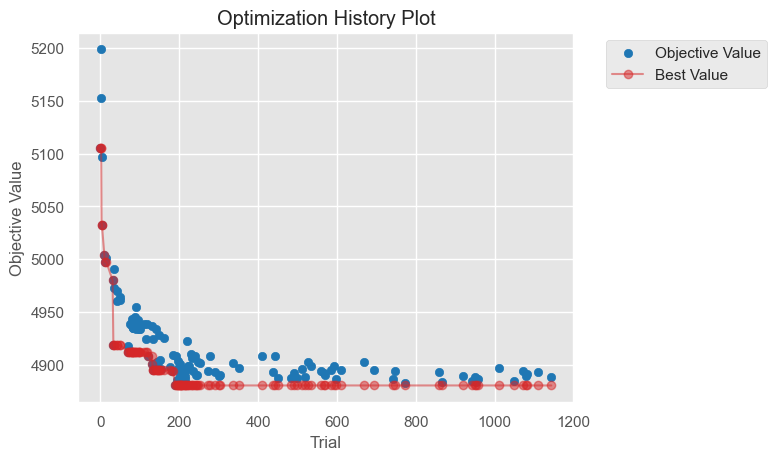

In [148]:
# Visualize Optuna optimization history
plot_optimization_history(study);

In [149]:
# Display best parameters found by Optuna
study.best_trial.params

{'n_estimators': 10000,
 'learning_rate': 0.08333383645684571,
 'num_leaves': 2180,
 'max_depth': 10,
 'min_data_in_leaf': 600,
 'lambda_l1': 0,
 'lambda_l2': 10,
 'min_gain_to_split': 0.0013601563331232715,
 'bagging_fraction': 0.9,
 'bagging_freq': 1,
 'feature_fraction': 0.9}

In [150]:
# Train model using best parameters found by Optuna 
params = {
    "objective": "regression",
    "boosting": "gbdt",
    "metric": "rmse",
    'n_estimators': 10000,
    'learning_rate': 0.08333383645684571,
    'num_leaves': 2180,
    'max_depth': 10,
    'min_data_in_leaf': 600,
    'lambda_l1': 0,
    'lambda_l2': 10,
    'min_gain_to_split': 0.0013601563331232715,
    'bagging_fraction': 0.9,
    'bagging_freq': 1,
    'feature_fraction': 0.9}

train_lgb = lgb.Dataset(X_half_1, label=y_half_1, categorical_feature=categorical_features, free_raw_data=False)
validation_lgb = lgb.Dataset(X_half_2, label=y_half_2, categorical_feature=categorical_features, free_raw_data=False)

watchlist = [train_lgb, validation_lgb]
lgb_model = lgb.train(params, train_set=train_lgb, num_boost_round=1000, valid_sets=watchlist, verbose_eval=200, early_stopping_rounds=200)

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015728 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2796
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 0.003368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [W

In [151]:
# Make prediction using best parameters found by Optuna 
y_pred = lgb_model.predict(X_half_2, num_iteration=lgb_model.best_iteration)
y_pred = y_pred.reshape(len(y_pred),1)
y_pred = y_scaler.inverse_transform(y_pred)
y_val = y_scaler.inverse_transform(y_half_2)
np.sqrt(mean_squared_error(y_val,y_pred))

4880.430872768102

#### Full Data Set

Now we will do the same process with the full train set and predict on the test set

##### Feature Engineering

In [5]:
# Some variables to variate feature engineering
test = "ok" # Apply feature engineering to test set
logscale = False # Apply log scale

# Some variables for features engineering
holidays = ["2016-01-01", "2016-01-18", "2016-02-15", "2016-05-30", "2016-07-04",
            "2016-09-05", "2016-10-10", "2016-11-11", "2016-11-24", "2016-12-26",
            "2017-01-01", "2017-01-16", "2017-02-20", "2017-05-29", "2017-07-04",
            "2017-09-04", "2017-10-09", "2017-11-10", "2017-11-23", "2017-12-25",
            "2018-01-01", "2018-01-15", "2018-02-19", "2018-05-28", "2018-07-04",
            "2018-09-03", "2018-10-08", "2018-11-12", "2018-11-22", "2018-12-25",
            "2019-01-01"]

features_label = ['building_id', 'site_id', 'primary_use',
       'square_feet', 'year_built', 'floor_count', 'air_temperature',
       'cloud_coverage', 'dew_temperature', 'precip_depth_1_hr',
       'sea_level_pressure', 'wind_direction', 'wind_speed', 'meters', 'month', 'weekday',
       'hour', 'day', 'is_holiday']

numerical_features = ['square_feet',
       'year_built', 'floor_count', 'air_temperature',
       'dew_temperature', 'precip_depth_1_hr', 'sea_level_pressure',
       'wind_direction', 'wind_speed']

categorical_features = ["building_id", "site_id", "meters", "primary_use", "hour", "weekday", "month", "cloud_coverage", "is_holiday"]


# Sort Data by Timestamp
train_full.sort_values('timestamp', inplace=True)
train_full.reset_index(drop=True, inplace=True)


# Label Encode Primary Use
le = LabelEncoder()
train_full['primary_use'] = le.fit_transform(train_full['primary_use'])

if test is not None:
    test_full['primary_use'] = le.transform(test_full['primary_use'])

    
# Extract information from timestamp
train_full['month'] = train_full['timestamp'].dt.month
train_full['weekday'] = train_full['timestamp'].dt.weekday
train_full['hour'] = train_full['timestamp'].dt.hour
train_full['day'] = train_full['timestamp'].dt.day

if test is not None:
    test_full['month'] = test_full['timestamp'].dt.month
    test_full['weekday'] = test_full['timestamp'].dt.weekday
    test_full['hour'] = test_full['timestamp'].dt.hour
    test_full['day'] = test_full['timestamp'].dt.day

# Add holidays Feature
train_full["is_holiday"] = (train_full['timestamp'].dt.date.astype("str").isin(holidays)).astype(int)

if test is not None:
    test_full["is_holiday"] = (test_full['timestamp'].dt.date.astype("str").isin(holidays)).astype(int) 
    

# Split train data for the scaling (in particular for minmaxscale)
if logscale:
    train_full['square_feet'] = np.log1p(train_full['square_feet'])
    train_full['meter_reading'] = np.log1p(train_full['meter_reading'])
    data_half_1 = train_full[:int(train_full.shape[0]/2)]
    data_half_2 = train_full[int(train_full.shape[0]/2):]
    if test is not None:
        test_full['square_feet'] = np.log1p(test_full['square_feet'])
        test_full['meter_reading'] = np.log1p(test_full['meter_reading'])

else:
    data_half_1 = train_full[:int(train_full.shape[0]/2)]
    data_half_2 = train_full[int(train_full.shape[0]/2):]
    scaler = MinMaxScaler()
    data_half_1[numerical_features] = scaler.fit_transform(data_half_1[numerical_features])
    data_half_2[numerical_features] = scaler.transform(data_half_2[numerical_features])
    y_scaler = MinMaxScaler()
    data_half_1['meter_reading'] = y_scaler.fit_transform(data_half_1[['meter_reading']])
    data_half_2['meter_reading'] = y_scaler.transform(data_half_2[['meter_reading']])
    if test is not None:
        test_full[numerical_features] = scaler.transform(test_full[numerical_features])


# Split into two halves for validation
X_half_1 = data_half_1[features_label]
X_half_2 = data_half_2[features_label]
y_half_1 = data_half_1[['meter_reading']]
y_half_2 = data_half_2[['meter_reading']]
if test is not None:
    X_test = test_full[features_label]

##### Optimization with Optuna

In [159]:
# Creation of an Optuna study
study_full = optuna.create_study(direction="minimize", study_name="LGBM Regressor Full Data")
func = lambda trial: objective(trial, X_half_1, X_half_2, y_half_1, y_half_2)
study_full.optimize(func, n_trials=40)

[I 2023-02-06 13:02:57,117] A new study created in memory with name: LGBM Regressor Full Data


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.449508 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[120]	training's rmse: 0.00885633	valid_1's rmse: 0.0308481
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[260]	training's rmse: 0.00885633	valid_1's rmse: 0.0308481
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with p

[I 2023-02-06 13:03:48,747] Trial 0 finished with value: 5324.71991829226 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042528312889810835, 'num_leaves': 1080, 'max_depth': 6, 'min_data_in_leaf': 5500, 'lambda_l1': 95, 'lambda_l2': 80, 'min_gain_to_split': 9.664419672286552, 'bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 0 with value: 5324.71991829226.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.362128 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[100]	training's rmse: 0.00870299	valid_1's rmse: 0.030816
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 13:04:51,972] Trial 1 finished with value: 5319.1816976865 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19044554583685205, 'num_leaves': 3000, 'max_depth': 7, 'min_data_in_leaf': 1100, 'lambda_l1': 90, 'lambda_l2': 40, 'min_gain_to_split': 13.726143153913375, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1 with value: 5319.1816976865.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.475917 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[60]	training's rmse: 0.00640924	valid_1's rmse: 0.0305449
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[200]	training's rmse: 0.00640372	valid_1's rmse: 0.0305428
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 13:05:48,327] Trial 2 finished with value: 5272.031097115326 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1871414813057011, 'num_leaves': 1360, 'max_depth': 8, 'min_data_in_leaf': 5900, 'lambda_l1': 65, 'lambda_l2': 45, 'min_gain_to_split': 0.5259015669402173, 'bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 2 with value: 5272.031097115326.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.324323 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[100]	training's rmse: 0.00702645	valid_1's rmse: 0.0306514
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 13:06:31,292] Trial 3 finished with value: 5290.761503729267 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26725544733616274, 'num_leaves': 240, 'max_depth': 6, 'min_data_in_leaf': 2900, 'lambda_l1': 85, 'lambda_l2': 5, 'min_gain_to_split': 1.8172866373451972, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 2 with value: 5272.031097115326.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.485173 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[60]	training's rmse: 0.0080058	valid_1's rmse: 0.0307063
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 13:07:13,615] Trial 4 finished with value: 5300.248841941705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.141708376394132, 'num_leaves': 2460, 'max_depth': 5, 'min_data_in_leaf': 7100, 'lambda_l1': 50, 'lambda_l2': 65, 'min_gain_to_split': 7.181571411156475, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 2 with value: 5272.031097115326.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.425232 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 13:07:21,218] Trial 5 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.401330 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[100]	training's rmse: 0.00754356	valid_1's rmse: 0.0306269
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[280]	training's rmse: 0.00754356	valid_1's rmse: 0.0306269
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with p

[I 2023-02-06 13:08:06,711] Trial 6 finished with value: 5286.5413192331525 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22699120823020583, 'num_leaves': 1000, 'max_depth': 10, 'min_data_in_leaf': 6300, 'lambda_l1': 10, 'lambda_l2': 60, 'min_gain_to_split': 6.8778043725297024, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 2 with value: 5272.031097115326.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.243539 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 13:08:13,441] Trial 7 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.327256 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19


[I 2023-02-06 13:08:20,822] Trial 8 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.352199 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19


[I 2023-02-06 13:08:28,598] Trial 9 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.314400 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 13:08:36,196] Trial 10 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.391393 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[100]	training's rmse: 0.0065984	valid_1's rmse: 0.0305797
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 13:09:10,778] Trial 11 finished with value: 5278.38803883953 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21713253609893887, 'num_leaves': 1780, 'max_depth': 9, 'min_data_in_leaf': 5800, 'lambda_l1': 0, 'lambda_l2': 60, 'min_gain_to_split': 3.2098071467598306, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 2 with value: 5272.031097115326.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.295401 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 13:09:16,206] Trial 12 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.380371 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No furthe

[I 2023-02-06 13:10:10,876] Trial 13 finished with value: 5256.986298857835 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19235667464025905, 'num_leaves': 1720, 'max_depth': 8, 'min_data_in_leaf': 7400, 'lambda_l1': 25, 'lambda_l2': 75, 'min_gain_to_split': 0.048607910192463244, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 13 with value: 5256.986298857835.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.380917 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 13:10:17,624] Trial 14 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.327738 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 13:10:24,732] Trial 15 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.380722 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 13:10:32,973] Trial 16 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.414714 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 13:10:42,038] Trial 17 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.303957 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 13:10:48,963] Trial 18 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.313969 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 13:10:55,178] Trial 19 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.319048 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19


[I 2023-02-06 13:11:01,559] Trial 20 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.357901 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[100]	training's rmse: 0.00664869	valid_1's rmse: 0.0306091
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 13:11:40,052] Trial 21 finished with value: 5283.460548771206 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2127698280337037, 'num_leaves': 1620, 'max_depth': 9, 'min_data_in_leaf': 5400, 'lambda_l1': 20, 'lambda_l2': 55, 'min_gain_to_split': 3.132141834975022, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 13 with value: 5256.986298857835.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.268389 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 13:11:46,433] Trial 22 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.372326 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19


[I 2023-02-06 13:11:52,346] Trial 23 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.467019 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[100]	training's rmse: 0.00608455	valid_1's rmse: 0.0304951
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 13:12:35,415] Trial 24 finished with value: 5263.793950126837 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19957834186915027, 'num_leaves': 2040, 'max_depth': 9, 'min_data_in_leaf': 5900, 'lambda_l1': 0, 'lambda_l2': 70, 'min_gain_to_split': 1.0787981132380593, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 13 with value: 5256.986298857835.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.394859 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 13:12:41,208] Trial 25 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.403224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439


[I 2023-02-06 13:12:46,477] Trial 26 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.396015 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 13:12:52,526] Trial 27 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.315183 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 13:13:00,080] Trial 28 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.400999 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 13:13:07,635] Trial 29 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.448958 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 13:13:16,539] Trial 30 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.374464 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[100]	training's rmse: 0.00649555	valid_1's rmse: 0.0305855
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 13:13:48,459] Trial 31 pruned. Trial was pruned at iteration 216.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.419729 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 13:14:24,329] Trial 32 finished with value: 5275.087450898868 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21696549049403285, 'num_leaves': 1460, 'max_depth': 9, 'min_data_in_leaf': 6700, 'lambda_l1': 0, 'lambda_l2': 55, 'min_gain_to_split': 0.9183027268399718, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 13 with value: 5256.986298857835.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.438094 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[100]	training's rmse: 0.00719306	valid_1's rmse: 0.0305439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 13:14:59,905] Trial 33 finished with value: 5272.2115368570485 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2429905289129486, 'num_leaves': 1440, 'max_depth': 10, 'min_data_in_leaf': 6800, 'lambda_l1': 10, 'lambda_l2': 70, 'min_gain_to_split': 0.8513014557266967, 'bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 13 with value: 5256.986298857835.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.366371 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439


[I 2023-02-06 13:15:05,521] Trial 34 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.438414 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 13:15:40,530] Trial 35 finished with value: 5268.520122663815 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2506543641000387, 'num_leaves': 1960, 'max_depth': 8, 'min_data_in_leaf': 3500, 'lambda_l1': 20, 'lambda_l2': 70, 'min_gain_to_split': 0.9244528312772555, 'bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 13 with value: 5256.986298857835.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.432906 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 13:15:46,863] Trial 36 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.461550 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 13:15:52,614] Trial 37 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.338659 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439


[I 2023-02-06 13:15:58,809] Trial 38 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.542931 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 13:16:06,835] Trial 39 pruned. Trial was pruned at iteration 0.


In [161]:
study_full.optimize(func, n_trials=50)

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.375984 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:21:52,902] Trial 100 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.496991 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:22:32,225] Trial 101 finished with value: 5258.254897344025 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2805250267895582, 'num_leaves': 220, 'max_depth': 8, 'min_data_in_leaf': 3700, 'lambda_l1': 30, 'lambda_l2': 55, 'min_gain_to_split': 0.2544274557986315, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 97 with value: 5246.2240016413625.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.278004 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:22:39,625] Trial 102 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.386618 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:22:47,053] Trial 103 pruned. Trial was pruned at iteration 6.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.385668 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:22:53,765] Trial 104 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.473340 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-06 14:23:04,125] Trial 105 pruned. Trial was pruned at iteration 8.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.350858 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-06 14:23:14,333] Trial 106 pruned. Trial was pruned at iteration 10.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.421913 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[100]	training's rmse: 0.00580269	valid_1's rmse: 0.0304628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:23:52,499] Trial 107 finished with value: 5258.216822508852 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2862326037741367, 'num_leaves': 460, 'max_depth': 9, 'min_data_in_leaf': 4500, 'lambda_l1': 30, 'lambda_l2': 60, 'min_gain_to_split': 0.2622886302316031, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 97 with value: 5246.2240016413625.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.422007 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[60]	training's rmse: 0.00587173	valid_1's rmse: 0.0304703
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:24:32,299] Trial 108 finished with value: 5259.513982642364 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28956397076970053, 'num_leaves': 20, 'max_depth': 7, 'min_data_in_leaf': 4500, 'lambda_l1': 35, 'lambda_l2': 75, 'min_gain_to_split': 0.27910666123872446, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 97 with value: 5246.2240016413625.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.405861 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[60]	training's rmse: 0.00574997	valid_1's rmse: 0.0304697
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:25:08,888] Trial 109 pruned. Trial was pruned at iteration 223.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.332750 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[160]	training's rmse: 0.00519055	valid_1's rmse: 0.0304221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:25:59,368] Trial 110 finished with value: 5251.18336658197 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28095332559369846, 'num_leaves': 60, 'max_depth': 7, 'min_data_in_leaf': 4300, 'lambda_l1': 30, 'lambda_l2': 75, 'min_gain_to_split': 0.0072917914801262085, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 97 with value: 5246.2240016413625.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.358065 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[100]	training's rmse: 0.0057523	valid_1's rmse: 0.0304584
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:26:34,713] Trial 111 pruned. Trial was pruned at iteration 223.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.464775 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[100]	training's rmse: 0.00598525	valid_1's rmse: 0.030478
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:27:11,108] Trial 112 finished with value: 5260.830684197734 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2896181842642309, 'num_leaves': 120, 'max_depth': 7, 'min_data_in_leaf': 3800, 'lambda_l1': 35, 'lambda_l2': 75, 'min_gain_to_split': 0.5818963987365613, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 97 with value: 5246.2240016413625.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.446575 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[160]	training's rmse: 0.00537565	valid_1's rmse: 0.0304384
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:28:07,900] Trial 113 finished with value: 5254.003995231465 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2838506284655185, 'num_leaves': 20, 'max_depth': 6, 'min_data_in_leaf': 4600, 'lambda_l1': 30, 'lambda_l2': 85, 'min_gain_to_split': 0.03256214322471862, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 97 with value: 5246.2240016413625.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.279768 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:28:14,366] Trial 114 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.357191 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:28:21,113] Trial 115 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.359816 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-06 14:28:31,136] Trial 116 pruned. Trial was pruned at iteration 11.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.400271 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:28:38,512] Trial 117 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.467724 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:28:45,421] Trial 118 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.435842 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:28:53,156] Trial 119 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.299215 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:29:01,641] Trial 120 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.368855 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[100]	training's rmse: 0.00586128	valid_1's rmse: 0.0304648
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:29:39,338] Trial 121 finished with value: 5258.552569897497 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2889555827078051, 'num_leaves': 340, 'max_depth': 8, 'min_data_in_leaf': 4200, 'lambda_l1': 25, 'lambda_l2': 60, 'min_gain_to_split': 0.3697985607285479, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 97 with value: 5246.2240016413625.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.321444 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:29:47,804] Trial 122 pruned. Trial was pruned at iteration 6.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.434703 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:30:25,082] Trial 123 pruned. Trial was pruned at iteration 223.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.328723 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[60]	training's rmse: 0.00551122	valid_1's rmse: 0.0304519
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[200]	training's rmse: 0.00551099	valid_1's rmse: 0.0304515
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:31:16,466] Trial 124 pruned. Trial was pruned at iteration 324.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.316316 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:31:23,915] Trial 125 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.330634 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:31:32,730] Trial 126 pruned. Trial was pruned at iteration 6.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.315674 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:31:40,400] Trial 127 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.271062 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:31:50,879] Trial 128 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.406755 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:32:01,299] Trial 129 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.255665 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19


[I 2023-02-06 14:32:07,507] Trial 130 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.316928 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[100]	training's rmse: 0.00575273	valid_1's rmse: 0.0304611
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:32:43,360] Trial 131 pruned. Trial was pruned at iteration 223.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.318990 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:32:49,820] Trial 132 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.297444 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:32:56,800] Trial 133 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.394868 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:33:03,577] Trial 134 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.373904 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[100]	training's rmse: 0.00590471	valid_1's rmse: 0.0304652
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:33:41,096] Trial 135 finished with value: 5258.626314415846 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2885510395915777, 'num_leaves': 100, 'max_depth': 9, 'min_data_in_leaf': 4700, 'lambda_l1': 30, 'lambda_l2': 60, 'min_gain_to_split': 0.350519762440497, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 97 with value: 5246.2240016413625.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.282818 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:33:49,571] Trial 136 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.417453 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[100]	training's rmse: 0.00575173	valid_1's rmse: 0.0304796
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:34:24,004] Trial 137 pruned. Trial was pruned at iteration 215.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.369053 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[I 2023-02-06 14:34:33,862] Trial 138 pruned. Trial was pruned at iteration 5.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.445867 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:34:41,635] Trial 139 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.419468 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439


[I 2023-02-06 14:34:49,668] Trial 140 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.319301 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:35:28,180] Trial 141 pruned. Trial was pruned at iteration 223.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.459230 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:35:36,869] Trial 142 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.319196 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:35:43,770] Trial 143 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.394323 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[160]	training's rmse: 0.00528931	valid_1's rmse: 0.0304264
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:36:29,180] Trial 144 finished with value: 5251.0591276444775 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2931195300362527, 'num_leaves': 280, 'max_depth': 9, 'min_data_in_leaf': 4700, 'lambda_l1': 30, 'lambda_l2': 25, 'min_gain_to_split': 0.006159104786927938, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 97 with value: 5246.2240016413625.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.363206 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:36:34,845] Trial 145 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.422717 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:36:41,098] Trial 146 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.259900 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19


[I 2023-02-06 14:36:48,062] Trial 147 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.322892 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:36:55,585] Trial 148 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.510259 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:37:01,781] Trial 149 pruned. Trial was pruned at iteration 0.


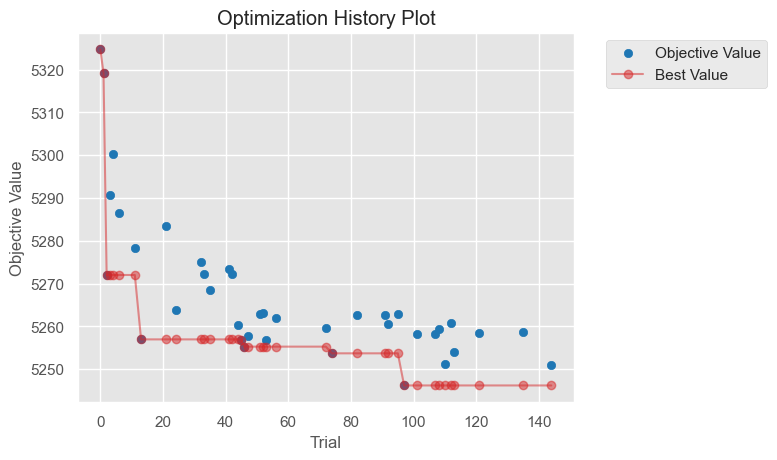

In [162]:
# Visualize Optuna optimization history
plot_optimization_history(study_full);

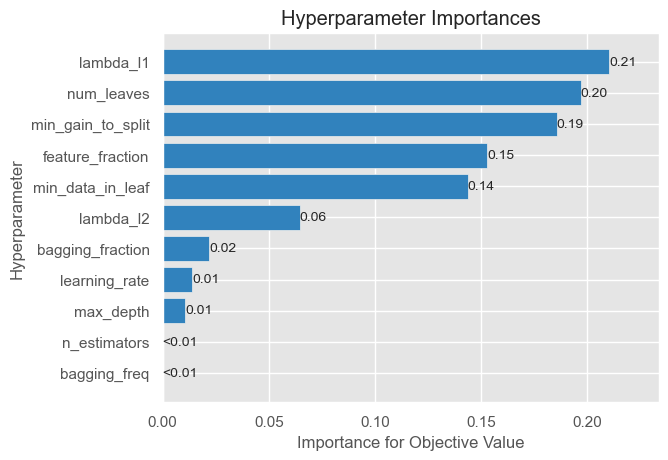

In [163]:
# Visualize the importance of hyperparameters during Optuna's optimization
plot_param_importances(study_full);

In [164]:
study_full.best_trial.params

{'n_estimators': 10000,
 'learning_rate': 0.28161909589154444,
 'num_leaves': 200,
 'max_depth': 10,
 'min_data_in_leaf': 3900,
 'lambda_l1': 30,
 'lambda_l2': 55,
 'min_gain_to_split': 0.00375133282392226,
 'bagging_fraction': 0.7,
 'bagging_freq': 1,
 'feature_fraction': 0.9}

##### Prediction with Optimized Model

In [8]:
# Train model using best parameters found by Optuna 
params = {
    "objective": "regression",
    "boosting": "gbdt",
    "metric": "rmse",
    'n_estimators': 10000,
    'learning_rate': 0.28161909589154444,
    'num_leaves': 200,
    'max_depth': 10,
    'min_data_in_leaf': 3900,
    'lambda_l1': 30,
    'lambda_l2': 55,
    'min_gain_to_split': 0.00375133282392226,
    'bagging_fraction': 0.7,
    'bagging_freq': 1,
    'feature_fraction': 0.9}

train_lgb = lgb.Dataset(X_half_1, label=y_half_1, categorical_feature=categorical_features, free_raw_data=False)
validation_lgb = lgb.Dataset(X_half_2, label=y_half_2, categorical_feature=categorical_features, free_raw_data=False)

watchlist = [train_lgb, validation_lgb]
lgb_model = lgb.train(params, train_set=train_lgb, num_boost_round=1000, valid_sets=watchlist, verbose_eval=200, early_stopping_rounds=200)

y_pred = lgb_model.predict(X_test, num_iteration=lgb_model.best_iteration)
y_pred = y_pred.reshape(len(y_pred),1)
y_pred = y_scaler.inverse_transform(y_pred)

row_ids = X_test.reset_index()['index'].values


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.336959 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2799
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

In [ ]:
df_fimp = pd.DataFrame()
df_fimp["feature"] = train_lgb.feature_name
df_fimp["importance"] = lgb_model.feature_importance()

plt.figure(figsize=(14, 7))
sns.barplot(x="importance", y="feature", data=df_fimp.sort_values(by="importance", ascending=False))
plt.title("LightGBM Feature Importance")
plt.tight_layout()

In [ ]:
# Prepare data for submission
submission = pd.DataFrame({"row_id": row_ids, "meter_reading": np.clip(np.clip(y_pred, 0, a_max=None).reshape(len(y_pred)), 0, a_max=None)})
submission.to_csv("submission_minmax_06_02_2022.csv", index=False)

Score on Kaggle **1.795**

### LightGBM: Feature Engineering with Label Encoding and Log Scaling

#### Quick test with sample and fixed hyperparameters

In [11]:
train_sample = train_full.sample(frac=0.05, random_state=25)

# Some variables to variate feature engineering
test = None # Apply feature engineering to test set
logscale = True # Apply log scale

# Some variables for features engineering
holidays = ["2016-01-01", "2016-01-18", "2016-02-15", "2016-05-30", "2016-07-04",
            "2016-09-05", "2016-10-10", "2016-11-11", "2016-11-24", "2016-12-26",
            "2017-01-01", "2017-01-16", "2017-02-20", "2017-05-29", "2017-07-04",
            "2017-09-04", "2017-10-09", "2017-11-10", "2017-11-23", "2017-12-25",
            "2018-01-01", "2018-01-15", "2018-02-19", "2018-05-28", "2018-07-04",
            "2018-09-03", "2018-10-08", "2018-11-12", "2018-11-22", "2018-12-25",
            "2019-01-01"]

features_label = ['building_id', 'site_id', 'primary_use',
       'square_feet', 'year_built', 'floor_count', 'air_temperature',
       'cloud_coverage', 'dew_temperature', 'precip_depth_1_hr',
       'sea_level_pressure', 'wind_direction', 'wind_speed', 'meters', 'month', 'weekday',
       'hour', 'day', 'is_holiday']

numerical_features = ['square_feet',
       'year_built', 'floor_count', 'air_temperature',
       'dew_temperature', 'precip_depth_1_hr', 'sea_level_pressure',
       'wind_direction', 'wind_speed']

categorical_features = ["building_id", "site_id", "meters", "primary_use", "hour", "weekday", "month", "cloud_coverage", "is_holiday"]

# Sort Data by Timestamp
train_sample.sort_values('timestamp', inplace=True)
train_sample.reset_index(drop=True, inplace=True)


# Label Encode Primary Use
le = LabelEncoder()
train_sample['primary_use'] = le.fit_transform(train_sample['primary_use'])

if test is not None:
    test_full['primary_use'] = le.transform(test_full['primary_use'])


# Extract information from timestamp
train_sample['month'] = train_sample['timestamp'].dt.month
train_sample['weekday'] = train_sample['timestamp'].dt.weekday
train_sample['hour'] = train_sample['timestamp'].dt.hour
train_sample['day'] = train_sample['timestamp'].dt.day

if test is not None:
    test_full['month'] = test_full['timestamp'].dt.month
    test_full['weekday'] = test_full['timestamp'].dt.weekday
    test_full['hour'] = test_full['timestamp'].dt.hour
    test_full['day'] = test_full['timestamp'].dt.day

    
# Add holidays feature
train_sample["is_holiday"] = (train_sample['timestamp'].dt.date.astype("str").isin(holidays)).astype(int)

if test is not None:
    test_full["is_holiday"] = (test_full['timestamp'].dt.date.astype("str").isin(holidays)).astype(int) 
    

# Split train data for the scaling (in particular for minmaxscale)
if logscale:
    train_sample['square_feet'] = np.log1p(train_sample['square_feet'])
    train_sample['meter_reading'] = np.log1p(train_sample['meter_reading'])
    data_half_1 = train_sample[:int(train_sample.shape[0]/2)]
    data_half_2 = train_sample[int(train_sample.shape[0]/2):]
    if test is not None:
        test_full['square_feet'] = np.log1p(test_full['square_feet'])
        test_full['meter_reading'] = np.log1p(test_full['meter_reading'])

else:
    data_half_1 = train_sample[:int(train_sample.shape[0]/2)]
    data_half_2 = train_sample[int(train_sample.shape[0]/2):]
    scaler = MinMaxScaler()
    data_half_1[numerical_features] = scaler.fit_transform(data_half_1[numerical_features])
    data_half_2[numerical_features] = scaler.transform(data_half_2[numerical_features])
    y_scaler = MinMaxScaler()
    data_half_1['meter_reading'] = y_scaler.fit_transform(data_half_1[['meter_reading']])
    data_half_2['meter_reading'] = y_scaler.transform(data_half_2[['meter_reading']])
    if test is not None:
        test_full[numerical_features] = scaler.transform(test_full[numerical_features])


# Split into two halves for validation
X_half_1 = data_half_1[features_label]
X_half_2 = data_half_2[features_label]
y_half_1 = data_half_1[['meter_reading']]
y_half_2 = data_half_2[['meter_reading']]
if test is not None:
    X_test = test_full[features_label]

In [53]:
# Use some fixed parameters for LightGBM model based on https://www.kaggle.com/code/rohanrao/ashrae-half-and-half parameters
params = {
    "objective": "regression",
    "boosting": "gbdt",
    "metric": "rmse",
    "num_leaves": 40,
    "learning_rate": 0.05,
    "feature_fraction": 0.85,
    "reg_lambda": 2
}

train_lgb = lgb.Dataset(X_half_1, label=y_half_1, categorical_feature=categorical_features, free_raw_data=False)
validation_lgb = lgb.Dataset(X_half_2, label=y_half_2, categorical_feature=categorical_features, free_raw_data=False)

watchlist = [train_lgb, validation_lgb]
lgb_model = lgb.train(params, train_set=train_lgb, num_boost_round=1000, valid_sets=watchlist, verbose_eval=200, early_stopping_rounds=200)

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016030 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
Training until validation scores don't improve for 200 rounds
[200]	training's rmse: 0.827714	valid_1's rmse: 1.55342
Early stopping, best iteration is:
[173]	training's rmse: 0.845369	valid_1's rmse: 1.54929


In [54]:
# We predict second half set 
y_val = np.expm1(y_half_2)
y_pred = lgb_model.predict(X_half_2)
y_pred = y_pred.reshape(len(y_pred),1)
y_pred = np.expm1(y_pred)
np.sqrt(mean_squared_error(y_val,y_pred))

4999.661185341245

**With Optuna**

In [55]:
def objective(trial, X_half_1, X_half_2, y_half_1, y_half_2, scale=True):
    params_grid = {
        "objective": "regression",
        "boosting": "gbdt",
        "metric": "rmse",
        "n_estimators": trial.suggest_categorical("n_estimators", [10000]),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),
        "num_leaves": trial.suggest_int("num_leaves", 20, 3000, step=20),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 200, 10000, step=100),
        "lambda_l1": trial.suggest_int("lambda_l1", 0, 100, step=5),
        "lambda_l2": trial.suggest_int("lambda_l2", 0, 100, step=5),
        "min_gain_to_split": trial.suggest_float("min_gain_to_split", 0, 15),
        "bagging_fraction": trial.suggest_float(
            "bagging_fraction", 0.5, 0.95, step=0.1
        ),
        "bagging_freq": trial.suggest_categorical("bagging_freq", [1]),
        "feature_fraction": trial.suggest_float(
            "feature_fraction", 0.5, 0.95, step=0.1
        )
    }
    
    train_lgb = lgb.Dataset(X_half_1, label=y_half_1, categorical_feature=categorical_features, free_raw_data=False)
    validation_lgb = lgb.Dataset(X_half_2, label=y_half_2, categorical_feature=categorical_features, free_raw_data=False)
    
    watchlist = [train_lgb, validation_lgb]
    
    pruning_callback = optuna.integration.LightGBMPruningCallback(trial, 'rmse', valid_name='valid_1')   
    
    lgb_model = lgb.train(params_grid, 
                          train_set=train_lgb, 
                          num_boost_round=1000, 
                          valid_sets=watchlist, 
                          verbose_eval=200, 
                          callbacks=[pruning_callback],
                          early_stopping_rounds=200)
    
    if scale:
        y_pred = lgb_model.predict(X_half_2, num_iteration=lgb_model.best_iteration)
        y_pred = y_pred.reshape(len(y_pred),1)
        y_pred = y_scaler.inverse_transform(y_pred)
        y_val = y_scaler.inverse_transform(y_half_2)
    else:
        y_pred = lgb_model.predict(X_half_2)
        y_pred = y_pred.reshape(len(y_pred),1)
        y_pred = np.expm1(y_pred)
        y_val = np.expm1(y_half_2)
    
    return(np.sqrt(mean_squared_error(y_val,y_pred)))


In [56]:
# Creation of an Optuna study
study2 = optuna.create_study(direction="minimize", study_name="LGBM Regressor Log Scaler")
func = lambda trial: objective(trial, X_half_1, X_half_2, y_half_1, y_half_2, scale=False)
study2.optimize(func, n_trials=60)

[I 2023-02-06 16:09:49,881] A new study created in memory with name: LGBM Regressor Log Scaler


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013194 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[600]	training's rmse: 1.

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2000]	training's rmse: 1.18268	valid_1's rmse: 1.59886
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2600]	training's rmse: 1.16232	valid_1's rmse: 1.5928
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requireme

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training beca

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[I 2023-02-06 16:11:45,492] Trial 0 finished with value: 5077.761465084871 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010039131052955614, 'num_leaves': 700, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 5, 'lambda_l2': 55, 'min_gain_to_split': 13.478459885124463, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6}. Best is trial 0 with value: 5077.761465084871.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027819 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2023-02-06 16:11:55,559] Trial 1 finished with value: 5085.255517242553 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09904301864095082, 'num_leaves': 400, 'max_depth': 8, 'min_data_in_leaf': 6700, 'lambda_l1': 25, 'lambda_l2': 5, 'min_gain_to_split': 12.375339112429511, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 0 with value: 5077.761465084871.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019069 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits wit

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [W

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [W

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spl

[I 2023-02-06 16:12:18,185] Trial 2 finished with value: 5094.184645796456 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09242608881550059, 'num_leaves': 1940, 'max_depth': 5, 'min_data_in_leaf': 4300, 'lambda_l1': 55, 'lambda_l2': 60, 'min_gain_to_split': 14.093820361441004, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6}. Best is trial 0 with value: 5077.761465084871.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016661 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2023-02-06 16:12:30,959] Trial 3 finished with value: 5177.620603100763 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0452050270088451, 'num_leaves': 2940, 'max_depth': 4, 'min_data_in_leaf': 8900, 'lambda_l1': 10, 'lambda_l2': 70, 'min_gain_to_split': 0.8091830230542513, 'bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.6}. Best is trial 0 with value: 5077.761465084871.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023214 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[200]	training's rmse: 1.13767	valid_1's rmse: 1.64373
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warn

[I 2023-02-06 16:12:37,186] Trial 4 finished with value: 5123.39925690433 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24480524969623127, 'num_leaves': 1980, 'max_depth': 9, 'min_data_in_leaf': 5100, 'lambda_l1': 10, 'lambda_l2': 75, 'min_gain_to_split': 10.590025412860927, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6}. Best is trial 0 with value: 5077.761465084871.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022217 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training beca

[I 2023-02-06 16:12:49,808] Trial 5 finished with value: 5095.776195640978 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1452441292204589, 'num_leaves': 1920, 'max_depth': 8, 'min_data_in_leaf': 4200, 'lambda_l1': 25, 'lambda_l2': 25, 'min_gain_to_split': 11.193444746924595, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 0 with value: 5077.761465084871.
[I 2023-02-06 16:12:50,256] Trial 6 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016720 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028231 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[200]	training's rmse: 1.09766	valid_1's rmse: 1.55338
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no mor

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training beca

[I 2023-02-06 16:12:59,542] Trial 7 finished with value: 5100.472456868138 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18464937374424994, 'num_leaves': 200, 'max_depth': 8, 'min_data_in_leaf': 5600, 'lambda_l1': 90, 'lambda_l2': 5, 'min_gain_to_split': 14.52484164885397, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 0 with value: 5077.761465084871.
[I 2023-02-06 16:12:59,946] Trial 8 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021570 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028881 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:13:00,949] Trial 9 pruned. Trial was pruned at iteration 18.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025303 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
Training until validation scores don't improve for 200 rounds


[I 2023-02-06 16:13:01,526] Trial 10 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:13:02,017] Trial 11 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023054 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388


[I 2023-02-06 16:13:02,518] Trial 12 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026110 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:13:02,983] Trial 13 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018026 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:13:03,504] Trial 14 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027833 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029602 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:13:04,073] Trial 15 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:13:04,530] Trial 16 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027693 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388


[I 2023-02-06 16:13:05,039] Trial 17 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025256 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:13:05,567] Trial 18 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023390 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:13:06,056] Trial 19 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023620 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026969 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:13:06,713] Trial 20 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:13:07,215] Trial 21 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021017 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388


[I 2023-02-06 16:13:07,726] Trial 22 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026434 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:13:08,210] Trial 23 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017843 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:13:08,714] Trial 24 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021420 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:13:09,227] Trial 25 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027456 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:13:09,743] Trial 26 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023463 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388


[I 2023-02-06 16:13:10,312] Trial 27 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018277 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:13:10,816] Trial 28 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029493 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:13:11,282] Trial 29 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025305 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025099 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:13:11,865] Trial 30 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026346 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-02-06 16:13:13,129] Trial 31 pruned. Trial was pruned at iteration 21.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:13:13,655] Trial 32 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020518 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023366 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2023-02-06 16:13:21,407] Trial 33 finished with value: 5111.148549554593 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16297961817763304, 'num_leaves': 1700, 'max_depth': 8, 'min_data_in_leaf': 3900, 'lambda_l1': 5, 'lambda_l2': 60, 'min_gain_to_split': 10.840345815215928, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 0 with value: 5077.761465084871.
[I 2023-02-06 16:13:21,900] Trial 34 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026090 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:13:22,405] Trial 35 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021888 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:13:22,885] Trial 36 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021979 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:13:23,336] Trial 37 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020134 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:13:23,815] Trial 38 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029591 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:13:24,300] Trial 39 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024750 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023903 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:13:25,027] Trial 40 pruned. Trial was pruned at iteration 5.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029674 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[200]	training's rmse: 1.02745	valid_1's rmse: 1.52981
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warn

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[I 2023-02-06 16:13:34,645] Trial 41 finished with value: 5070.118861165556 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17219213208725595, 'num_leaves': 180, 'max_depth': 9, 'min_data_in_leaf': 5500, 'lambda_l1': 90, 'lambda_l2': 5, 'min_gain_to_split': 14.205443542438315, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 41 with value: 5070.118861165556.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020289 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[I 2023-02-06 16:13:44,636] Trial 42 finished with value: 5064.669361721059 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1519077827599963, 'num_leaves': 200, 'max_depth': 9, 'min_data_in_leaf': 5000, 'lambda_l1': 85, 'lambda_l2': 5, 'min_gain_to_split': 14.31539482164664, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 5064.669361721059.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.031967 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:13:45,405] Trial 43 pruned. Trial was pruned at iteration 6.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025191 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2023-02-06 16:14:06,892] Trial 44 finished with value: 5052.809084331263 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1449314789560894, 'num_leaves': 540, 'max_depth': 10, 'min_data_in_leaf': 5000, 'lambda_l1': 90, 'lambda_l2': 5, 'min_gain_to_split': 13.36809770027289, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 44 with value: 5052.809084331263.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027607 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2023-02-06 16:14:13,595] Trial 45 finished with value: 5101.128721762898 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14782965088197378, 'num_leaves': 520, 'max_depth': 11, 'min_data_in_leaf': 5100, 'lambda_l1': 90, 'lambda_l2': 5, 'min_gain_to_split': 13.160499004504954, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 44 with value: 5052.809084331263.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024953 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:14:14,378] Trial 46 pruned. Trial was pruned at iteration 6.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:14:14,900] Trial 47 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029053 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025415 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:14:15,458] Trial 48 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023011 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[200]	training's rmse: 0.982466	valid_1's rmse: 1.5501
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits wit

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[400]	training's rmse: 0.969859	valid_1's rmse: 1.54771
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped tra

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

[I 2023-02-06 16:14:29,594] Trial 49 finished with value: 5032.735548182877 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21843815106898015, 'num_leaves': 160, 'max_depth': 9, 'min_data_in_leaf': 1100, 'lambda_l1': 75, 'lambda_l2': 15, 'min_gain_to_split': 13.423995589194083, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 49 with value: 5032.735548182877.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020107 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2023-02-06 16:14:33,040] Trial 50 pruned. Trial was pruned at iteration 132.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:14:33,537] Trial 51 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026322 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024191 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with

[I 2023-02-06 16:14:35,173] Trial 52 pruned. Trial was pruned at iteration 22.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.030698 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[200]	training's rmse: 0.982411	valid_1's rmse: 1.5543
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no mor

[I 2023-02-06 16:14:40,303] Trial 53 pruned. Trial was pruned at iteration 261.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[I 2023-02-06 16:14:41,312] Trial 54 pruned. Trial was pruned at iteration 11.
[I 2023-02-06 16:14:41,818] Trial 55 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024752 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025207 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:14:42,380] Trial 56 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:14:42,898] Trial 57 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028712 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:14:43,448] Trial 58 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027262 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:14:43,939] Trial 59 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024586 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


In [58]:
study2.optimize(func, n_trials=200)

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016617 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-02-06 16:15:01,261] Trial 60 pruned. Trial was pruned at iteration 12.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:01,724] Trial 61 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023870 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:02,211] Trial 62 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025443 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388


[I 2023-02-06 16:15:02,718] Trial 63 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023098 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:03,180] Trial 64 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022738 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388


[I 2023-02-06 16:15:03,665] Trial 65 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024567 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:04,145] Trial 66 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021874 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:04,626] Trial 67 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024103 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388


[I 2023-02-06 16:15:05,166] Trial 68 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022525 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:05,633] Trial 69 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024910 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:06,115] Trial 70 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025794 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019856 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:15:06,651] Trial 71 pruned. Trial was pruned at iteration 1.
[I 2023-02-06 16:15:07,151] Trial 72 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026552 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:07,654] Trial 73 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024724 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:08,145] Trial 74 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016450 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:08,650] Trial 75 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027450 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:09,138] Trial 76 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026697 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025183 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:15:10,803] Trial 77 pruned. Trial was pruned at iteration 27.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:11,341] Trial 78 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022991 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:11,856] Trial 79 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024608 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:12,347] Trial 80 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026517 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:12,852] Trial 81 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024793 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:13,374] Trial 82 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023031 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:13,883] Trial 83 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024776 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026133 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[I 2023-02-06 16:15:19,765] Trial 84 pruned. Trial was pruned at iteration 261.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[I 2023-02-06 16:15:20,286] Trial 85 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022162 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:20,784] Trial 86 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024866 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:21,285] Trial 87 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025661 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023049 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:15:22,118] Trial 88 pruned. Trial was pruned at iteration 8.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:22,627] Trial 89 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:23,174] Trial 90 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019572 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026985 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2023-02-06 16:15:46,474] Trial 91 finished with value: 5081.327551893707 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14767958886082452, 'num_leaves': 900, 'max_depth': 12, 'min_data_in_leaf': 5200, 'lambda_l1': 85, 'lambda_l2': 5, 'min_gain_to_split': 13.361090620523967, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 49 with value: 5032.735548182877.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021822 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-02-06 16:15:47,737] Trial 92 pruned. Trial was pruned at iteration 18.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023469 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-02-06 16:15:48,737] Trial 93 pruned. Trial was pruned at iteration 10.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021735 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:49,429] Trial 94 pruned. Trial was pruned at iteration 6.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023328 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:50,015] Trial 95 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:50,495] Trial 96 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026508 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:50,985] Trial 97 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025336 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021883 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:15:51,742] Trial 98 pruned. Trial was pruned at iteration 6.
[I 2023-02-06 16:15:52,197] Trial 99 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022424 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:52,677] Trial 100 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021602 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029398 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:15:53,621] Trial 101 pruned. Trial was pruned at iteration 11.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:54,132] Trial 102 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025715 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:54,594] Trial 103 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022101 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022666 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:15:56,610] Trial 104 pruned. Trial was pruned at iteration 30.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:57,131] Trial 105 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025092 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:57,684] Trial 106 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026802 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:58,219] Trial 107 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028565 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025319 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:15:58,872] Trial 108 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026747 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds


[I 2023-02-06 16:15:59,498] Trial 109 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:15:59,997] Trial 110 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020118 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:00,545] Trial 111 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028355 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024823 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:16:01,123] Trial 112 pruned. Trial was pruned at iteration 2.
[I 2023-02-06 16:16:01,616] Trial 113 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023616 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:02,101] Trial 114 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022370 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:02,602] Trial 115 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020526 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021984 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:16:03,505] Trial 116 pruned. Trial was pruned at iteration 10.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:03,982] Trial 117 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022583 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:04,527] Trial 118 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026534 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:05,038] Trial 119 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024105 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:05,552] Trial 120 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023188 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:06,084] Trial 121 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022169 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:06,597] Trial 122 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020119 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:07,103] Trial 123 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022706 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:07,595] Trial 124 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018985 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:08,070] Trial 125 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023023 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:08,565] Trial 126 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028229 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388


[I 2023-02-06 16:16:09,047] Trial 127 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018865 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023990 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:16:10,049] Trial 128 pruned. Trial was pruned at iteration 11.
[I 2023-02-06 16:16:10,536] Trial 129 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023960 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:11,039] Trial 130 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017428 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:11,516] Trial 131 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017342 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:11,994] Trial 132 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025582 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388


[I 2023-02-06 16:16:12,467] Trial 133 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021032 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:12,990] Trial 134 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023968 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:13,504] Trial 135 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023787 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:14,018] Trial 136 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023650 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:14,530] Trial 137 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026320 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:15,045] Trial 138 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018947 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:15,526] Trial 139 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024223 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:16,034] Trial 140 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023953 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:16,589] Trial 141 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026238 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021540 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[I 2023-02-06 16:16:23,415] Trial 142 finished with value: 5038.855822321999 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18859098538520547, 'num_leaves': 740, 'max_depth': 8, 'min_data_in_leaf': 1100, 'lambda_l1': 100, 'lambda_l2': 15, 'min_gain_to_split': 13.518726468884735, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 49 with value: 5032.735548182877.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.031024 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:24,250] Trial 143 pruned. Trial was pruned at iteration 6.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024320 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-02-06 16:16:25,694] Trial 144 pruned. Trial was pruned at iteration 14.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:26,236] Trial 145 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022096 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020428 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:16:28,457] Trial 146 pruned. Trial was pruned at iteration 39.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022493 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:29,015] Trial 147 pruned. Trial was pruned at iteration 2.
[I 2023-02-06 16:16:29,542] Trial 148 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020378 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:30,103] Trial 149 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028595 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:30,656] Trial 150 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021697 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022824 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no 

[I 2023-02-06 16:16:37,097] Trial 151 finished with value: 5056.232732385036 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19210568120893828, 'num_leaves': 780, 'max_depth': 8, 'min_data_in_leaf': 1100, 'lambda_l1': 95, 'lambda_l2': 10, 'min_gain_to_split': 14.724759731812286, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 49 with value: 5032.735548182877.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028468 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-02-06 16:16:39,075] Trial 152 pruned. Trial was pruned at iteration 34.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026160 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-02-06 16:16:40,190] Trial 153 pruned. Trial was pruned at iteration 15.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023515 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-02-06 16:16:41,004] Trial 154 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023013 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-02-06 16:16:42,258] Trial 155 pruned. Trial was pruned at iteration 20.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:42,779] Trial 156 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022297 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:16:43,923] Trial 157 pruned. Trial was pruned at iteration 11.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:44,456] Trial 158 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024324 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:45,001] Trial 159 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.030520 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:45,582] Trial 160 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028880 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:46,188] Trial 161 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027619 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:46,748] Trial 162 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025666 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.031087 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:16:48,715] Trial 163 pruned. Trial was pruned at iteration 30.
[I 2023-02-06 16:16:49,235] Trial 164 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025492 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019981 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:16:49,779] Trial 165 pruned. Trial was pruned at iteration 1.
[I 2023-02-06 16:16:50,276] Trial 166 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024477 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027979 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:16:52,543] Trial 167 pruned. Trial was pruned at iteration 39.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:53,044] Trial 168 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021755 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:53,524] Trial 169 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:54,065] Trial 170 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019775 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:54,597] Trial 171 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025106 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:55,113] Trial 172 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022282 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:55,611] Trial 173 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023409 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:56,112] Trial 174 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026769 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:56,608] Trial 175 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018704 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:57,105] Trial 176 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024788 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026985 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:16:57,952] Trial 177 pruned. Trial was pruned at iteration 10.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021818 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds


[I 2023-02-06 16:16:58,656] Trial 178 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020793 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:16:59,273] Trial 179 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023817 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-02-06 16:17:00,960] Trial 180 pruned. Trial was pruned at iteration 30.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022643 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requireme

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training beca

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[I 2023-02-06 16:17:13,756] Trial 181 finished with value: 4999.8033641555085 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17773507446883052, 'num_leaves': 60, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 90, 'lambda_l2': 15, 'min_gain_to_split': 13.417733278457684, 'bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 181 with value: 4999.8033641555085.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022370 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-02-06 16:17:15,055] Trial 182 pruned. Trial was pruned at iteration 20.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021103 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:17:16,255] Trial 183 pruned. Trial was pruned at iteration 20.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:17:16,763] Trial 184 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024540 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:17:17,253] Trial 185 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021435 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388


[I 2023-02-06 16:17:17,742] Trial 186 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022334 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023154 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:17:18,308] Trial 187 pruned. Trial was pruned at iteration 1.
[I 2023-02-06 16:17:18,784] Trial 188 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022653 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:17:19,279] Trial 189 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023132 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:17:19,768] Trial 190 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016539 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:17:20,290] Trial 191 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021050 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:17:20,819] Trial 192 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.031060 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:17:21,367] Trial 193 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029985 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028817 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:17:23,174] Trial 194 pruned. Trial was pruned at iteration 27.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023937 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:17:23,885] Trial 195 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024956 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-02-06 16:17:25,948] Trial 196 pruned. Trial was pruned at iteration 39.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:17:26,520] Trial 197 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027063 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021144 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:17:29,140] Trial 198 pruned. Trial was pruned at iteration 56.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:17:29,655] Trial 199 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023762 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:17:30,186] Trial 200 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021537 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023292 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:17:31,154] Trial 201 pruned. Trial was pruned at iteration 10.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:17:31,703] Trial 202 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023300 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020797 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:17:32,564] Trial 203 pruned. Trial was pruned at iteration 8.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:17:33,110] Trial 204 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022564 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:17:33,906] Trial 205 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023945 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[Li

[I 2023-02-06 16:17:34,554] Trial 206 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:17:35,114] Trial 207 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022928 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:17:35,669] Trial 208 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027218 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026042 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
Training until validation scores don't impr

[I 2023-02-06 16:17:37,856] Trial 209 pruned. Trial was pruned at iteration 29.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:17:38,361] Trial 210 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022829 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024544 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:17:39,670] Trial 211 pruned. Trial was pruned at iteration 16.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022507 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-02-06 16:17:40,976] Trial 212 pruned. Trial was pruned at iteration 17.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025591 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-02-06 16:17:42,872] Trial 213 pruned. Trial was pruned at iteration 33.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024806 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stop

[I 2023-02-06 16:17:49,013] Trial 214 finished with value: 5003.938991402761 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18138439539713133, 'num_leaves': 880, 'max_depth': 8, 'min_data_in_leaf': 1100, 'lambda_l1': 85, 'lambda_l2': 10, 'min_gain_to_split': 9.173540791783383, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 181 with value: 4999.8033641555085.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022240 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2023-02-06 16:17:55,469] Trial 215 finished with value: 5004.444538743319 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17219184558336081, 'num_leaves': 1740, 'max_depth': 8, 'min_data_in_leaf': 1000, 'lambda_l1': 85, 'lambda_l2': 10, 'min_gain_to_split': 9.173685207557808, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 181 with value: 4999.8033641555085.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.031487 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-02-06 16:17:56,862] Trial 216 pruned. Trial was pruned at iteration 15.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023966 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:17:57,501] Trial 217 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026893 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-02-06 16:17:58,596] Trial 218 pruned. Trial was pruned at iteration 10.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023547 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-02-06 16:17:59,728] Trial 219 pruned. Trial was pruned at iteration 15.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027404 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:18:00,454] Trial 220 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025213 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-02-06 16:18:01,584] Trial 221 pruned. Trial was pruned at iteration 10.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:18:02,124] Trial 222 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024417 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:18:02,659] Trial 223 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024410 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388


[I 2023-02-06 16:18:03,221] Trial 224 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025352 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:18:03,744] Trial 225 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021784 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388


[I 2023-02-06 16:18:04,309] Trial 226 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024720 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:18:04,857] Trial 227 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024181 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:18:05,404] Trial 228 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021764 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:18:05,960] Trial 229 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025623 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:18:06,529] Trial 230 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029259 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023635 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with

[I 2023-02-06 16:18:07,506] Trial 231 pruned. Trial was pruned at iteration 10.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022333 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-02-06 16:18:08,717] Trial 232 pruned. Trial was pruned at iteration 15.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021075 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-02-06 16:18:09,789] Trial 233 pruned. Trial was pruned at iteration 11.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024840 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-02-06 16:18:10,949] Trial 234 pruned. Trial was pruned at iteration 13.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022463 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:18:11,527] Trial 235 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:18:12,067] Trial 236 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023955 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:18:12,657] Trial 237 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023773 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:18:13,202] Trial 238 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023275 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026598 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:18:13,875] Trial 239 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:18:14,451] Trial 240 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024625 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023198 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:18:15,591] Trial 241 pruned. Trial was pruned at iteration 11.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025282 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-02-06 16:18:16,726] Trial 242 pruned. Trial was pruned at iteration 10.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.030675 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-02-06 16:18:17,978] Trial 243 pruned. Trial was pruned at iteration 11.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027148 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-02-06 16:18:19,175] Trial 244 pruned. Trial was pruned at iteration 10.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029734 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-02-06 16:18:20,921] Trial 245 pruned. Trial was pruned at iteration 23.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026388 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds


[I 2023-02-06 16:18:21,640] Trial 246 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:18:22,164] Trial 247 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024313 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:18:22,682] Trial 248 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022148 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:18:23,212] Trial 249 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025314 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:18:23,750] Trial 250 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021178 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:18:24,271] Trial 251 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029217 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021228 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scor

[I 2023-02-06 16:18:25,433] Trial 252 pruned. Trial was pruned at iteration 15.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025295 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-02-06 16:18:26,642] Trial 253 pruned. Trial was pruned at iteration 12.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:18:27,206] Trial 254 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023498 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:18:27,740] Trial 255 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023728 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:18:28,232] Trial 256 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025113 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:18:28,764] Trial 257 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017754 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:18:29,288] Trial 258 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017868 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:18:29,795] Trial 259 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023576 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2781
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 19
[LightGBM] [Info] Start training from score 4.024388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


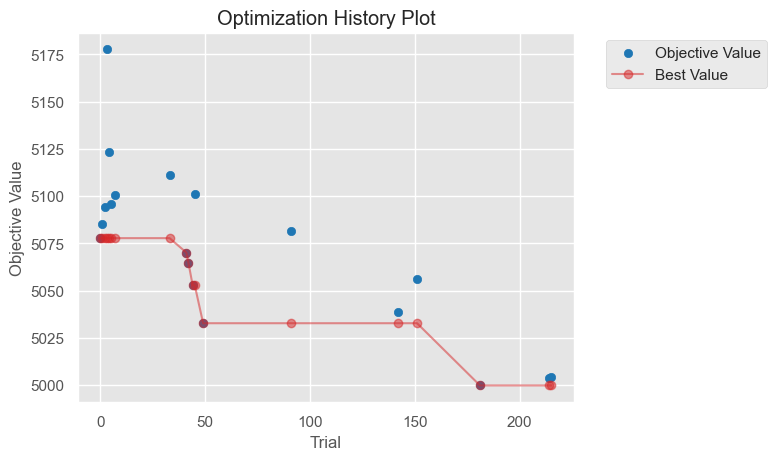

In [59]:
# Visualize Optuna optimization history
plot_optimization_history(study2);

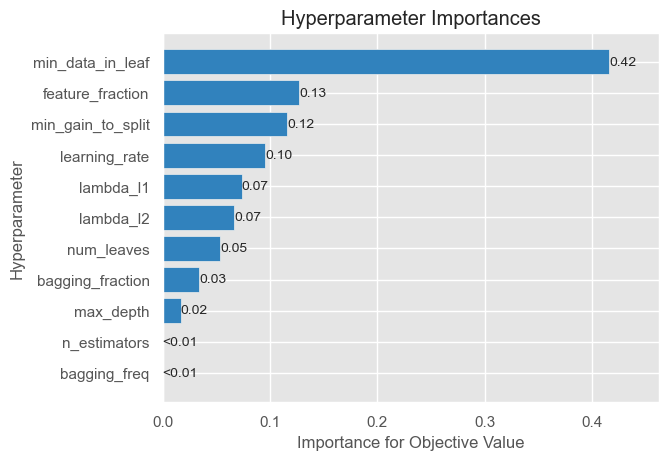

In [61]:
plot_param_importances(study2);

#### Full Data Set

In [75]:
train_full = pd.read_csv('train_full_wo_outliers.csv')
test_full = pd.read_csv('test_full.csv')
train_full['timestamp'] = pd.to_datetime(train_full['timestamp'])
test_full['timestamp'] = pd.to_datetime(test_full['timestamp'])

In [76]:
# Some variables to variate feature engineering
test = "ok" # Apply feature engineering to test set
logscale = True # Apply log scale

# Some variables for features engineering
holidays = ["2016-01-01", "2016-01-18", "2016-02-15", "2016-05-30", "2016-07-04",
            "2016-09-05", "2016-10-10", "2016-11-11", "2016-11-24", "2016-12-26",
            "2017-01-01", "2017-01-16", "2017-02-20", "2017-05-29", "2017-07-04",
            "2017-09-04", "2017-10-09", "2017-11-10", "2017-11-23", "2017-12-25",
            "2018-01-01", "2018-01-15", "2018-02-19", "2018-05-28", "2018-07-04",
            "2018-09-03", "2018-10-08", "2018-11-12", "2018-11-22", "2018-12-25",
            "2019-01-01"]

features_label = ['building_id', 'site_id', 'primary_use',
       'square_feet', 'year_built', 'floor_count', 'air_temperature',
       'cloud_coverage', 'dew_temperature', 'precip_depth_1_hr',
       'sea_level_pressure', 'wind_direction', 'wind_speed', 'meters', 'month', 'weekday',
       'hour', 'day', 'is_holiday']

numerical_features = ['square_feet',
       'year_built', 'floor_count', 'air_temperature',
       'dew_temperature', 'precip_depth_1_hr', 'sea_level_pressure',
       'wind_direction', 'wind_speed']

categorical_features = ["building_id", "site_id", "meters", "primary_use", "hour", "weekday", "month", "cloud_coverage", "is_holiday"]

# Sort Data by Timestamp
train_full.sort_values('timestamp', inplace=True)
train_full.reset_index(drop=True, inplace=True)


# Label Encode Primary Use
le = LabelEncoder()
train_full['primary_use'] = le.fit_transform(train_full['primary_use'])

if test is not None:
    test_full['primary_use'] = le.transform(test_full['primary_use'])


# Extract information from timestamp
train_full['month'] = train_full['timestamp'].dt.month
train_full['weekday'] = train_full['timestamp'].dt.weekday
train_full['hour'] = train_full['timestamp'].dt.hour
train_full['day'] = train_full['timestamp'].dt.day

if test is not None:
    test_full['month'] = test_full['timestamp'].dt.month
    test_full['weekday'] = test_full['timestamp'].dt.weekday
    test_full['hour'] = test_full['timestamp'].dt.hour
    test_full['day'] = test_full['timestamp'].dt.day

    
# Add holidays feature
train_full["is_holiday"] = (train_full['timestamp'].dt.date.astype("str").isin(holidays)).astype(int)

if test is not None:
    test_full["is_holiday"] = (test_full['timestamp'].dt.date.astype("str").isin(holidays)).astype(int) 
    

# Split train data for the scaling (in particular for minmaxscale)
if logscale:
    train_full['square_feet'] = np.log1p(train_full['square_feet'])
    train_full['meter_reading'] = np.log1p(train_full['meter_reading'])
    data_half_1 = train_full[:int(train_full.shape[0]/2)]
    data_half_2 = train_full[int(train_full.shape[0]/2):]
    if test is not None:
        test_full['square_feet'] = np.log1p(test_full['square_feet'])
        test_full['meter_reading'] = np.log1p(test_full['meter_reading'])

else:
    data_half_1 = train_full[:int(train_full.shape[0]/2)]
    data_half_2 = train_full[int(train_full.shape[0]/2):]
    scaler = MinMaxScaler()
    data_half_1[numerical_features] = scaler.fit_transform(data_half_1[numerical_features])
    data_half_2[numerical_features] = scaler.transform(data_half_2[numerical_features])
    y_scaler = MinMaxScaler()
    data_half_1['meter_reading'] = y_scaler.fit_transform(data_half_1[['meter_reading']])
    data_half_2['meter_reading'] = y_scaler.transform(data_half_2[['meter_reading']])
    if test is not None:
        test_full[numerical_features] = scaler.transform(test_full[numerical_features])


# Split into two halves for validation
X_half_1 = data_half_1[features_label]
X_half_2 = data_half_2[features_label]
y_half_1 = data_half_1[['meter_reading']]
y_half_2 = data_half_2[['meter_reading']]
if test is not None:
    X_test = test_full[features_label]

In [70]:
study2_full = optuna.create_study(direction="minimize", study_name="LGBM Regressor log scaled Full Data")
func = lambda trial: objective(trial, X_half_1, X_half_2, y_half_1, y_half_2, scale=False)
study2_full.optimize(func, n_trials=40)

[I 2023-02-06 16:29:21,692] A new study created in memory with name: LGBM Regressor log scaled Full Data


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.249270 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2023-02-06 16:33:46,560] Trial 0 finished with value: 5336.8670229688905 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07604261468383013, 'num_leaves': 2940, 'max_depth': 8, 'min_data_in_leaf': 1000, 'lambda_l1': 85, 'lambda_l2': 95, 'min_gain_to_split': 13.983803304399284, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 0 with value: 5336.8670229688905.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.222401 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2023-02-06 16:37:11,139] Trial 1 finished with value: 5355.872407517488 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09917363045944615, 'num_leaves': 960, 'max_depth': 10, 'min_data_in_leaf': 7900, 'lambda_l1': 80, 'lambda_l2': 60, 'min_gain_to_split': 6.597402426726871, 'bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 0 with value: 5336.8670229688905.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.166209 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[200]	training's rmse: 1.

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[800]	training's rmse: 0.949245	valid_1's rmse: 1.54008
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1000]	training's rmse: 0.943846	valid_1's rmse: 1.53734
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2023-02-06 16:45:11,327] Trial 2 finished with value: 5361.88831204292 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11023961529230315, 'num_leaves': 1920, 'max_depth': 4, 'min_data_in_leaf': 7600, 'lambda_l1': 40, 'lambda_l2': 25, 'min_gain_to_split': 10.887008760897853, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 0 with value: 5336.8670229688905.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.166936 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no 

[I 2023-02-06 16:46:51,080] Trial 3 finished with value: 5389.648138067879 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29390922608876086, 'num_leaves': 2760, 'max_depth': 12, 'min_data_in_leaf': 6600, 'lambda_l1': 75, 'lambda_l2': 40, 'min_gain_to_split': 12.684719272230023, 'bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 0 with value: 5336.8670229688905.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.172140 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits wit

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training beca

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [W

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[I 2023-02-06 16:53:13,252] Trial 4 finished with value: 5371.948709317189 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2889745062979421, 'num_leaves': 920, 'max_depth': 5, 'min_data_in_leaf': 7500, 'lambda_l1': 90, 'lambda_l2': 70, 'min_gain_to_split': 13.63571471638673, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 0 with value: 5336.8670229688905.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.161095 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669


[I 2023-02-06 16:53:21,417] Trial 5 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.166920 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[21]	training's rmse: 1.04696	valid_1's rmse: 1.53024


[I 2023-02-06 16:55:32,141] Trial 6 finished with value: 5402.659923111462 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19479812451658907, 'num_leaves': 1160, 'max_depth': 9, 'min_data_in_leaf': 7800, 'lambda_l1': 60, 'lambda_l2': 60, 'min_gain_to_split': 5.573412668912253, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6}. Best is trial 0 with value: 5336.8670229688905.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.315955 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:55:40,436] Trial 7 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.332340 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-06 16:56:40,949] Trial 8 pruned. Trial was pruned at iteration 90.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.171979 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:56:50,338] Trial 9 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.311787 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669


[I 2023-02-06 16:56:58,075] Trial 10 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.221629 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:57:06,704] Trial 11 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.309088 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-06 16:58:01,814] Trial 12 pruned. Trial was pruned at iteration 66.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.302871 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:58:09,065] Trial 13 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.345651 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:58:16,007] Trial 14 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.225637 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 16:58:24,054] Trial 15 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.343199 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[I 2023-02-06 17:01:41,406] Trial 16 finished with value: 5328.144288488632 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12451776825251899, 'num_leaves': 2320, 'max_depth': 8, 'min_data_in_leaf': 2300, 'lambda_l1': 85, 'lambda_l2': 85, 'min_gain_to_split': 10.214143454504537, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 16 with value: 5328.144288488632.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.292065 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 17:01:48,546] Trial 17 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.364481 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2023-02-06 17:04:32,766] Trial 18 finished with value: 5321.269839903208 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12481645361450361, 'num_leaves': 2380, 'max_depth': 8, 'min_data_in_leaf': 3500, 'lambda_l1': 85, 'lambda_l2': 90, 'min_gain_to_split': 14.848314485018758, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 18 with value: 5321.269839903208.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.292205 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-06 17:04:44,977] Trial 19 pruned. Trial was pruned at iteration 11.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.334366 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-06 17:05:02,733] Trial 20 pruned. Trial was pruned at iteration 18.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.288589 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 17:05:10,135] Trial 21 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.316355 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-06 17:05:21,807] Trial 22 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.226088 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 17:05:30,213] Trial 23 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.221907 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669


[I 2023-02-06 17:05:38,729] Trial 24 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.231642 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 17:05:46,151] Trial 25 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.303265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 17:05:54,269] Trial 26 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.363844 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669


[I 2023-02-06 17:06:02,438] Trial 27 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.234931 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
Training until validation scores don't improve for 200 rounds


[I 2023-02-06 17:06:11,502] Trial 28 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.178002 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 17:06:18,590] Trial 29 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.322074 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 17:06:24,468] Trial 30 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.275138 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 17:06:35,321] Trial 31 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.229009 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2023-02-06 17:08:54,942] Trial 32 finished with value: 5382.249675897602 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11898783435444557, 'num_leaves': 840, 'max_depth': 12, 'min_data_in_leaf': 6200, 'lambda_l1': 95, 'lambda_l2': 30, 'min_gain_to_split': 12.069374767074546, 'bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 18 with value: 5321.269839903208.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.187912 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 17:09:01,203] Trial 33 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.328807 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 17:09:07,198] Trial 34 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.255705 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 17:09:14,474] Trial 35 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.239114 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 17:09:22,307] Trial 36 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.234196 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 17:09:30,010] Trial 37 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.324636 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[200]	training's rmse: 0.769035	valid_1's rmse: 1.55248
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

[I 2023-02-06 17:11:57,541] Trial 38 finished with value: 5334.608731564275 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15201018932209934, 'num_leaves': 2060, 'max_depth': 12, 'min_data_in_leaf': 7100, 'lambda_l1': 70, 'lambda_l2': 75, 'min_gain_to_split': 13.94811159711379, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 18 with value: 5321.269839903208.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.360115 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[I 2023-02-06 17:14:17,228] Trial 39 finished with value: 5380.066646360668 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14649297050586219, 'num_leaves': 2100, 'max_depth': 12, 'min_data_in_leaf': 6000, 'lambda_l1': 55, 'lambda_l2': 90, 'min_gain_to_split': 14.076128432794196, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 18 with value: 5321.269839903208.


In [93]:
study2_full.optimize(func, n_trials=100)

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.351711 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:15:32,719] Trial 393 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.312164 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:15:43,035] Trial 394 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.334842 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:15:50,934] Trial 395 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.284501 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:15:59,367] Trial 396 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.228984 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:16:09,020] Trial 397 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.330408 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:16:16,622] Trial 398 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.293665 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:16:29,222] Trial 399 pruned. Trial was pruned at iteration 5.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.248691 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:16:38,117] Trial 400 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.297322 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 10:16:51,758] Trial 401 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.298883 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:17:00,037] Trial 402 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.229300 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:17:15,637] Trial 403 pruned. Trial was pruned at iteration 6.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.262769 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[200]	training's rmse: 0.812175	valid_1's rmse: 1.52308
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, be

[I 2023-02-07 10:19:53,517] Trial 404 finished with value: 5346.543342051364 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2935655043283089, 'num_leaves': 2160, 'max_depth': 11, 'min_data_in_leaf': 4300, 'lambda_l1': 85, 'lambda_l2': 80, 'min_gain_to_split': 13.946644875145175, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 328 with value: 5312.577833814066.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.322206 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:20:00,452] Trial 405 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.284269 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 10:20:15,094] Trial 406 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.230358 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 10:20:41,010] Trial 407 pruned. Trial was pruned at iteration 20.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.318117 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 10:20:58,270] Trial 408 pruned. Trial was pruned at iteration 11.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.252277 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 10:21:14,541] Trial 409 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.340660 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:21:27,937] Trial 410 pruned. Trial was pruned at iteration 6.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.291477 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 10:21:52,652] Trial 411 pruned. Trial was pruned at iteration 20.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.274698 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 10:22:13,169] Trial 412 pruned. Trial was pruned at iteration 12.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.252535 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:22:24,303] Trial 413 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.252195 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 10:22:49,558] Trial 414 pruned. Trial was pruned at iteration 20.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.228258 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:22:58,036] Trial 415 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.340257 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:23:04,951] Trial 416 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.312705 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 10:23:17,373] Trial 417 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.225956 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:23:26,369] Trial 418 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.317788 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 10:23:40,143] Trial 419 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.302799 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:23:48,823] Trial 420 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.225151 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:23:57,939] Trial 421 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.268678 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:24:05,359] Trial 422 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.302132 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:24:13,625] Trial 423 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.273464 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 10:24:30,862] Trial 424 pruned. Trial was pruned at iteration 11.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.283198 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:24:38,337] Trial 425 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.243136 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2023-02-07 10:27:00,524] Trial 426 finished with value: 5362.559573437244 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25720193759975896, 'num_leaves': 2900, 'max_depth': 11, 'min_data_in_leaf': 4300, 'lambda_l1': 5, 'lambda_l2': 80, 'min_gain_to_split': 10.586906448743886, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 328 with value: 5312.577833814066.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.310745 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:27:07,686] Trial 427 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.323073 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:27:15,453] Trial 428 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.242994 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:27:24,458] Trial 429 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.355007 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:27:31,859] Trial 430 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.251613 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:27:45,929] Trial 431 pruned. Trial was pruned at iteration 6.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.251537 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:27:59,779] Trial 432 pruned. Trial was pruned at iteration 5.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.299339 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:28:09,887] Trial 433 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.326465 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:28:23,620] Trial 434 pruned. Trial was pruned at iteration 6.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.319081 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:28:36,271] Trial 435 pruned. Trial was pruned at iteration 6.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.370973 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 10:28:51,651] Trial 436 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.365430 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:28:59,347] Trial 437 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.260322 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:29:08,022] Trial 438 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.237746 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:29:17,171] Trial 439 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.308596 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 10:29:30,676] Trial 440 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.276244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:29:39,047] Trial 441 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.357401 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:29:47,150] Trial 442 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.357036 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 10:30:02,111] Trial 443 pruned. Trial was pruned at iteration 8.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.240204 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 10:30:18,048] Trial 444 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.293363 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:30:25,549] Trial 445 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.248382 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:30:33,583] Trial 446 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.238294 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:30:42,249] Trial 447 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.303689 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:30:48,997] Trial 448 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.309396 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:30:56,905] Trial 449 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.221763 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:31:05,647] Trial 450 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.329857 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 10:31:22,170] Trial 451 pruned. Trial was pruned at iteration 11.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.233763 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:31:30,501] Trial 452 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.245622 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:31:37,015] Trial 453 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.242004 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:31:49,209] Trial 454 pruned. Trial was pruned at iteration 6.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.264501 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 10:32:03,913] Trial 455 pruned. Trial was pruned at iteration 11.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.222990 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:32:16,325] Trial 456 pruned. Trial was pruned at iteration 5.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.280191 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 10:32:30,585] Trial 457 pruned. Trial was pruned at iteration 10.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.227497 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:32:43,303] Trial 458 pruned. Trial was pruned at iteration 6.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.224525 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:32:52,000] Trial 459 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.220091 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:32:58,507] Trial 460 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.232259 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:33:06,550] Trial 461 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.231972 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:33:14,929] Trial 462 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.271070 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:33:24,961] Trial 463 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.297952 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 10:41:34,319] Trial 464 pruned. Trial was pruned at iteration 8.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.267940 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:41:41,678] Trial 465 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.294082 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 10:50:04,756] Trial 466 pruned. Trial was pruned at iteration 8.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.279527 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 10:54:22,918] Trial 467 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.288610 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 11:06:57,213] Trial 468 pruned. Trial was pruned at iteration 23.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.223621 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 11:15:18,226] Trial 469 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.226987 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 11:19:38,146] Trial 470 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.262366 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[200]	training's rmse: 0.810343	valid_1's rmse: 1.51462
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

[I 2023-02-07 11:30:13,906] Trial 471 finished with value: 5337.216550482024 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29454260496369167, 'num_leaves': 2660, 'max_depth': 11, 'min_data_in_leaf': 4100, 'lambda_l1': 80, 'lambda_l2': 90, 'min_gain_to_split': 14.718043758472978, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 328 with value: 5312.577833814066.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.308632 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 11:30:39,548] Trial 472 pruned. Trial was pruned at iteration 22.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.226074 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 11:30:50,847] Trial 473 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.227626 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 11:31:04,936] Trial 474 pruned. Trial was pruned at iteration 6.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.237776 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 11:31:21,404] Trial 475 pruned. Trial was pruned at iteration 6.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.358237 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 11:31:33,241] Trial 476 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.272361 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 11:31:49,157] Trial 477 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.237994 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 11:32:00,346] Trial 478 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.371786 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 11:32:16,162] Trial 479 pruned. Trial was pruned at iteration 6.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.353407 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 11:32:28,494] Trial 480 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.345365 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 11:32:37,019] Trial 481 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.242700 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 11:32:45,693] Trial 482 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.293404 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 11:33:07,222] Trial 483 pruned. Trial was pruned at iteration 20.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.240152 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 11:33:16,096] Trial 484 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.363113 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 11:33:30,769] Trial 485 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.223204 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 11:33:40,044] Trial 486 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.330340 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 11:33:48,420] Trial 487 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.233507 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669


[I 2023-02-07 11:33:57,067] Trial 488 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.241926 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 11:34:10,590] Trial 489 pruned. Trial was pruned at iteration 6.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.222974 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 11:34:23,422] Trial 490 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.236497 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 11:34:31,953] Trial 491 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.239617 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669


[I 2023-02-07 11:34:38,817] Trial 492 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


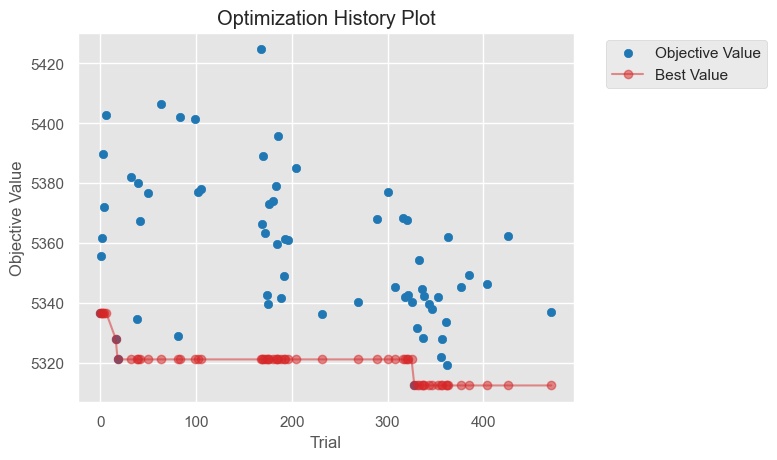

In [94]:
# Visualize Optuna optimization history
plot_optimization_history(study2_full);

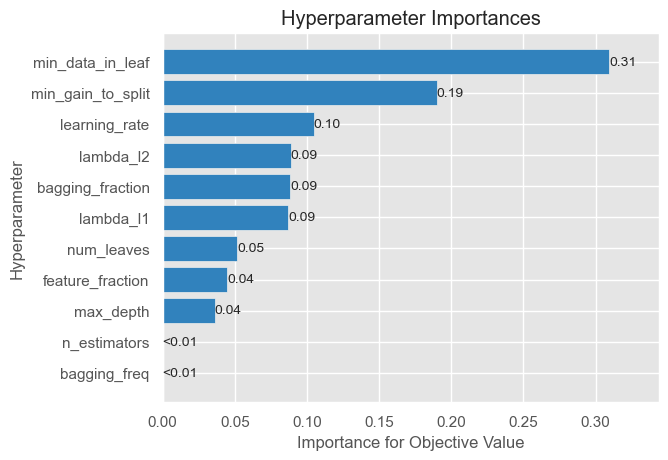

In [95]:
plot_param_importances(study2_full);

In [96]:
study2_full.best_trial.params

{'n_estimators': 10000,
 'learning_rate': 0.279724966139103,
 'num_leaves': 2900,
 'max_depth': 11,
 'min_data_in_leaf': 3900,
 'lambda_l1': 75,
 'lambda_l2': 85,
 'min_gain_to_split': 14.558245257660948,
 'bagging_fraction': 0.8,
 'bagging_freq': 1,
 'feature_fraction': 0.7}

In [97]:
# Train model using best parameters found by Optuna 
params = {
    "objective": "regression",
    "boosting": "gbdt",
    "metric": "rmse",
    'n_estimators': 10000,
    'learning_rate': 0.279724966139103,
    'num_leaves': 2900,
    'max_depth': 11,
    'min_data_in_leaf': 3900,
    'lambda_l1': 75,
    'lambda_l2': 85,
    'min_gain_to_split': 14.558245257660948,
    'bagging_fraction': 0.8,
    'bagging_freq': 1,
    'feature_fraction': 0.7}

train_lgb = lgb.Dataset(X_half_1, label=y_half_1, categorical_feature=categorical_features, free_raw_data=False)
validation_lgb = lgb.Dataset(X_half_2, label=y_half_2, categorical_feature=categorical_features, free_raw_data=False)

watchlist = [train_lgb, validation_lgb]
lgb_model = lgb.train(params, train_set=train_lgb, num_boost_round=1000, valid_sets=watchlist, verbose_eval=200, early_stopping_rounds=200)

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.325070 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 4.028669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

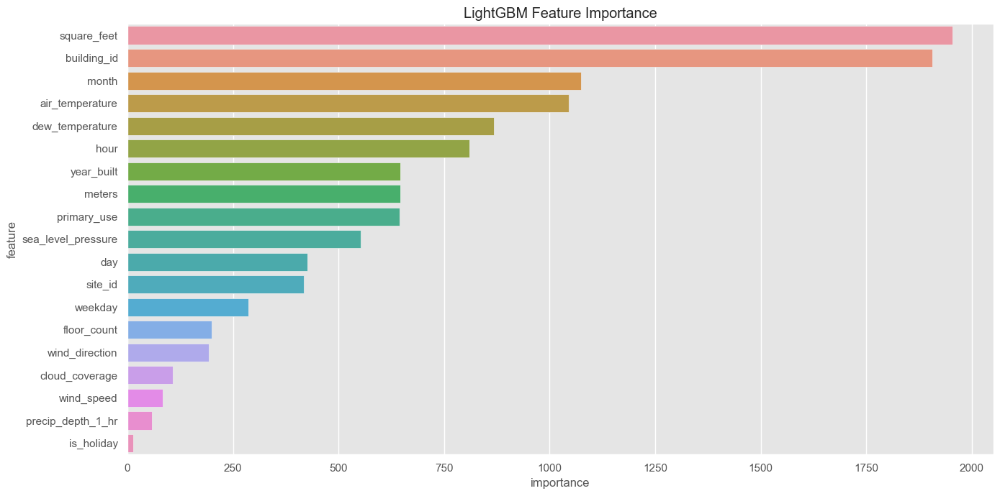

In [98]:
# We plot the feature importance of the trained model
df_fimp = pd.DataFrame()
df_fimp["feature"] = train_lgb.feature_name
df_fimp["importance"] = lgb_model.feature_importance()

plt.figure(figsize=(14, 7))
sns.barplot(x="importance", y="feature", data=df_fimp.sort_values(by="importance", ascending=False))
plt.title("LightGBM Feature Importance")
plt.tight_layout()

In [99]:
# We make predictions on the test set
y_pred = lgb_model.predict(X_test)
y_pred = y_pred.reshape(len(y_pred),1)
y_pred = np.expm1(y_pred)
row_ids = X_test.reset_index()['index'].values

In [102]:
# We submit the results
submission = pd.DataFrame({"row_id": row_ids, "meter_reading": np.clip(np.clip(y_pred, 0, a_max=None).reshape(len(y_pred)), 0, a_max=None)})
submission.to_csv("submission_log_07_02_2022.csv", index=False)

Score on Kaggle: **1.549**

## LightGBM with Outliers

As we have seen in the EDA, the test set consists of the following two years historic of the same building as train set. Hence **it makes sense to keep all the data** even if there are some outliers.

In [126]:
train_full = pd.read_csv('train_full_w_outliers.csv')
test_full = pd.read_csv('test_full.csv')
train_full['timestamp'] = pd.to_datetime(train_full['timestamp'])
test_full['timestamp'] = pd.to_datetime(test_full['timestamp'])

### Full Data Set

#### Feature Engineering

In [127]:
# Some variables to variate feature engineering
test = "ok" # Apply feature engineering to test set
logscale = False # Apply log scale

# Some variables for features engineering
holidays = ["2016-01-01", "2016-01-18", "2016-02-15", "2016-05-30", "2016-07-04",
            "2016-09-05", "2016-10-10", "2016-11-11", "2016-11-24", "2016-12-26",
            "2017-01-01", "2017-01-16", "2017-02-20", "2017-05-29", "2017-07-04",
            "2017-09-04", "2017-10-09", "2017-11-10", "2017-11-23", "2017-12-25",
            "2018-01-01", "2018-01-15", "2018-02-19", "2018-05-28", "2018-07-04",
            "2018-09-03", "2018-10-08", "2018-11-12", "2018-11-22", "2018-12-25",
            "2019-01-01"]

features_label = ['building_id', 'site_id', 'primary_use',
       'square_feet', 'year_built', 'floor_count', 'air_temperature',
       'cloud_coverage', 'dew_temperature', 'precip_depth_1_hr',
       'sea_level_pressure', 'wind_direction', 'wind_speed', 'meters', 'month', 'weekday',
       'hour', 'day', 'is_holiday']

numerical_features = ['square_feet',
       'year_built', 'floor_count', 'air_temperature',
       'dew_temperature', 'precip_depth_1_hr', 'sea_level_pressure',
       'wind_direction', 'wind_speed']

categorical_features = ["building_id", "site_id", "meters", "primary_use", "hour", "weekday", "month", "cloud_coverage", "is_holiday"]


# Sort Data by Timestamp
train_full.sort_values('timestamp', inplace=True)
train_full.reset_index(drop=True, inplace=True)


# Label Encode Primary Use
le = LabelEncoder()
train_full['primary_use'] = le.fit_transform(train_full['primary_use'])

if test is not None:
    test_full['primary_use'] = le.transform(test_full['primary_use'])

    
# Extract information from timestamp
train_full['month'] = train_full['timestamp'].dt.month
train_full['weekday'] = train_full['timestamp'].dt.weekday
train_full['hour'] = train_full['timestamp'].dt.hour
train_full['day'] = train_full['timestamp'].dt.day

if test is not None:
    test_full['month'] = test_full['timestamp'].dt.month
    test_full['weekday'] = test_full['timestamp'].dt.weekday
    test_full['hour'] = test_full['timestamp'].dt.hour
    test_full['day'] = test_full['timestamp'].dt.day

# Add holidays Feature
train_full["is_holiday"] = (train_full['timestamp'].dt.date.astype("str").isin(holidays)).astype(int)

if test is not None:
    test_full["is_holiday"] = (test_full['timestamp'].dt.date.astype("str").isin(holidays)).astype(int) 
    

# Split train data for the scaling (in particular for minmaxscale)
if logscale:
    train_full['square_feet'] = np.log1p(train_full['square_feet'])
    train_full['meter_reading'] = np.log1p(train_full['meter_reading'])
    data_half_1 = train_full[:int(train_full.shape[0]/2)]
    data_half_2 = train_full[int(train_full.shape[0]/2):]
    if test is not None:
        test_full['square_feet'] = np.log1p(test_full['square_feet'])
        test_full['meter_reading'] = np.log1p(test_full['meter_reading'])

else:
    data_half_1 = train_full[:int(train_full.shape[0]/2)]
    data_half_2 = train_full[int(train_full.shape[0]/2):]
    scaler = MinMaxScaler()
    data_half_1[numerical_features] = scaler.fit_transform(data_half_1[numerical_features])
    data_half_2[numerical_features] = scaler.transform(data_half_2[numerical_features])
    y_scaler = MinMaxScaler()
    data_half_1['meter_reading'] = y_scaler.fit_transform(data_half_1[['meter_reading']])
    data_half_2['meter_reading'] = y_scaler.transform(data_half_2[['meter_reading']])
    if test is not None:
        test_full[numerical_features] = scaler.transform(test_full[numerical_features])


# Split into two halves for validation
X_half_1 = data_half_1[features_label]
X_half_2 = data_half_2[features_label]
y_half_1 = data_half_1[['meter_reading']]
y_half_2 = data_half_2[['meter_reading']]
if test is not None:
    X_test = test_full[features_label]

##### Optimization with Optuna

In [128]:
study_full = optuna.create_study(direction="minimize", study_name="LGBM Regressor Full Data with outliers")
func = lambda trial: objective(trial, X_half_1, X_half_2, y_half_1, y_half_2)
study_full.optimize(func, n_trials=40)

[I 2023-02-07 18:28:43,467] A new study created in memory with name: LGBM Regressor Full Data with outliers


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.257192 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[200]	training's rmse: 0.00855511	valid_1's rmse: 0.00395037
[LightGBM] [Warning] No further splits with 

[I 2023-02-07 18:29:23,388] Trial 0 finished with value: 35319.548817260795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15720667211863287, 'num_leaves': 960, 'max_depth': 10, 'min_data_in_leaf': 9700, 'lambda_l1': 15, 'lambda_l2': 35, 'min_gain_to_split': 5.464090190089028, 'bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.6}. Best is trial 0 with value: 35319.548817260795.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.162047 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-07 18:30:00,764] Trial 1 finished with value: 35360.43352636173 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05303837359528667, 'num_leaves': 2500, 'max_depth': 5, 'min_data_in_leaf': 7300, 'lambda_l1': 45, 'lambda_l2': 70, 'min_gain_to_split': 9.900139483371616, 'bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.6}. Best is trial 0 with value: 35319.548817260795.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.308181 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-07 18:30:42,520] Trial 2 finished with value: 35319.548817260795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19702107162222948, 'num_leaves': 1020, 'max_depth': 6, 'min_data_in_leaf': 1000, 'lambda_l1': 100, 'lambda_l2': 35, 'min_gain_to_split': 9.7827911115499, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 0 with value: 35319.548817260795.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.175846 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[200]	training's rmse: 0.00850613	valid_1's rmse: 0.00380807
[LightGBM] [Warning] No further splits with 

[I 2023-02-07 18:31:30,709] Trial 3 finished with value: 35319.548817260795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0723661790282052, 'num_leaves': 1660, 'max_depth': 6, 'min_data_in_leaf': 3700, 'lambda_l1': 35, 'lambda_l2': 30, 'min_gain_to_split': 10.767000782645828, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6}. Best is trial 0 with value: 35319.548817260795.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.156669 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-07 18:32:09,887] Trial 4 finished with value: 35319.548817260795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1382424050422642, 'num_leaves': 420, 'max_depth': 8, 'min_data_in_leaf': 10000, 'lambda_l1': 65, 'lambda_l2': 75, 'min_gain_to_split': 14.597200198633182, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 0 with value: 35319.548817260795.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.224883 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-07 18:32:49,465] Trial 5 finished with value: 35223.13376208532 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02038867387007506, 'num_leaves': 160, 'max_depth': 3, 'min_data_in_leaf': 5900, 'lambda_l1': 20, 'lambda_l2': 15, 'min_gain_to_split': 10.401049705136485, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 5 with value: 35223.13376208532.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.159055 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[200]	training's rmse: 0.00865963	valid_1's rmse: 0.00334689
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Early stopping, best iteration is:
[1]	training's rmse: 0.00976287	valid_1's rmse: 0.00163552


[I 2023-02-07 18:33:38,302] Trial 6 finished with value: 35319.548817260795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0996025472699247, 'num_leaves': 2220, 'max_depth': 9, 'min_data_in_leaf': 9300, 'lambda_l1': 10, 'lambda_l2': 40, 'min_gain_to_split': 9.691995041963382, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 5 with value: 35223.13376208532.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.209626 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19


[I 2023-02-07 18:33:45,840] Trial 7 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.232652 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-07 18:34:20,916] Trial 8 finished with value: 35319.548817260795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2711598218124787, 'num_leaves': 200, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 30, 'lambda_l2': 75, 'min_gain_to_split': 7.943729369772009, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 5 with value: 35223.13376208532.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.218694 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-07 18:34:57,431] Trial 9 finished with value: 35607.45403472581 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1005923486444832, 'num_leaves': 2300, 'max_depth': 4, 'min_data_in_leaf': 7100, 'lambda_l1': 30, 'lambda_l2': 55, 'min_gain_to_split': 0.24351814848022846, 'bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 5 with value: 35223.13376208532.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.342444 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-07 18:35:35,334] Trial 10 finished with value: 35221.87115414432 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020998991288982333, 'num_leaves': 760, 'max_depth': 12, 'min_data_in_leaf': 5800, 'lambda_l1': 0, 'lambda_l2': 0, 'min_gain_to_split': 13.953018365727768, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 10 with value: 35221.87115414432.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.242407 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[I 2023-02-07 18:36:15,587] Trial 11 finished with value: 35323.399839386126 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01033112358844016, 'num_leaves': 20, 'max_depth': 12, 'min_data_in_leaf': 5800, 'lambda_l1': 5, 'lambda_l2': 0, 'min_gain_to_split': 14.798130356925483, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 10 with value: 35221.87115414432.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.338093 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No furthe

[I 2023-02-07 18:36:56,646] Trial 12 finished with value: 35223.67024439093 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014770301890829816, 'num_leaves': 740, 'max_depth': 3, 'min_data_in_leaf': 4700, 'lambda_l1': 0, 'lambda_l2': 0, 'min_gain_to_split': 12.498500855844282, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 10 with value: 35221.87115414432.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.238306 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-07 18:37:33,715] Trial 13 finished with value: 35260.23422820335 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042951956068580696, 'num_leaves': 640, 'max_depth': 11, 'min_data_in_leaf': 6400, 'lambda_l1': 60, 'lambda_l2': 15, 'min_gain_to_split': 12.867018655329762, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 10 with value: 35221.87115414432.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.222403 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-07 18:38:11,326] Trial 14 finished with value: 35239.87729827061 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03716007807251953, 'num_leaves': 1180, 'max_depth': 3, 'min_data_in_leaf': 2600, 'lambda_l1': 20, 'lambda_l2': 95, 'min_gain_to_split': 12.416961881943893, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 10 with value: 35221.87115414432.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.292648 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[I 2023-02-07 18:38:57,976] Trial 15 finished with value: 35305.000109962646 and parameters: {'n_estimators': 10000, 'learning_rate': 0.012313259515905145, 'num_leaves': 460, 'max_depth': 12, 'min_data_in_leaf': 8100, 'lambda_l1': 0, 'lambda_l2': 15, 'min_gain_to_split': 6.1804730365874905, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 10 with value: 35221.87115414432.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.225591 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[200]	training's rmse: 0.00849481	valid_1's rmse: 0.00387316
[LightGBM] [Warning] No further splits with 

[I 2023-02-07 18:39:32,462] Trial 16 finished with value: 35319.548817260795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06911238553727482, 'num_leaves': 2920, 'max_depth': 9, 'min_data_in_leaf': 5100, 'lambda_l1': 20, 'lambda_l2': 15, 'min_gain_to_split': 11.631090388599976, 'bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 10 with value: 35221.87115414432.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.167832 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-07 18:40:09,633] Trial 17 finished with value: 35319.548817260795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09696786393329702, 'num_leaves': 1280, 'max_depth': 10, 'min_data_in_leaf': 8300, 'lambda_l1': 50, 'lambda_l2': 10, 'min_gain_to_split': 14.98837921127604, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6}. Best is trial 10 with value: 35221.87115414432.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.223128 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No furthe

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-07 18:40:45,005] Trial 18 finished with value: 35249.631464712555 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041467752610351294, 'num_leaves': 40, 'max_depth': 4, 'min_data_in_leaf': 2700, 'lambda_l1': 80, 'lambda_l2': 20, 'min_gain_to_split': 13.013186016707387, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 10 with value: 35221.87115414432.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.244018 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[200]	training's rmse: 0.00864513	valid_1's rmse: 0.00332284
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Early stopping, best iteration is:
[1]	training's rmse: 0.00976287	valid_1's rmse: 0.00163552


[I 2023-02-07 18:41:21,189] Trial 19 finished with value: 35319.548817260795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07841060445030719, 'num_leaves': 400, 'max_depth': 8, 'min_data_in_leaf': 5900, 'lambda_l1': 40, 'lambda_l2': 55, 'min_gain_to_split': 11.21610654170346, 'bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 10 with value: 35221.87115414432.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.160651 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-07 18:42:00,920] Trial 20 finished with value: 35414.22376308567 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031267161058195186, 'num_leaves': 740, 'max_depth': 11, 'min_data_in_leaf': 4700, 'lambda_l1': 25, 'lambda_l2': 25, 'min_gain_to_split': 13.512383885008767, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6}. Best is trial 10 with value: 35221.87115414432.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.247777 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[I 2023-02-07 18:42:43,427] Trial 21 finished with value: 35220.33997878377 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011421152650177, 'num_leaves': 800, 'max_depth': 3, 'min_data_in_leaf': 4800, 'lambda_l1': 0, 'lambda_l2': 0, 'min_gain_to_split': 11.913869003336298, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 21 with value: 35220.33997878377.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.234903 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[I 2023-02-07 18:43:24,491] Trial 22 finished with value: 35220.777471250345 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011171477579276445, 'num_leaves': 1840, 'max_depth': 4, 'min_data_in_leaf': 3800, 'lambda_l1': 10, 'lambda_l2': 0, 'min_gain_to_split': 11.635101068785252, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 21 with value: 35220.33997878377.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.227875 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[200]	training's rmse: 0.00849362	valid_1's rmse: 0.00388039
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Early stopping, best iteration is:
[1]	train

[I 2023-02-07 18:43:59,664] Trial 23 finished with value: 35319.548817260795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05412829200350368, 'num_leaves': 1860, 'max_depth': 4, 'min_data_in_leaf': 3400, 'lambda_l1': 10, 'lambda_l2': 0, 'min_gain_to_split': 13.68302842896077, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 21 with value: 35220.33997878377.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.230603 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[I 2023-02-07 18:44:40,943] Trial 24 finished with value: 35220.88151220499 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011044035313211936, 'num_leaves': 1920, 'max_depth': 5, 'min_data_in_leaf': 2100, 'lambda_l1': 0, 'lambda_l2': 5, 'min_gain_to_split': 12.042760648963014, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 21 with value: 35220.33997878377.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.219373 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[200]	training's rmse: 0.00848493	valid_1's rmse: 0.00393338
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Early stopping, best iteration is:
[1]	training's rmse: 0.00976287	valid_1's rmse: 0.00163552


[I 2023-02-07 18:45:15,992] Trial 25 finished with value: 35319.548817260795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05590048526031907, 'num_leaves': 1940, 'max_depth': 5, 'min_data_in_leaf': 1700, 'lambda_l1': 10, 'lambda_l2': 5, 'min_gain_to_split': 11.659905419307442, 'bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 21 with value: 35220.33997878377.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.163570 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-07 18:45:54,495] Trial 26 finished with value: 35533.525106445035 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03548842102595075, 'num_leaves': 1400, 'max_depth': 5, 'min_data_in_leaf': 2200, 'lambda_l1': 0, 'lambda_l2': 25, 'min_gain_to_split': 11.884631118962243, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6}. Best is trial 21 with value: 35220.33997878377.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.235603 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No furthe

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-07 18:46:30,478] Trial 27 finished with value: 35229.525115377124 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032627261013675975, 'num_leaves': 1880, 'max_depth': 4, 'min_data_in_leaf': 1600, 'lambda_l1': 10, 'lambda_l2': 10, 'min_gain_to_split': 11.153361058825325, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 21 with value: 35220.33997878377.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.328752 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Early stopping, best iteration is:
[3]	training's rmse: 0.00969977	valid_1's rmse: 0.00163056


[I 2023-02-07 18:47:11,304] Trial 28 finished with value: 35219.51573169226 and parameters: {'n_estimators': 10000, 'learning_rate': 0.012895438674174317, 'num_leaves': 2820, 'max_depth': 3, 'min_data_in_leaf': 4100, 'lambda_l1': 15, 'lambda_l2': 5, 'min_gain_to_split': 8.887133385184308, 'bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 28 with value: 35219.51573169226.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.233655 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[200]	training's rmse: 0.0084706	valid_1's rmse: 0.00403102
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Early stopping, best iteration is:
[1]	training's rmse: 0.00961959	valid_1's rmse: 0.00161649


[I 2023-02-07 18:48:01,205] Trial 29 finished with value: 35408.776133967156 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05964446775556217, 'num_leaves': 2920, 'max_depth': 3, 'min_data_in_leaf': 4400, 'lambda_l1': 15, 'lambda_l2': 25, 'min_gain_to_split': 8.435684458893812, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 28 with value: 35219.51573169226.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.248029 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-07 18:48:34,689] Trial 30 finished with value: 35319.548817260795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08557101458914967, 'num_leaves': 2680, 'max_depth': 3, 'min_data_in_leaf': 4100, 'lambda_l1': 55, 'lambda_l2': 10, 'min_gain_to_split': 9.207053796917194, 'bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 28 with value: 35219.51573169226.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.223977 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[I 2023-02-07 18:49:15,026] Trial 31 finished with value: 35220.56401099075 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011394058569797841, 'num_leaves': 2180, 'max_depth': 4, 'min_data_in_leaf': 3100, 'lambda_l1': 15, 'lambda_l2': 5, 'min_gain_to_split': 10.82296110304527, 'bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 28 with value: 35219.51573169226.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.164218 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[200]	training's rmse: 0.00848014	valid_1's rmse: 0.00396373
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Early stopping, best iteration is:
[3]	training's rmse: 0.0096412	valid_1's rmse: 0.00163441


[I 2023-02-07 18:49:53,122] Trial 32 finished with value: 35975.320529342986 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04970318153835828, 'num_leaves': 2200, 'max_depth': 4, 'min_data_in_leaf': 3300, 'lambda_l1': 15, 'lambda_l2': 5, 'min_gain_to_split': 10.182217680608714, 'bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.6}. Best is trial 28 with value: 35219.51573169226.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.244788 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-07 18:50:48,444] Trial 33 finished with value: 35230.51397897066 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03201019804481129, 'num_leaves': 2700, 'max_depth': 5, 'min_data_in_leaf': 5200, 'lambda_l1': 25, 'lambda_l2': 20, 'min_gain_to_split': 10.571329921255959, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 28 with value: 35219.51573169226.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.301914 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Early stopping, best iteration is:
[1]	training's rmse: 0.00976287	valid_1's rmse: 0.00163552


[I 2023-02-07 18:51:25,258] Trial 34 finished with value: 35319.548817260795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06565661306459666, 'num_leaves': 2380, 'max_depth': 4, 'min_data_in_leaf': 3000, 'lambda_l1': 40, 'lambda_l2': 35, 'min_gain_to_split': 7.055783768640039, 'bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 28 with value: 35219.51573169226.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.167785 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No furthe

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-07 18:52:15,707] Trial 35 finished with value: 35334.78377069819 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02680763449218935, 'num_leaves': 2620, 'max_depth': 6, 'min_data_in_leaf': 3800, 'lambda_l1': 5, 'lambda_l2': 5, 'min_gain_to_split': 9.28081347876454, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6}. Best is trial 28 with value: 35219.51573169226.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.216739 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training beca

[I 2023-02-07 18:52:57,328] Trial 36 finished with value: 35321.71344387049 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01070691313700665, 'num_leaves': 1000, 'max_depth': 3, 'min_data_in_leaf': 5100, 'lambda_l1': 30, 'lambda_l2': 10, 'min_gain_to_split': 10.787001463744936, 'bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 28 with value: 35219.51573169226.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.242019 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-07 18:54:00,051] Trial 37 finished with value: 35319.548817260795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12268326938673038, 'num_leaves': 1680, 'max_depth': 7, 'min_data_in_leaf': 4200, 'lambda_l1': 20, 'lambda_l2': 30, 'min_gain_to_split': 10.121358301218674, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 28 with value: 35219.51573169226.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.250615 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No furthe

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Early stopping, best iteration is:
[3]	training's rmse: 0.00964312	valid_1's rmse: 0.00163412


[I 2023-02-07 18:54:38,553] Trial 38 finished with value: 35944.3701784778 and parameters: {'n_estimators': 10000, 'learning_rate': 0.049170201304984715, 'num_leaves': 2040, 'max_depth': 3, 'min_data_in_leaf': 1300, 'lambda_l1': 5, 'lambda_l2': 95, 'min_gain_to_split': 9.00214956094634, 'bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 28 with value: 35219.51573169226.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.225061 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19


[I 2023-02-07 18:54:46,087] Trial 39 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


In [161]:
study_full.optimize(func, n_trials=50)

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.375984 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:21:52,902] Trial 100 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.496991 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:22:32,225] Trial 101 finished with value: 5258.254897344025 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2805250267895582, 'num_leaves': 220, 'max_depth': 8, 'min_data_in_leaf': 3700, 'lambda_l1': 30, 'lambda_l2': 55, 'min_gain_to_split': 0.2544274557986315, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 97 with value: 5246.2240016413625.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.278004 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:22:39,625] Trial 102 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.386618 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:22:47,053] Trial 103 pruned. Trial was pruned at iteration 6.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.385668 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:22:53,765] Trial 104 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.473340 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-06 14:23:04,125] Trial 105 pruned. Trial was pruned at iteration 8.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.350858 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-06 14:23:14,333] Trial 106 pruned. Trial was pruned at iteration 10.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.421913 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[100]	training's rmse: 0.00580269	valid_1's rmse: 0.0304628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:23:52,499] Trial 107 finished with value: 5258.216822508852 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2862326037741367, 'num_leaves': 460, 'max_depth': 9, 'min_data_in_leaf': 4500, 'lambda_l1': 30, 'lambda_l2': 60, 'min_gain_to_split': 0.2622886302316031, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 97 with value: 5246.2240016413625.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.422007 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[60]	training's rmse: 0.00587173	valid_1's rmse: 0.0304703
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:24:32,299] Trial 108 finished with value: 5259.513982642364 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28956397076970053, 'num_leaves': 20, 'max_depth': 7, 'min_data_in_leaf': 4500, 'lambda_l1': 35, 'lambda_l2': 75, 'min_gain_to_split': 0.27910666123872446, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 97 with value: 5246.2240016413625.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.405861 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[60]	training's rmse: 0.00574997	valid_1's rmse: 0.0304697
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:25:08,888] Trial 109 pruned. Trial was pruned at iteration 223.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.332750 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[160]	training's rmse: 0.00519055	valid_1's rmse: 0.0304221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:25:59,368] Trial 110 finished with value: 5251.18336658197 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28095332559369846, 'num_leaves': 60, 'max_depth': 7, 'min_data_in_leaf': 4300, 'lambda_l1': 30, 'lambda_l2': 75, 'min_gain_to_split': 0.0072917914801262085, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 97 with value: 5246.2240016413625.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.358065 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[100]	training's rmse: 0.0057523	valid_1's rmse: 0.0304584
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:26:34,713] Trial 111 pruned. Trial was pruned at iteration 223.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.464775 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[100]	training's rmse: 0.00598525	valid_1's rmse: 0.030478
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:27:11,108] Trial 112 finished with value: 5260.830684197734 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2896181842642309, 'num_leaves': 120, 'max_depth': 7, 'min_data_in_leaf': 3800, 'lambda_l1': 35, 'lambda_l2': 75, 'min_gain_to_split': 0.5818963987365613, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 97 with value: 5246.2240016413625.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.446575 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[160]	training's rmse: 0.00537565	valid_1's rmse: 0.0304384
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:28:07,900] Trial 113 finished with value: 5254.003995231465 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2838506284655185, 'num_leaves': 20, 'max_depth': 6, 'min_data_in_leaf': 4600, 'lambda_l1': 30, 'lambda_l2': 85, 'min_gain_to_split': 0.03256214322471862, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 97 with value: 5246.2240016413625.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.279768 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:28:14,366] Trial 114 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.357191 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:28:21,113] Trial 115 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.359816 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-06 14:28:31,136] Trial 116 pruned. Trial was pruned at iteration 11.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.400271 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:28:38,512] Trial 117 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.467724 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:28:45,421] Trial 118 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.435842 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:28:53,156] Trial 119 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.299215 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:29:01,641] Trial 120 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.368855 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[100]	training's rmse: 0.00586128	valid_1's rmse: 0.0304648
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:29:39,338] Trial 121 finished with value: 5258.552569897497 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2889555827078051, 'num_leaves': 340, 'max_depth': 8, 'min_data_in_leaf': 4200, 'lambda_l1': 25, 'lambda_l2': 60, 'min_gain_to_split': 0.3697985607285479, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 97 with value: 5246.2240016413625.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.321444 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:29:47,804] Trial 122 pruned. Trial was pruned at iteration 6.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.434703 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:30:25,082] Trial 123 pruned. Trial was pruned at iteration 223.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.328723 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[60]	training's rmse: 0.00551122	valid_1's rmse: 0.0304519
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[200]	training's rmse: 0.00551099	valid_1's rmse: 0.0304515
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:31:16,466] Trial 124 pruned. Trial was pruned at iteration 324.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.316316 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:31:23,915] Trial 125 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.330634 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:31:32,730] Trial 126 pruned. Trial was pruned at iteration 6.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.315674 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:31:40,400] Trial 127 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.271062 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:31:50,879] Trial 128 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.406755 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:32:01,299] Trial 129 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.255665 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19


[I 2023-02-06 14:32:07,507] Trial 130 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.316928 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[100]	training's rmse: 0.00575273	valid_1's rmse: 0.0304611
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:32:43,360] Trial 131 pruned. Trial was pruned at iteration 223.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.318990 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:32:49,820] Trial 132 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.297444 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:32:56,800] Trial 133 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.394868 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:33:03,577] Trial 134 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.373904 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[100]	training's rmse: 0.00590471	valid_1's rmse: 0.0304652
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:33:41,096] Trial 135 finished with value: 5258.626314415846 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2885510395915777, 'num_leaves': 100, 'max_depth': 9, 'min_data_in_leaf': 4700, 'lambda_l1': 30, 'lambda_l2': 60, 'min_gain_to_split': 0.350519762440497, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 97 with value: 5246.2240016413625.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.282818 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:33:49,571] Trial 136 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.417453 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[100]	training's rmse: 0.00575173	valid_1's rmse: 0.0304796
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:34:24,004] Trial 137 pruned. Trial was pruned at iteration 215.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.369053 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[I 2023-02-06 14:34:33,862] Trial 138 pruned. Trial was pruned at iteration 5.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.445867 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:34:41,635] Trial 139 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.419468 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439


[I 2023-02-06 14:34:49,668] Trial 140 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.319301 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:35:28,180] Trial 141 pruned. Trial was pruned at iteration 223.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.459230 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:35:36,869] Trial 142 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.319196 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:35:43,770] Trial 143 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.394323 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[160]	training's rmse: 0.00528931	valid_1's rmse: 0.0304264
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2023-02-06 14:36:29,180] Trial 144 finished with value: 5251.0591276444775 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2931195300362527, 'num_leaves': 280, 'max_depth': 9, 'min_data_in_leaf': 4700, 'lambda_l1': 30, 'lambda_l2': 25, 'min_gain_to_split': 0.006159104786927938, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 97 with value: 5246.2240016413625.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.363206 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:36:34,845] Trial 145 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.422717 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:36:41,098] Trial 146 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.259900 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19


[I 2023-02-06 14:36:48,062] Trial 147 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.322892 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:36:55,585] Trial 148 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.510259 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2793
[LightGBM] [Info] Number of data points in the train set: 10103658, number of used features: 19
[LightGBM] [Info] Start training from score 0.002439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-06 14:37:01,781] Trial 149 pruned. Trial was pruned at iteration 0.


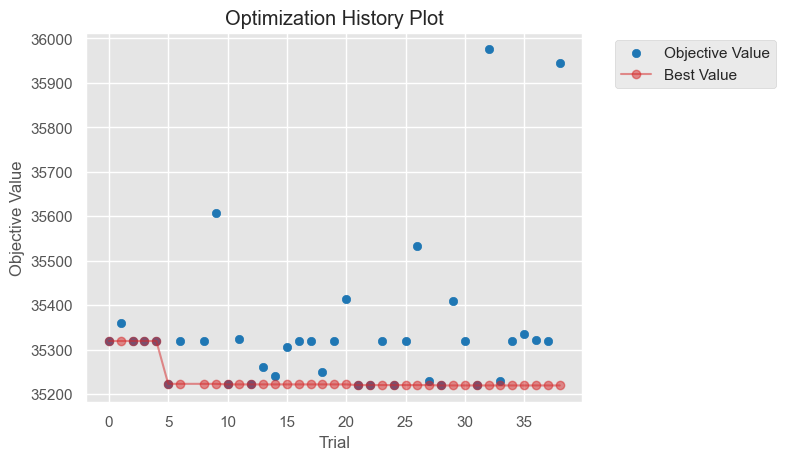

In [129]:
plot_optimization_history(study_full);

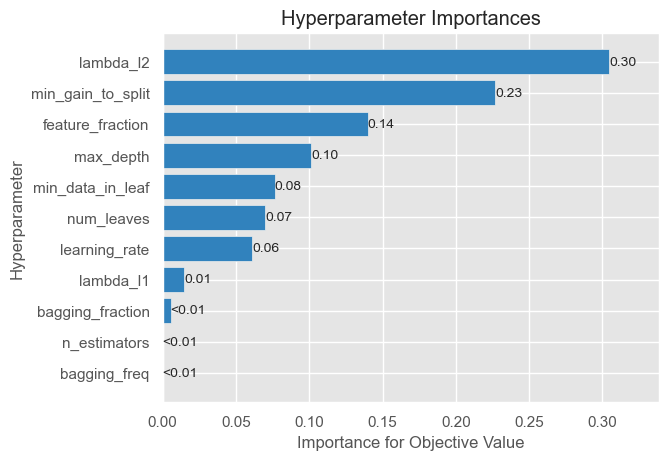

In [130]:
plot_param_importances(study_full);

In [132]:
study_full.best_trial.params

{'n_estimators': 10000,
 'learning_rate': 0.012895438674174317,
 'num_leaves': 2820,
 'max_depth': 3,
 'min_data_in_leaf': 4100,
 'lambda_l1': 15,
 'lambda_l2': 5,
 'min_gain_to_split': 8.887133385184308,
 'bagging_fraction': 0.6,
 'bagging_freq': 1,
 'feature_fraction': 0.8}

##### Prediction with Optimized Model

In [133]:
params = {
    "objective": "regression",
    "boosting": "gbdt",
    "metric": "rmse",
    'n_estimators': 10000,
    'learning_rate': 0.012895438674174317,
    'num_leaves': 2820,
    'max_depth': 3,
    'min_data_in_leaf': 4100,
    'lambda_l1': 15,
    'lambda_l2': 5,
    'min_gain_to_split': 8.887133385184308,
    'bagging_fraction': 0.6,
    'bagging_freq': 1,
    'feature_fraction': 0.8}

train_lgb = lgb.Dataset(X_half_1, label=y_half_1, categorical_feature=categorical_features, free_raw_data=False)
validation_lgb = lgb.Dataset(X_half_2, label=y_half_2, categorical_feature=categorical_features, free_raw_data=False)

watchlist = [train_lgb, validation_lgb]
lgb_model = lgb.train(params, train_set=train_lgb, num_boost_round=1000, valid_sets=watchlist, verbose_eval=200, early_stopping_rounds=200)

y_pred = lgb_model.predict(X_test, num_iteration=lgb_model.best_iteration)
y_pred = y_pred.reshape(len(y_pred),1)
y_pred = y_scaler.inverse_transform(y_pred)

row_ids = X_test.reset_index()['index'].values

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.331405 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2788
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 0.000167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

In [33]:
y_pred.head()

NameError: name 'y_pred' is not defined

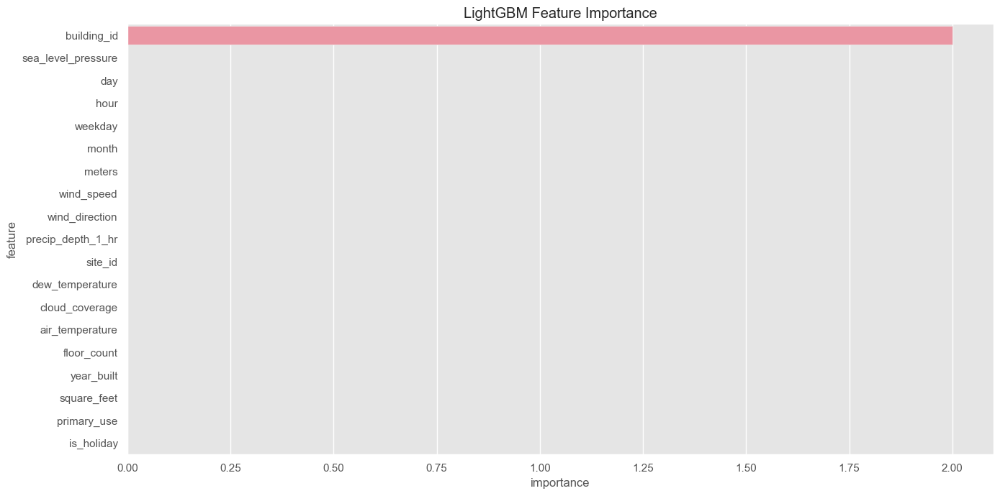

In [134]:
df_fimp = pd.DataFrame()
df_fimp["feature"] = train_lgb.feature_name
df_fimp["importance"] = lgb_model.feature_importance()

plt.figure(figsize=(14, 7))
sns.barplot(x="importance", y="feature", data=df_fimp.sort_values(by="importance", ascending=False))
plt.title("LightGBM Feature Importance")
plt.tight_layout()

**CONCLUSION**

**With outliers and min max scale**, our **model does not seem able to learn and provide constant outputs**. 

This may be due to the fact that having such a big difference between meter reading for building 1099 and the other is too important and **most of scaled data are too close to 0**.

What we can do to avoid this issue is to **use another scaling process => log scaling**

### LightGBM: Feature Engineering with Label Encoding and Log Scaling

In [136]:
train_full = pd.read_csv('train_full_w_outliers.csv')
test_full = pd.read_csv('test_full.csv')
train_full['timestamp'] = pd.to_datetime(train_full['timestamp'])
test_full['timestamp'] = pd.to_datetime(test_full['timestamp'])

In [137]:
# Some variables to variate feature engineering
test = "ok" # Apply feature engineering to test set
logscale = True # Apply log scale

# Some variables for features engineering
holidays = ["2016-01-01", "2016-01-18", "2016-02-15", "2016-05-30", "2016-07-04",
            "2016-09-05", "2016-10-10", "2016-11-11", "2016-11-24", "2016-12-26",
            "2017-01-01", "2017-01-16", "2017-02-20", "2017-05-29", "2017-07-04",
            "2017-09-04", "2017-10-09", "2017-11-10", "2017-11-23", "2017-12-25",
            "2018-01-01", "2018-01-15", "2018-02-19", "2018-05-28", "2018-07-04",
            "2018-09-03", "2018-10-08", "2018-11-12", "2018-11-22", "2018-12-25",
            "2019-01-01"]

features_label = ['building_id', 'site_id', 'primary_use',
       'square_feet', 'year_built', 'floor_count', 'air_temperature',
       'cloud_coverage', 'dew_temperature', 'precip_depth_1_hr',
       'sea_level_pressure', 'wind_direction', 'wind_speed', 'meters', 'month', 'weekday',
       'hour', 'day', 'is_holiday']

numerical_features = ['square_feet',
       'year_built', 'floor_count', 'air_temperature',
       'dew_temperature', 'precip_depth_1_hr', 'sea_level_pressure',
       'wind_direction', 'wind_speed']

categorical_features = ["building_id", "site_id", "meters", "primary_use", "hour", "weekday", "month", "cloud_coverage", "is_holiday"]

# Sort Data by Timestamp
train_full.sort_values('timestamp', inplace=True)
train_full.reset_index(drop=True, inplace=True)


# Label Encode Primary Use
le = LabelEncoder()
train_full['primary_use'] = le.fit_transform(train_full['primary_use'])

if test is not None:
    test_full['primary_use'] = le.transform(test_full['primary_use'])


# Extract information from timestamp
train_full['month'] = train_full['timestamp'].dt.month
train_full['weekday'] = train_full['timestamp'].dt.weekday
train_full['hour'] = train_full['timestamp'].dt.hour
train_full['day'] = train_full['timestamp'].dt.day

if test is not None:
    test_full['month'] = test_full['timestamp'].dt.month
    test_full['weekday'] = test_full['timestamp'].dt.weekday
    test_full['hour'] = test_full['timestamp'].dt.hour
    test_full['day'] = test_full['timestamp'].dt.day

    
# Add holidays feature
train_full["is_holiday"] = (train_full['timestamp'].dt.date.astype("str").isin(holidays)).astype(int)

if test is not None:
    test_full["is_holiday"] = (test_full['timestamp'].dt.date.astype("str").isin(holidays)).astype(int) 
    

# Split train data for the scaling (in particular for minmaxscale)
if logscale:
    train_full['square_feet'] = np.log1p(train_full['square_feet'])
    train_full['meter_reading'] = np.log1p(train_full['meter_reading'])
    data_half_1 = train_full[:int(train_full.shape[0]/2)]
    data_half_2 = train_full[int(train_full.shape[0]/2):]
    if test is not None:
        test_full['square_feet'] = np.log1p(test_full['square_feet'])
        test_full['meter_reading'] = np.log1p(test_full['meter_reading'])

else:
    data_half_1 = train_full[:int(train_full.shape[0]/2)]
    data_half_2 = train_full[int(train_full.shape[0]/2):]
    scaler = MinMaxScaler()
    data_half_1[numerical_features] = scaler.fit_transform(data_half_1[numerical_features])
    data_half_2[numerical_features] = scaler.transform(data_half_2[numerical_features])
    y_scaler = MinMaxScaler()
    data_half_1['meter_reading'] = y_scaler.fit_transform(data_half_1[['meter_reading']])
    data_half_2['meter_reading'] = y_scaler.transform(data_half_2[['meter_reading']])
    if test is not None:
        test_full[numerical_features] = scaler.transform(test_full[numerical_features])


# Split into two halves for validation
X_half_1 = data_half_1[features_label]
X_half_2 = data_half_2[features_label]
y_half_1 = data_half_1[['meter_reading']]
y_half_2 = data_half_2[['meter_reading']]
if test is not None:
    X_test = test_full[features_label]

In [145]:
study2_full = optuna.create_study(direction="minimize", study_name="LGBM Regressor log scaled Full Data")
func = lambda trial: objective(trial, X_half_1, X_half_2, y_half_1, y_half_2, scale=False)
study2_full.optimize(func, n_trials=40)

[I 2023-02-07 19:46:11,971] A new study created in memory with name: LGBM Regressor log scaled Full Data


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.230584 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2023-02-07 19:54:15,958] Trial 0 finished with value: 35018.73386872122 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1015086812296585, 'num_leaves': 1360, 'max_depth': 8, 'min_data_in_leaf': 3200, 'lambda_l1': 65, 'lambda_l2': 25, 'min_gain_to_split': 0.41319264214299545, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 0 with value: 35018.73386872122.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.370367 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2023-02-07 19:58:07,978] Trial 1 finished with value: 35644.02711453664 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13235045554077596, 'num_leaves': 900, 'max_depth': 5, 'min_data_in_leaf': 3700, 'lambda_l1': 40, 'lambda_l2': 10, 'min_gain_to_split': 12.27713362392812, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 0 with value: 35018.73386872122.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.299410 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
Training until validation scores don't improve for 200 rounds
[200]	training's rmse: 0.871111	valid_1's rmse: 1.54716
Early stopping, best iteration is:
[142]	training's rmse: 0.939645	valid_1's rmse: 1.53346


[I 2023-02-07 20:00:30,574] Trial 2 finished with value: 35250.95938325552 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2128900427787287, 'num_leaves': 20, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 25, 'lambda_l2': 75, 'min_gain_to_split': 0.02073957564470874, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 0 with value: 35018.73386872122.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.157625 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[200]	training's rmse: 0.80391	valid_1's rmse: 1.51699
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no mor

[I 2023-02-07 20:06:23,726] Trial 3 finished with value: 34940.88565281582 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22120596890372665, 'num_leaves': 2700, 'max_depth': 12, 'min_data_in_leaf': 3600, 'lambda_l1': 35, 'lambda_l2': 70, 'min_gain_to_split': 13.740729702625902, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6}. Best is trial 3 with value: 34940.88565281582.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.242361 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2023-02-07 22:13:43,126] Trial 4 finished with value: 36619.18166401269 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14180909517550686, 'num_leaves': 1900, 'max_depth': 11, 'min_data_in_leaf': 3300, 'lambda_l1': 25, 'lambda_l2': 15, 'min_gain_to_split': 12.757506940145728, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 3 with value: 34940.88565281582.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.648060 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 22:14:06,845] Trial 5 pruned. Trial was pruned at iteration 19.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.235602 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
Training until validation scores don't improve for 200 rounds


[I 2023-02-07 22:14:26,711] Trial 6 pruned. Trial was pruned at iteration 19.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.213426 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[48]	training's rmse: 0.864024	valid_1's rmse: 1.51065


[I 2023-02-07 22:17:17,589] Trial 7 finished with value: 35814.593182286604 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2412399128744318, 'num_leaves': 80, 'max_depth': 12, 'min_data_in_leaf': 8500, 'lambda_l1': 10, 'lambda_l2': 80, 'min_gain_to_split': 6.230496509096665, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 3 with value: 34940.88565281582.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.319458 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
Training until validation scores don't improve for 200 rounds


[I 2023-02-07 22:17:26,531] Trial 8 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.222904 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 22:17:34,910] Trial 9 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.166905 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:17:42,885] Trial 10 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.175378 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:17:51,755] Trial 11 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.158265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:18:01,186] Trial 12 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.195567 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:18:10,731] Trial 13 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.179109 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:18:20,435] Trial 14 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.254948 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 22:18:27,288] Trial 15 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.231390 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:18:34,396] Trial 16 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.286834 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 22:19:11,696] Trial 17 pruned. Trial was pruned at iteration 41.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.173727 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:19:18,288] Trial 18 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.256165 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:19:24,420] Trial 19 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.201276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:19:32,054] Trial 20 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.240301 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
Training until validation scores don't improve for 200 rounds


[I 2023-02-07 22:21:14,015] Trial 21 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.303849 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
Training until validation scores don't improve for 200 rounds


[I 2023-02-07 22:21:27,468] Trial 22 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.361406 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:21:37,034] Trial 23 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.359044 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 22:21:53,710] Trial 24 pruned. Trial was pruned at iteration 16.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.290697 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 22:22:06,327] Trial 25 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.368022 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 22:22:59,070] Trial 26 pruned. Trial was pruned at iteration 41.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.266450 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:23:09,004] Trial 27 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.347428 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2023-02-07 22:27:04,710] Trial 28 finished with value: 37951.436097138445 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26099043298592284, 'num_leaves': 1640, 'max_depth': 11, 'min_data_in_leaf': 6800, 'lambda_l1': 60, 'lambda_l2': 50, 'min_gain_to_split': 1.6197301905797188, 'bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 3 with value: 34940.88565281582.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.331726 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 22:27:12,282] Trial 29 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.357429 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 22:27:53,653] Trial 30 pruned. Trial was pruned at iteration 47.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.345003 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 22:28:02,427] Trial 31 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.342154 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:28:09,379] Trial 32 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.397680 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:28:16,778] Trial 33 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.482662 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 22:28:25,792] Trial 34 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.438038 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 22:28:57,719] Trial 35 pruned. Trial was pruned at iteration 19.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.448288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
Training until validation scores don't improve for 200 rounds


[I 2023-02-07 22:29:10,936] Trial 36 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.362945 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 22:29:18,606] Trial 37 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.453282 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 22:29:45,388] Trial 38 pruned. Trial was pruned at iteration 27.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.354150 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 22:29:55,003] Trial 39 pruned. Trial was pruned at iteration 0.


In [147]:
study2_full.optimize(func, n_trials=200)

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.288120 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:38:23,889] Trial 40 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.333976 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 22:39:00,179] Trial 41 pruned. Trial was pruned at iteration 47.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.324423 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 22:39:27,342] Trial 42 pruned. Trial was pruned at iteration 31.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.305487 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 22:40:06,525] Trial 43 pruned. Trial was pruned at iteration 47.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.193479 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[17]	training's rmse: 1.0691	valid_1's rmse: 1.4502


[I 2023-02-07 22:42:30,941] Trial 44 finished with value: 35031.074911612915 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28127424181085325, 'num_leaves': 400, 'max_depth': 10, 'min_data_in_leaf': 9900, 'lambda_l1': 25, 'lambda_l2': 75, 'min_gain_to_split': 4.040431144775056, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6}. Best is trial 3 with value: 34940.88565281582.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.253580 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[16]	training's rmse: 1.01619	valid_1's rmse: 1.50643


[I 2023-02-07 22:44:56,024] Trial 45 finished with value: 34918.280511442616 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2763138252184725, 'num_leaves': 620, 'max_depth': 10, 'min_data_in_leaf': 4000, 'lambda_l1': 35, 'lambda_l2': 70, 'min_gain_to_split': 4.147157097212114, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6}. Best is trial 45 with value: 34918.280511442616.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.216327 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:45:03,413] Trial 46 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.192224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:45:10,189] Trial 47 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.241803 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:45:18,847] Trial 48 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.215483 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:45:28,827] Trial 49 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.409639 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:45:38,639] Trial 50 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.284449 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:45:50,180] Trial 51 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.195826 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:45:57,743] Trial 52 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.247934 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:46:04,010] Trial 53 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.418151 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:46:15,248] Trial 54 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.271752 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:46:25,070] Trial 55 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.356357 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 22:46:32,748] Trial 56 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.362702 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 22:46:47,749] Trial 57 pruned. Trial was pruned at iteration 9.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.285550 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 22:46:55,554] Trial 58 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.290360 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:47:07,752] Trial 59 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.266348 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:47:17,149] Trial 60 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.236968 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
Training until validation scores don't improve for 200 rounds


[I 2023-02-07 22:47:26,739] Trial 61 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.336855 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:47:36,834] Trial 62 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.364179 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
Training until validation scores don't improve for 200 rounds


[I 2023-02-07 22:47:50,340] Trial 63 pruned. Trial was pruned at iteration 9.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.221774 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:48:01,034] Trial 64 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.309906 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:48:07,104] Trial 65 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.419462 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 22:48:23,021] Trial 66 pruned. Trial was pruned at iteration 12.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.335760 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:48:30,819] Trial 67 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.328451 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:48:43,582] Trial 68 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.194087 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:48:49,997] Trial 69 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.264257 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 22:48:56,613] Trial 70 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.327532 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:49:04,244] Trial 71 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.294949 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:49:12,706] Trial 72 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.280602 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:49:19,550] Trial 73 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.297923 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:49:25,940] Trial 74 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.329736 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:49:34,215] Trial 75 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.293755 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:49:41,637] Trial 76 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.262171 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 22:49:48,690] Trial 77 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.220475 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 22:49:54,393] Trial 78 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.260133 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:50:00,716] Trial 79 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.307911 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 22:50:13,848] Trial 80 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.300817 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:50:26,134] Trial 81 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.239489 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:50:36,582] Trial 82 pruned. Trial was pruned at iteration 5.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.231292 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:50:43,046] Trial 83 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.378860 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:50:50,554] Trial 84 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.308127 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:50:59,098] Trial 85 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.285321 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 22:51:12,720] Trial 86 pruned. Trial was pruned at iteration 9.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.242967 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:51:22,575] Trial 87 pruned. Trial was pruned at iteration 5.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.326946 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:51:30,925] Trial 88 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.189988 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:51:39,814] Trial 89 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.296947 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
Training until validation scores don't improve for 200 rounds


[I 2023-02-07 22:51:48,900] Trial 90 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.326286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 22:51:54,941] Trial 91 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.350187 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:52:02,211] Trial 92 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.315487 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:52:15,659] Trial 93 pruned. Trial was pruned at iteration 9.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.286138 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
Training until validation scores don't improve for 200 rounds


[I 2023-02-07 22:52:29,463] Trial 94 pruned. Trial was pruned at iteration 9.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.334933 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
Training until validation scores don't improve for 200 rounds


[I 2023-02-07 22:52:36,231] Trial 95 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.345171 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:52:42,428] Trial 96 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.200659 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:52:50,741] Trial 97 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.314805 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 22:53:08,477] Trial 98 pruned. Trial was pruned at iteration 12.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.260466 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 22:53:20,270] Trial 99 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.190717 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:53:26,745] Trial 100 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.309298 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:53:38,330] Trial 101 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.318214 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:53:48,320] Trial 102 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.264699 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:53:58,556] Trial 103 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.345591 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:54:06,070] Trial 104 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.199242 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:54:14,026] Trial 105 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.252169 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
Training until validation scores don't improve for 200 rounds


[I 2023-02-07 22:54:24,635] Trial 106 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.266744 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:54:38,199] Trial 107 pruned. Trial was pruned at iteration 9.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.237315 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:54:44,102] Trial 108 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.315906 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:54:54,747] Trial 109 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.207359 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:55:03,382] Trial 110 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.284867 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:55:09,336] Trial 111 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.338834 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:55:15,671] Trial 112 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.310505 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:55:22,654] Trial 113 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.301187 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:55:30,276] Trial 114 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.290166 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 22:55:38,524] Trial 115 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.239222 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:55:44,496] Trial 116 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.323450 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:55:50,811] Trial 117 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.271926 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:55:59,374] Trial 118 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.297937 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:56:07,558] Trial 119 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.192410 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 22:56:13,584] Trial 120 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.338653 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:56:19,330] Trial 121 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.355803 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:56:25,326] Trial 122 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.290560 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:56:32,409] Trial 123 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.278811 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:56:40,980] Trial 124 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.253451 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:56:47,081] Trial 125 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.358693 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:56:53,990] Trial 126 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.219969 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
Training until validation scores don't improve for 200 rounds


[I 2023-02-07 22:57:02,348] Trial 127 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.206672 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 22:57:10,228] Trial 128 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.266419 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 22:57:21,665] Trial 129 pruned. Trial was pruned at iteration 7.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.336547 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2023-02-07 22:59:58,342] Trial 130 finished with value: 35545.20613393849 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26485625437500004, 'num_leaves': 2980, 'max_depth': 12, 'min_data_in_leaf': 10000, 'lambda_l1': 25, 'lambda_l2': 80, 'min_gain_to_split': 8.070877255681282, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 45 with value: 34918.280511442616.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.319641 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 23:00:12,204] Trial 131 pruned. Trial was pruned at iteration 9.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.331394 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:00:22,454] Trial 132 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.301816 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:00:33,260] Trial 133 pruned. Trial was pruned at iteration 5.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.310168 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[21]	training's rmse: 0.953624	valid_1's rmse: 1.51107


[I 2023-02-07 23:03:47,141] Trial 134 finished with value: 35939.94179858659 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28470382343557593, 'num_leaves': 680, 'max_depth': 12, 'min_data_in_leaf': 8900, 'lambda_l1': 20, 'lambda_l2': 90, 'min_gain_to_split': 6.50756986291599, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 45 with value: 34918.280511442616.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.368373 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:04:00,056] Trial 135 pruned. Trial was pruned at iteration 5.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.281100 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[17]	training's rmse: 1.01777	valid_

[I 2023-02-07 23:06:30,855] Trial 136 finished with value: 35026.19268199074 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27811250206552973, 'num_leaves': 460, 'max_depth': 12, 'min_data_in_leaf': 9300, 'lambda_l1': 20, 'lambda_l2': 90, 'min_gain_to_split': 7.763661582030697, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6}. Best is trial 45 with value: 34918.280511442616.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.291298 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:06:41,463] Trial 137 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.242555 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:06:53,314] Trial 138 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.260704 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:07:06,347] Trial 139 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.281994 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:07:16,410] Trial 140 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.272159 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[I 2023-02-07 23:09:44,210] Trial 141 finished with value: 35006.78303175314 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29165049898616546, 'num_leaves': 3000, 'max_depth': 12, 'min_data_in_leaf': 8500, 'lambda_l1': 25, 'lambda_l2': 90, 'min_gain_to_split': 6.83852596666633, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6}. Best is trial 45 with value: 34918.280511442616.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.291851 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:09:55,115] Trial 142 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.276895 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:10:05,769] Trial 143 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.272615 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:10:15,329] Trial 144 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.257020 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:10:26,021] Trial 145 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.331496 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iter

[I 2023-02-07 23:13:04,435] Trial 146 finished with value: 35262.948797200515 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2977156997009978, 'num_leaves': 3000, 'max_depth': 11, 'min_data_in_leaf': 8400, 'lambda_l1': 25, 'lambda_l2': 85, 'min_gain_to_split': 8.52973829445665, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 45 with value: 34918.280511442616.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.352800 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:13:15,214] Trial 147 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.342367 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 23:13:22,645] Trial 148 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.344518 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:13:31,140] Trial 149 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.340866 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:13:44,663] Trial 150 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.315943 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2023-02-07 23:16:22,327] Trial 151 finished with value: 36049.04293029724 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29827817846256155, 'num_leaves': 180, 'max_depth': 12, 'min_data_in_leaf': 7300, 'lambda_l1': 20, 'lambda_l2': 95, 'min_gain_to_split': 7.08611443546055, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6}. Best is trial 45 with value: 34918.280511442616.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.278219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 23:16:28,890] Trial 152 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.284561 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:16:39,118] Trial 153 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.253641 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:16:49,407] Trial 154 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.237517 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
Training until validation scores don't improve for 200 rounds


[I 2023-02-07 23:17:00,822] Trial 155 pruned. Trial was pruned at iteration 1.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.221255 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:17:10,659] Trial 156 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.357726 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2023-02-07 23:17:26,792] Trial 157 pruned. Trial was pruned at iteration 11.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.376139 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 23:17:34,653] Trial 158 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.275923 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:17:45,284] Trial 159 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.356302 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:17:56,631] Trial 160 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.265029 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:18:05,694] Trial 161 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.256097 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 23:18:13,516] Trial 162 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.370213 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:18:27,135] Trial 163 pruned. Trial was pruned at iteration 5.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.263374 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:18:34,456] Trial 164 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.367250 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:18:41,478] Trial 165 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.260756 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:18:50,892] Trial 166 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.359324 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 23:18:59,486] Trial 167 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.340062 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:19:06,617] Trial 168 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.390914 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:19:17,171] Trial 169 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.333286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:19:27,700] Trial 170 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.364999 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:19:36,648] Trial 171 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.299059 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:19:43,705] Trial 172 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.367676 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:19:50,249] Trial 173 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.335088 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:19:57,453] Trial 174 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.296443 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:20:06,082] Trial 175 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.256551 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:20:12,951] Trial 176 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.347420 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:20:19,817] Trial 177 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.364809 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 23:20:27,064] Trial 178 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.357883 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:20:36,109] Trial 179 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.266075 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:20:45,887] Trial 180 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.360452 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:20:53,206] Trial 181 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.318493 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:21:01,406] Trial 182 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.316733 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:21:10,778] Trial 183 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.352267 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:21:20,837] Trial 184 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.348672 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:21:27,890] Trial 185 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.368266 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 23:21:34,299] Trial 186 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.254273 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:21:41,891] Trial 187 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.363576 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 23:21:50,199] Trial 188 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.339029 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:21:56,681] Trial 189 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.278168 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:22:03,579] Trial 190 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.339087 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:22:10,762] Trial 191 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.348279 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:22:19,000] Trial 192 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.349808 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:22:28,135] Trial 193 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.442396 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 23:22:34,842] Trial 194 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.352568 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 23:22:41,302] Trial 195 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.278830 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:22:48,784] Trial 196 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.356440 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 23:22:56,453] Trial 197 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.332224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:23:02,840] Trial 198 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.361046 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 23:23:09,192] Trial 199 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.287976 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:23:15,911] Trial 200 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.347624 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 23:23:24,088] Trial 201 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.356069 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 23:23:30,489] Trial 202 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.364911 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 23:23:36,617] Trial 203 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.339239 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 23:23:43,268] Trial 204 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.339349 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:23:52,503] Trial 205 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.314860 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:23:58,906] Trial 206 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.381049 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:24:05,053] Trial 207 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.411072 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:24:13,469] Trial 208 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.351710 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:24:26,873] Trial 209 pruned. Trial was pruned at iteration 5.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.318244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:24:35,504] Trial 210 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.369935 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 23:24:41,626] Trial 211 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.313059 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:24:48,376] Trial 212 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.368381 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:24:55,734] Trial 213 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.322591 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:25:02,317] Trial 214 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.277469 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:25:08,603] Trial 215 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.364631 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:25:15,864] Trial 216 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.364437 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:25:23,600] Trial 217 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.375037 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:25:29,934] Trial 218 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.280576 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:25:39,318] Trial 219 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.351783 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:25:46,803] Trial 220 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.353385 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:25:59,468] Trial 221 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.365650 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:26:11,854] Trial 222 pruned. Trial was pruned at iteration 6.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.362535 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:26:23,072] Trial 223 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.333843 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 23:26:29,620] Trial 224 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.352449 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:26:40,661] Trial 225 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.255474 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:26:47,088] Trial 226 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.380829 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:27:00,772] Trial 227 pruned. Trial was pruned at iteration 5.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.331840 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:27:10,371] Trial 228 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.251189 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 23:27:18,835] Trial 229 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.364378 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:27:25,524] Trial 230 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.355853 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:27:34,363] Trial 231 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.347930 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:27:41,655] Trial 232 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.371269 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:27:53,103] Trial 233 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.323279 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:28:02,005] Trial 234 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.351201 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:28:12,603] Trial 235 pruned. Trial was pruned at iteration 4.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.393241 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:28:19,925] Trial 236 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.371809 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2023-02-07 23:28:28,334] Trial 237 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.278511 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 23:28:34,889] Trial 238 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.358959 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965


[I 2023-02-07 23:28:40,730] Trial 239 pruned. Trial was pruned at iteration 0.


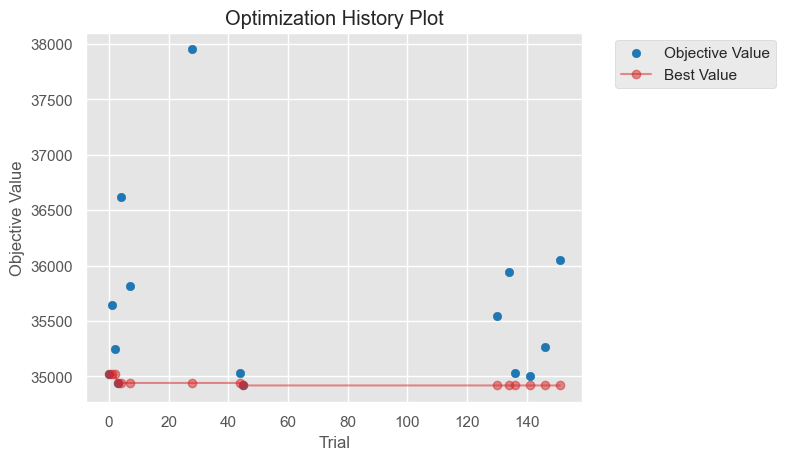

In [148]:
plot_optimization_history(study2_full);

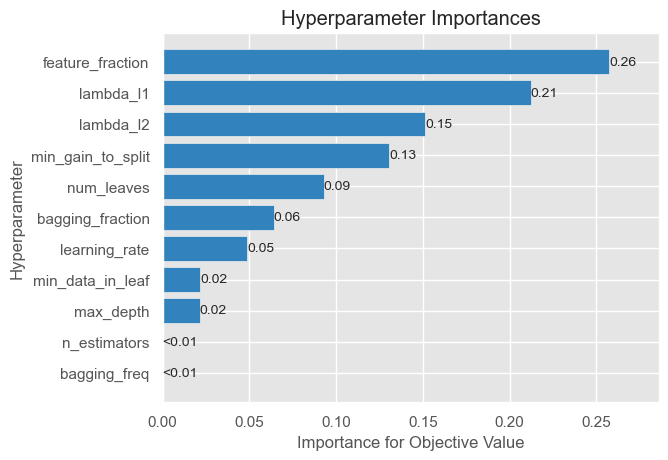

In [149]:
plot_param_importances(study2_full);

In [150]:
study2_full.best_trial.params

{'n_estimators': 10000,
 'learning_rate': 0.2763138252184725,
 'num_leaves': 620,
 'max_depth': 10,
 'min_data_in_leaf': 4000,
 'lambda_l1': 35,
 'lambda_l2': 70,
 'min_gain_to_split': 4.147157097212114,
 'bagging_fraction': 0.5,
 'bagging_freq': 1,
 'feature_fraction': 0.6}

In [151]:
params = {
    "objective": "regression",
    "boosting": "gbdt",
    "metric": "rmse",
    'n_estimators': 10000,
    'learning_rate': 0.2763138252184725,
    'num_leaves': 620,
    'max_depth': 10,
    'min_data_in_leaf': 4000,
    'lambda_l1': 35,
    'lambda_l2': 70,
    'min_gain_to_split': 4.147157097212114,
    'bagging_fraction': 0.5,
    'bagging_freq': 1,
    'feature_fraction': 0.6}

train_lgb = lgb.Dataset(X_half_1, label=y_half_1, categorical_feature=categorical_features, free_raw_data=False)
validation_lgb = lgb.Dataset(X_half_2, label=y_half_2, categorical_feature=categorical_features, free_raw_data=False)

watchlist = [train_lgb, validation_lgb]
lgb_model = lgb.train(params, train_set=train_lgb, num_boost_round=1000, valid_sets=watchlist, verbose_eval=200, early_stopping_rounds=200)

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.257576 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2784
[LightGBM] [Info] Number of data points in the train set: 10108050, number of used features: 19
[LightGBM] [Info] Start training from score 4.032965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[16]	training's rmse: 1.01619	valid_1's rmse: 1.50643


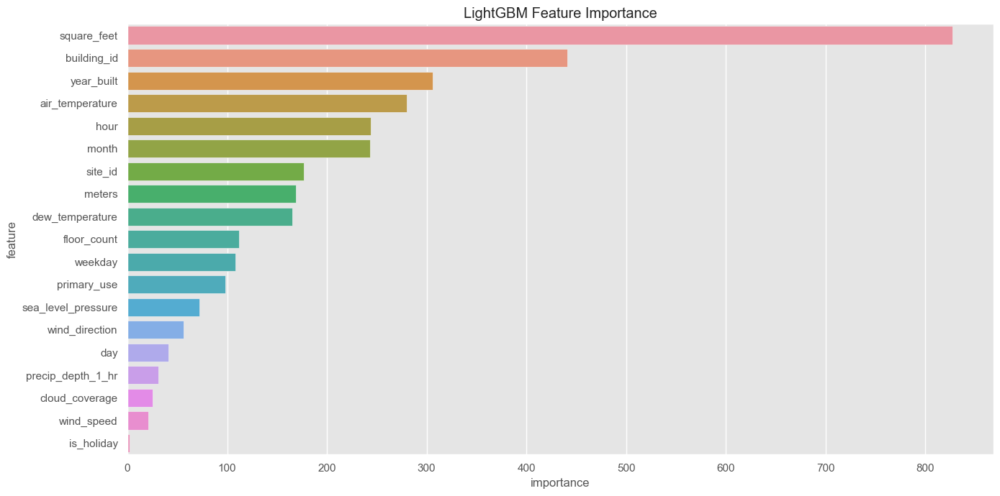

In [152]:
df_fimp = pd.DataFrame()
df_fimp["feature"] = train_lgb.feature_name
df_fimp["importance"] = lgb_model.feature_importance()

plt.figure(figsize=(14, 7))
sns.barplot(x="importance", y="feature", data=df_fimp.sort_values(by="importance", ascending=False))
plt.title("LightGBM Feature Importance")
plt.tight_layout()

**With this scaling**, we can see that **our model is able to provide non constant outputs**

In [153]:
y_pred = lgb_model.predict(X_test)
y_pred = y_pred.reshape(len(y_pred),1)
y_pred = np.expm1(y_pred)
row_ids = X_test.reset_index()['index'].values

In [154]:
submission = pd.DataFrame({"row_id": row_ids, "meter_reading": np.clip(np.clip(y_pred, 0, a_max=None).reshape(len(y_pred)), 0, a_max=None)})
submission.to_csv("submission_log_07_02_2022_outliers_optuna.csv", index=False)

Score on Kaggle: **1.547**

## RNN methods

We will test another method: **RNNs**. 

In order to use this kind of model, we need to transform our data to create inputs with correct shapes.

The **shape for our training set** will be as followed: **(# building<>Meter, defined timestamp, features).**

In [79]:
# Download all the different data
train_raw = pd.read_csv("train.csv", sep = ',')
test_raw = pd.read_csv("test.csv", sep = ',')
b_meta = pd.read_csv("building_metadata.csv",sep = ',')
w_train = pd.read_csv("weather_train.csv",sep = ',')
w_test = pd.read_csv("weather_test.csv",sep = ',')
sample = pd.read_csv("sample_submission.csv",sep = ',')

In [80]:
# We reduce memory usage to preserve RAM
train_raw = reduce_mem_usage(train_raw, use_float16=True)
test_raw = reduce_mem_usage(test_raw, use_float16=True)
b_meta = reduce_mem_usage(b_meta, use_float16=True)
w_train = reduce_mem_usage(w_train, use_float16=True)
w_test = reduce_mem_usage(w_test, use_float16=True)
sample = reduce_mem_usage(sample, use_float16=True)

Memory usage of dataframe is 616.95 MB
Memory usage after optimization is: 173.84 MB
Decreased by 71.8%
Memory usage of dataframe is 1272.51 MB
Memory usage after optimization is: 358.53 MB
Decreased by 71.8%
Memory usage of dataframe is 0.07 MB
Memory usage after optimization is: 0.02 MB
Decreased by 73.9%
Memory usage of dataframe is 9.60 MB
Memory usage after optimization is: 2.59 MB
Decreased by 73.1%
Memory usage of dataframe is 19.04 MB
Memory usage after optimization is: 5.13 MB
Decreased by 73.0%
Memory usage of dataframe is 636.26 MB
Memory usage after optimization is: 198.83 MB
Decreased by 68.7%


**Prepare Building Metadata**

In [81]:
year_built_gp = b_meta.groupby('site_id')['year_built']

In [82]:
# Fill in missing year_built with the mean of other buildings in the same site; 
# if none of the buildings in a site has year_built, then fill with the mean of the entire dataset
year_built_gp = b_meta.groupby('site_id')['year_built']
b_meta['year_built'] = year_built_gp.transform(lambda x: x.fillna(np.floor(x.astype(float).mean())))
b_meta['year_built'].fillna(np.floor(np.nanmean(b_meta['year_built'].astype(float))), inplace=True)
assert pd.isnull(b_meta['year_built']).sum() == 0


# Fill in missing floor_count with the mean of other buildings of the same primary_use; 
# if none of the buildings of a primary use has year_built, then fill with the mean of the entire dataset
floor_count_gp = b_meta.groupby('primary_use')['floor_count']
b_meta['floor_count'] = floor_count_gp.transform(lambda x: x.fillna(np.floor(x.astype(float).mean())))
b_meta['floor_count'].fillna(np.floor(np.nanmean(b_meta['floor_count'].astype(float))), inplace=True)
assert pd.isnull(b_meta['floor_count']).sum() == 0

# To conserve RAM:
del year_built_gp, floor_count_gp

gc.collect()

1268

**Weather data**

In [83]:
# The following function is inspired by https://www.kaggle.com/aitude/ashrae-missing-weather-data-handling
def add_missing_hours(weather_df):
    import datetime
    time_format = "%Y-%m-%d %H:%M:%S"
    start_date = datetime.datetime.strptime(weather_df['timestamp'].cat.as_ordered().min(),time_format)
    end_date = datetime.datetime.strptime(weather_df['timestamp'].cat.as_ordered().max(),time_format)
    total_hours = int(((end_date - start_date).total_seconds() + 3600) / 3600)
    hours_list = [(end_date - datetime.timedelta(hours=x)).strftime(time_format) for x in range(total_hours)]

    for site_id in range(16):
        site_hours = np.array(weather_df[weather_df['site_id'] == site_id]['timestamp'])
        new_rows = pd.DataFrame(np.setdiff1d(hours_list,site_hours),columns=['timestamp'])
        new_rows['site_id'] = site_id
        weather_df = pd.concat([weather_df,new_rows]).reset_index(drop=True)
    return weather_df

w_train = add_missing_hours(w_train)
w_test = add_missing_hours(w_test)

In [84]:
weath_col = ['air_temperature', 'cloud_coverage',
       'dew_temperature', 'precip_depth_1_hr', 'sea_level_pressure',
       'wind_direction', 'wind_speed']

## Train set
# Interpolate the missing data
for i in range(w_train['site_id'].nunique()):
    w_train[w_train['site_id']==i] = w_train[w_train['site_id']==i].sort_values(by='timestamp').interpolate(method='linear', limit_direction='forward', axis=0)

# for the remaining missing values, we impute with the mean values of the site id x month
w_train['timestamp'] = pd.to_datetime(w_train['timestamp'])
w_train['month'] = w_train['timestamp'].dt.month
gp = w_train.groupby(['site_id', 'month'])
for col in weath_col:
    w_train[col] = gp[col].transform(lambda x: x.fillna(np.floor(x.astype(float).mean())))
    w_train[col].fillna(np.nanmean(w_train[col].astype(float)), inplace=True)

    
# We do the same with the test set
for i in range(w_test['site_id'].nunique()):
    w_test[w_test['site_id']==i] = w_test[w_test['site_id']==i].sort_values(by='timestamp').interpolate(method='linear', limit_direction='forward', axis=0)

w_test['timestamp'] = pd.to_datetime(w_test['timestamp'])
w_test['month'] = w_test['timestamp'].dt.month
gp = w_test.groupby(['site_id', 'month'])
for col in weath_col:
    w_test[col] = gp[col].transform(lambda x: x.fillna(np.floor(x.astype(float).mean())))
    w_test[col].fillna(np.nanmean(w_test[col].astype(float)), inplace=True)

**Preparing all data**

In [85]:
# Combination if all dates possible in train and test sets
all_dates_train = pd.DataFrame(np.sort(train_raw['timestamp'].unique()),columns=['timestamp'])
all_dates_test = pd.DataFrame(np.sort(test_raw['timestamp'].unique()),columns=['timestamp'])

In [86]:
# Combination if all building possible in train and test sets
all_building_train = pd.DataFrame(train_raw['building_id'].unique(),columns=['building_id'])
all_building_test = pd.DataFrame(test_raw['building_id'].unique(),columns=['building_id'])

In [87]:
# Combination if all building and meter combinations in train and test sets
all_building_meter_train = train_raw.groupby(['building_id','meter']).size().reset_index().drop(0,axis=1)
all_building_meter_test = test_raw.groupby(['building_id','meter']).size().reset_index().drop(0,axis=1)

In [88]:
# Preparing keys to proceed a cross join
all_dates_train['key'] = 0
all_building_train['key'] = 0
all_dates_test['key'] = 0
all_building_test['key'] = 0
all_building_meter_train['key'] = 0
all_building_meter_test['key'] = 0

In [89]:
# Join meter, building ids and dates altogether
building_time_train = all_building_meter_train.merge(all_dates_train, on='key', how='outer').drop('key',axis=1)
building_time_test = all_building_meter_train.merge(all_dates_test, on='key', how='outer').drop('key',axis=1)

In [90]:
# Joining building metadata
building_full_train = building_time_train.merge(b_meta, on='building_id')
building_full_test = building_time_test.merge(b_meta, on='building_id')

In [91]:
# Joining data with train and test data
train_full = building_full_train.merge(train_raw,on=['building_id','timestamp','meter'], how='left')
test_full = building_full_test.merge(test_raw,on=['building_id','timestamp','meter'], how='left')

In [92]:
# Converting to datetime
train_full['timestamp'] = pd.to_datetime(train_full['timestamp'])
test_full['timestamp'] = pd.to_datetime(test_full['timestamp'])
# Joining weather data
train_full = train_full.merge(w_train, on=['site_id','timestamp'], how='left')
test_full = test_full.merge(w_test, on=['site_id','timestamp'], how='left')

In [93]:
# clearing memory
del all_dates_train, all_building_train, all_dates_test, all_building_test
gc.collect()
all_building_meter_train.drop('key',axis=1, inplace=True)
all_building_meter_test.drop('key',axis=1, inplace=True)

In [94]:
# Some variables to variate feature engineering
test = "ok" # Apply feature engineering to test set

# Some variables for features engineering
holidays = ["2016-01-01", "2016-01-18", "2016-02-15", "2016-05-30", "2016-07-04",
            "2016-09-05", "2016-10-10", "2016-11-11", "2016-11-24", "2016-12-26",
            "2017-01-01", "2017-01-16", "2017-02-20", "2017-05-29", "2017-07-04",
            "2017-09-04", "2017-10-09", "2017-11-10", "2017-11-23", "2017-12-25",
            "2018-01-01", "2018-01-15", "2018-02-19", "2018-05-28", "2018-07-04",
            "2018-09-03", "2018-10-08", "2018-11-12", "2018-11-22", "2018-12-25",
            "2019-01-01"]

features_label = ['building_id', 'site_id', 'primary_use',
       'square_feet', 'year_built', 'floor_count', 'air_temperature',
       'cloud_coverage', 'dew_temperature', 'precip_depth_1_hr',
       'sea_level_pressure', 'wind_direction', 'wind_speed', 'meter', 'month', 'weekday',
       'hour', 'day', 'is_holiday']

numerical_features = ['square_feet',
       'year_built', 'floor_count', 'air_temperature',
       'dew_temperature', 'precip_depth_1_hr', 'sea_level_pressure',
       'wind_direction', 'wind_speed']

categorical_features = ["building_id", "site_id", "meters", "primary_use", "hour", "weekday", "month", "cloud_coverage", "is_holiday"]

train_full['timestamp'] = pd.to_datetime(train_full['timestamp'])
test_full['timestamp'] = pd.to_datetime(test_full['timestamp'])

# Label Encode Primary Use
le = LabelEncoder()
train_full['primary_use'] = le.fit_transform(train_full['primary_use'])

if test is not None:
    test_full['primary_use'] = le.transform(test_full['primary_use'])


# Extract information from timestamp
train_full['month'] = train_full['timestamp'].dt.month
train_full['weekday'] = train_full['timestamp'].dt.weekday
train_full['hour'] = train_full['timestamp'].dt.hour
train_full['day'] = train_full['timestamp'].dt.day

if test is not None:
    test_full['month'] = test_full['timestamp'].dt.month
    test_full['weekday'] = test_full['timestamp'].dt.weekday
    test_full['hour'] = test_full['timestamp'].dt.hour
    test_full['day'] = test_full['timestamp'].dt.day

    
# Add holidays feature
train_full["is_holiday"] = (train_full['timestamp'].dt.date.astype("str").isin(holidays)).astype(int)

if test is not None:
    test_full["is_holiday"] = (test_full['timestamp'].dt.date.astype("str").isin(holidays)).astype(int) 
    

# Split train data for the scaling (in particular for minmaxscale)

train_full['square_feet'] = np.log1p(train_full['square_feet'])
train_full['meter_reading'] = np.log1p(train_full['meter_reading'])
if test is not None:
    test_full['square_feet'] = np.log1p(test_full['square_feet'])

**Padding the data**

After filling all the missing values, we will now prepare the data in order to have the wanted shape.

As all the building x meter does not have the same length historic, we will keep all the data having at least 8000 records in the train set.

In [95]:
threshold = 8000
train_pad = []
target_pad = []
for i, j in all_building_meter_train.values:
    # We want at least 8000 metric reading entries
    if train_full[(train_full['building_id']==i)&(train_full['meter']==j)].isna().sum()['meter_reading']<(8784-threshold): 
        train_pad.append(np.float32(train_full[(train_full['building_id']==i)&(train_full['meter']==j)][features_label].dropna()[-8000:]))
        target_pad.append(train_full[(train_full['building_id']==i)&(train_full['meter']==j)]['meter_reading'].dropna()[-8000:])


In [96]:
# Stack the data to get final train set
train_final = np.stack(train_pad)
target_final = np.array(target_pad)

In [61]:
print(train_final.shape, target_final.shape)

(2006, 8000, 19) (2006, 8000)


**Model Creation**

In [62]:
train_ds = tf.data.Dataset.from_tensor_slices((train_final, target_final))

In [63]:
# Create a simple RNN model
num_features = len(features_label)

model = tf.keras.Sequential()

# Add RNN: LSTM layer
model.add(tf.keras.layers.LSTM(units=32,
                               input_shape = (None, num_features),
                               dropout = 0.2, 
                               return_sequences = True)) 

# Add output layer
model.add(tf.keras.layers.Dense(1)) 


In [64]:
# Compile model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=5e-4),
              loss='mse',
              metrics=[tf.keras.metrics.RootMeanSquaredError()])#, 
                       #tf.keras.metrics.MeanSquaredLogarithmicError()])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, None, 32)          6656      
                                                                 
 dense (Dense)               (None, None, 1)           33        
                                                                 
Total params: 6,689
Trainable params: 6,689
Non-trainable params: 0
_________________________________________________________________


**Model Training**

In [65]:
# Train our RNN model
model.fit(train_ds.shuffle(50).batch(10), 
          epochs=30, 
          callbacks=tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3))

Epoch 1/30


2023-02-09 19:33:23.901125: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-02-09 19:33:23.908515: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-02-09 19:33:24.391997: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-02-09 19:36:52.627662: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


201/201 [==============================] - 11174s 46s/step - loss: 0.4127 - root_mean_squared_error: 0.6424
Epoch 2/30
201/201 [==============================] - 4438s 22s/step - loss: 0.3827 - root_mean_squared_error: 0.6186
Epoch 3/30
201/201 [==============================] - 3968s 20s/step - loss: 0.3789 - root_mean_squared_error: 0.6156
Epoch 4/30
201/201 [==============================] - 32820s 164s/step - loss: 0.3747 - root_mean_squared_error: 0.6122
Epoch 5/30
201/201 [==============================] - 5071s 24s/step - loss: 0.3710 - root_mean_squared_error: 0.6091
Epoch 6/30
201/201 [==============================] - 1538s 8s/step - loss: 0.3696 - root_mean_squared_error: 0.6079
Epoch 7/30
201/201 [==============================] - 1542s 8s/step - loss: 0.3680 - root_mean_squared_error: 0.6066
Epoch 8/30
201/201 [==============================] - 1552s 8s/step - loss: 0.3661 - root_mean_squared_error: 0.6050
Epoch 9/30
201/201 [==============================] - 1549s 8s/step

In [68]:
# Save our RNN model
model.save('rnn_model')

INFO:tensorflow:Assets written to: rnn_model/assets


INFO:tensorflow:Assets written to: rnn_model/assets


In [20]:
# Load model if necessary
#model = tf.keras.models.load_model('rnn_model')

2023-02-13 12:59:43.086860: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-02-13 12:59:43.087442: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Metal device set to: Apple M2


**Make Prediction**

In [64]:
test_full['meter_reading'] = np.zeros(test_full.shape[0], dtype=np.float32)

In [65]:
# make prediction on the test set
for i, j in all_building_meter_test.values:
    ts = np.expand_dims(test_full[(test_full['building_id']==i)&(test_full['meter']==j)][features_label].values, axis=0) 
    res = np.float32(np.expm1(model.predict(ts).squeeze()))
    del ts
    test_full.loc[(test_full['building_id']==i)&(test_full['meter']==j), 'meter_reading'] = res
    del res
gc.collect()

1/1 [==============================] - 18s 18s/step


1/1 [==============================] - 19s 19s/step


1/1 [==============================] - 17s 17s/step


1/1 [==============================] - 19s 19s/step


1/1 [==============================] - 17s 17s/step


1/1 [==============================] - 19s 19s/step


1/1 [==============================] - 18s 18s/step


1/1 [==============================] - 18s 18s/step


1/1 [==============================] - 19s 19s/step


1/1 [==============================] - 26s 26s/step


1/1 [==============================] - 20s 20s/step


1/1 [==============================] - 20s 20s/step


1/1 [==============================] - 17s 17s/step


1/1 [==============================] - 17s 17s/step


1/1 [==============================] - 18s 18s/step


1/1 [==============================] - 18s 18s/step


52928

In [70]:
sample_sub = pd.read_csv('sample_submission.csv',
                         usecols=['row_id'])

In [72]:
sample_sub = sample_sub.merge(test_full[['row_id', 'meter_reading']], on='row_id')

In [74]:
# save for submissions on Kaggle
sample_sub.to_csv('submission_14_02_2023.csv', index=False)

Results on Kaggle: **1.653**

# Conclusion & Further Improvements

**CONCLUSION**

<ins> EDA <ins>
- In this Kernel, we have done first a deep EDA enabling us to understand what is our train and test set and what are their caracteristics. 

<ins>Feature Engineering<ins>
- After that, we have tried several technics with the data engineering with a various combination between label encoding vs min-max scaling vs standard scaling vs log scaling, label encoding vs one-hot encoding. We have chosen the most promising ones using a simple LightGBM model and a sample of our train set. 


<ins> LightGBM Optimization <ins>
- Using these best feature engineerings, we have optimized our LightGBM model using Optuna during its training. We have been able to see the improvements that we have had using Optuna.

<ins> RNN Model <ins>
- Finally, we have tried another approach with a RNN model. To do so, we have used a simple one layer LSTM model. Some specific feature engineerings have been done: 1) make train and test sets' shape adapted for our model and 2) make some imputations on missing data, scale data or encode features.

**POSSIBLE IMPROVEMENTS**

Some improvements can be done in this Kernel. 

- For the EDA part: when possible display meter_reading to vizualize potential correlation with the feature
- For the feature engineering part: 1) See the correlation between the different features, 2) Do a better imputation for the missing values
- For the modelling part, 1) make a better cross validation using for example  a blocked cross validation instead of a half and half validation, 3) improve the RNN model using a more complex one and try some more regularization.


# Trash

## Feature Engineering

In [37]:
train_full.to_csv('train_full_wo_outliers.csv',index=False)
test_full.to_csv('test_full.csv',index=False)

In [ ]:
train_full = pd.read_csv('train_full_wo_outliers.csv')
test_full = pd.read_csv('train_full_wo_outliers.csv')

In [57]:
train_sample = train_full.sample(frac=0.05, random_state=25)

### Primary Use

#### One-Hot Encode "Primary Use"

In [59]:
train_full2 = one_hot(train_sample, 'primary_use')
#train_full2 = one_hot(train_full, 'primary_use')

In [60]:
train_full2.columns

Index(['building_id', 'timestamp', 'meter_reading', 'site_id', 'square_feet',
       'year_built', 'floor_count', 'air_temperature', 'cloud_coverage',
       'dew_temperature', 'precip_depth_1_hr', 'sea_level_pressure',
       'wind_direction', 'wind_speed', 'meters', 'meter__0', 'meter__1',
       'meter__2', 'meter__3', 'primary_uses', 'primary_use__Education',
       'primary_use__Entertainment/public assembly',
       'primary_use__Food sales and service', 'primary_use__Healthcare',
       'primary_use__Lodging/residential',
       'primary_use__Manufacturing/industrial', 'primary_use__Office',
       'primary_use__Other', 'primary_use__Parking',
       'primary_use__Public services', 'primary_use__Religious worship',
       'primary_use__Retail', 'primary_use__Services',
       'primary_use__Technology/science', 'primary_use__Utility',
       'primary_use__Warehouse/storage'],
      dtype='object')

#### Label Encode "Primary Use"

In [61]:
train_full3 = label_encode(train_sample, 'primary_use')
#train_full3 = label_encode(train_full, 'primary_use')

### Extract information from timestamp

#### Month, weekday, hour, day

In [62]:
train_full2 = extract_time_features(train_full2, 'timestamp')

train_full3 = extract_time_features(train_full3, 'timestamp')

In [63]:
train_full3.columns

Index(['building_id', 'timestamp', 'meter_reading', 'site_id', 'primary_use',
       'square_feet', 'year_built', 'floor_count', 'air_temperature',
       'cloud_coverage', 'dew_temperature', 'precip_depth_1_hr',
       'sea_level_pressure', 'wind_direction', 'wind_speed', 'meters',
       'meter__0', 'meter__1', 'meter__2', 'meter__3', 'month', 'weekday',
       'hour', 'day'],
      dtype='object')

#### Holidays

In [64]:
holidays = ["2016-01-01", "2016-01-18", "2016-02-15", "2016-05-30", "2016-07-04",
            "2016-09-05", "2016-10-10", "2016-11-11", "2016-11-24", "2016-12-26",
            "2017-01-01", "2017-01-16", "2017-02-20", "2017-05-29", "2017-07-04",
            "2017-09-04", "2017-10-09", "2017-11-10", "2017-11-23", "2017-12-25",
            "2018-01-01", "2018-01-15", "2018-02-19", "2018-05-28", "2018-07-04",
            "2018-09-03", "2018-10-08", "2018-11-12", "2018-11-22", "2018-12-25",
            "2019-01-01"]
train_full2 = add_holidays(train_full2, holidays)
train_full3 = add_holidays(train_full3, holidays)

### Scale Data

In [65]:
train_full21 = train_full2.copy()
train_full21['square_feet'] = np.log1p(train_full21['square_feet'])
train_full21['meter_reading'] = np.log1p(train_full21['meter_reading'])

train_full31 = train_full3.copy()
train_full31['square_feet'] = np.log1p(train_full31['square_feet'])
train_full31['meter_reading'] = np.log1p(train_full31['meter_reading'])

In [66]:
numerical_features = ['square_feet',
       'year_built', 'floor_count', 'air_temperature',
       'dew_temperature', 'precip_depth_1_hr', 'sea_level_pressure',
       'wind_direction', 'wind_speed']

y_feature = ['meter_reading']

train_full20 = scale_numerical_feature(train_full2, numerical_features)
train_full30 = scale_numerical_feature(train_full3, numerical_features)

train_full22 = scale_numerical_feature(train_full2, numerical_features)
y_scaler22 = MinMaxScaler()
y_train22 = y_scaler22.fit_transform(train_full2[['meter_reading']])

train_full32 = scale_numerical_feature(train_full3, numerical_features)
y_scaler32 = MinMaxScaler()
y_train32 = y_scaler32.fit_transform(train_full3[['meter_reading']])

train_full23 = train_full22.copy()
y_train23 = np.log1p(train_full2['meter_reading'])

train_full33 = train_full32.copy()
y_train33 = np.log1p(train_full3['meter_reading'])

train_full24 = train_full23.copy()
y_scaler24 = StandardScaler()
y_train24 = y_scaler24.fit_transform(train_full2[['meter_reading']])

train_full34 = train_full33.copy()
y_scaler34 = StandardScaler()
y_train34 = y_scaler34.fit_transform(train_full3[['meter_reading']])

**List of the different feature engineerings**

- train_full20: one-hot encoding for Primary_use, min max scale without meter_reading
- train_full21: one-hot encoding for Primary_use, simple scale on meter_reading & square_feet
- train_full22: one-hot encoding for Primary_use, min max scale with meter_reading
- train_full23: one-hot encoding for Primary_use, min max scale and log on meter_reading
- train_full24: one-hot encoding for Primary_use, min max scale and Standard scaler meter_reading
- train_full30: label encoding for Primary_use, min max scale without meter_reading
- train_full31: label encoding for Primary_use, simple scale on meter_reading & square_feet
- train_full32: label encoding for Primary_use, min max scale with meter_reading
- train_full33: label encoding for Primary_use, min max scale and log on meter_reading
- train_full34: label encoding for Primary_use, min max scale and Standard scaler meter_reading

In [67]:
# We prepare the features and target sets

features_one_hot = ['building_id', 'site_id', 'square_feet',
       'year_built', 'floor_count', 'air_temperature', 'cloud_coverage',
       'dew_temperature', 'precip_depth_1_hr', 'sea_level_pressure',
       'wind_direction', 'wind_speed', 'meters', 'primary_use__Education',
       'primary_use__Entertainment/public assembly',
       'primary_use__Food sales and service', 'primary_use__Healthcare',
       'primary_use__Lodging/residential',
       'primary_use__Manufacturing/industrial', 'primary_use__Office',
       'primary_use__Other', 'primary_use__Parking',
       'primary_use__Public services', 'primary_use__Religious worship',
       'primary_use__Retail', 'primary_use__Services',
       'primary_use__Technology/science', 'primary_use__Utility',
       'primary_use__Warehouse/storage', 'month', 'weekday', 'hour', 'day',
       'is_holiday']

features_label = ['building_id', 'site_id', 'primary_use',
       'square_feet', 'year_built', 'floor_count', 'air_temperature',
       'cloud_coverage', 'dew_temperature', 'precip_depth_1_hr',
       'sea_level_pressure', 'wind_direction', 'wind_speed', 'meters', 'month', 'weekday',
       'hour', 'day', 'is_holiday']

X_train20 = train_full20[features_one_hot]
X_train21 = train_full21[features_one_hot]
X_train22 = train_full22[features_one_hot]
X_train23 = train_full23[features_one_hot]
X_train24 = train_full24[features_one_hot]
y_train20 = train_full20['meter_reading']
y_train21 = train_full21['meter_reading']

del train_full20, train_full21, train_full22, train_full23
gc.collect()

X_train30 = train_full30[features_label]
X_train31 = train_full31[features_label]
X_train32 = train_full32[features_label]
X_train33 = train_full33[features_label]
X_train34 = train_full34[features_label]
y_train30 = train_full30['meter_reading']
y_train31 = train_full31['meter_reading']

del train_full30, train_full31, train_full32, train_full33
gc.collect()

0

In [69]:
params = {
    "objective": "regression",
    "boosting": "gbdt",
    "num_leaves": 40,
    "learning_rate": 0.05,
    "feature_fraction": 0.85,
    "reg_lambda": 2,
    "metric": "rmse"
}

categorical_features = ["building_id", "site_id", "meters", "primary_use", "hour", "weekday", "month", "cloud_coverage", "is_holiday"]

categorical_features_onehot = ["building_id", "site_id", "meters", "hour", "weekday", "month", "cloud_coverage", "is_holiday",
        'primary_use__Education',
       'primary_use__Entertainment/public assembly',
       'primary_use__Food sales and service', 'primary_use__Healthcare',
       'primary_use__Lodging/residential',
       'primary_use__Manufacturing/industrial', 'primary_use__Office',
       'primary_use__Other', 'primary_use__Parking',
       'primary_use__Public services', 'primary_use__Religious worship',
       'primary_use__Retail', 'primary_use__Services',
       'primary_use__Technology/science', 'primary_use__Utility',
       'primary_use__Warehouse/storage']

res={}
models={}


for i in ['20','21','22','23','24','30','31', '32', '33','34']:
    # we split data into two halves
    X_half_1 = eval('X_train'+i)[:int(eval('X_train'+i).shape[0] / 2)]
    X_half_2 = eval('X_train'+i)[int(eval('X_train'+i).shape[0] / 2):]

    y_half_1 = eval('y_train'+i)[:int(eval('y_train'+i).shape[0] / 2)]
    y_half_2 = eval('y_train'+i)[int(eval('y_train'+i).shape[0] / 2):]
    
    # If feature engineering contains label encoding
    if i.startswith('3'):
        train_lgb = lgb.Dataset(X_half_1, label=y_half_1, categorical_feature=categorical_features, free_raw_data=False)
        validation_lgb = lgb.Dataset(X_half_2, label=y_half_2, categorical_feature=categorical_features, free_raw_data=False)

    # If feature engineering contains one hot encoding
    else:
        train_lgb = lgb.Dataset(X_half_1, label=y_half_1, categorical_feature=categorical_features_onehot, free_raw_data=False)
        validation_lgb = lgb.Dataset(X_half_2, label=y_half_2, categorical_feature=categorical_features_onehot, free_raw_data=False)

    watchlist = [train_lgb, validation_lgb]
    print(i)
    lgb_model = lgb.train(params, train_set=train_lgb, num_boost_round=1000, valid_sets=watchlist, verbose_eval=200, early_stopping_rounds=200)
    lgb_model.best_score['training']['training_rmse'+i] = lgb_model.best_score['training'].pop('rmse')
    lgb_model.best_score['valid_1']['validation_rmse'+i] = lgb_model.best_score['valid_1'].pop('rmse')
    res.update(lgb_model.best_score['training'])
    res.update(lgb_model.best_score['valid_1'])
    models[i] = lgb_model

20
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018547 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2812
[LightGBM] [Info] Number of data points in the train set: 505183, number of used features: 34
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 422.942701
Training until validation scores don't improve for 200 rounds
[200]	training's rmse: 506.87	valid_1's rmse: 4875.06
[400]	training's rmse: 418.78	valid_1's rmse: 4873.64
Early stopping, best iteration is:
[376]	training's rmse: 424.714	valid_1's rmse: 4873.35
21
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testi

In [70]:
res_f = {}
for i in ['20','21','22','23','24','30','31', '32', '33','34']:
    X_half_2 = eval('X_train'+i)[int(eval('X_train'+i).shape[0] / 2):]
    y_half_2 = eval('y_train'+i)[int(eval('y_train'+i).shape[0] / 2):]
    if i.endswith(('2','4')):
        y_val = eval('y_scaler'+i).inverse_transform(y_half_2)
        y_pred =  models[i].predict(X_half_2)
        y_pred = y_pred.reshape(len(y_pred),1)
        y_pred = eval('y_scaler'+i).inverse_transform(y_pred)
    elif i.endswith(('1','3')):
        y_val = np.expm1(y_half_2)
        y_pred = models[i].predict(X_half_2)
        y_pred = y_pred.reshape(len(y_pred),1)
        y_pred = np.expm1(y_pred)
    else:
        y_val = y_half_2.copy()
        y_pred = models[i].predict(X_half_2)
        y_pred = y_pred.reshape(len(y_pred),1)
        
    res_f[i] = np.sqrt(mean_squared_error(y_val,y_pred))
    res_f['y_pred'+i] = y_pred[0:5]